<table>
  <tr>
    <td style="border: none; padding-right: 20px;">
      <img src="logo_uni.png" width="300" style="margin: 0; padding: 0;">
    </td>
    <td style="border: none; vertical-align: middle;">
      <h1 style="margin: 0;">Airline Customer Segmentation</h1>
      <p style="margin: 0; font-size: 18px;">Master in Data Science - 2025/26</p>
      <p style="margin: 0; font-style: italic;">Developed by: <b>[Alexandre Coelho, 20250475], [Bruna Sousa, 20250526], [Rui Ferreira, 20250473] 
</b></p>
    </td>
  </tr>
</table>

In [297]:
import os
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import matplotlib as mpl
import matplotlib.colors as mpl_colors
import umap
from scipy import stats
from narwhals.stable.v1 import Datetime
from sklearn.cluster import KMeans, HDBSCAN, DBSCAN, AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from collections import Counter
import functions as func
from scipy.cluster.hierarchy import dendrogram
import matplotlib.patches as mpatches
from mpl_toolkits.axes_grid1 import make_axes_locatable
from minisom import MiniSom
import scipy.cluster.hierarchy as sch
import plotly.express as px
from sklearn.tree import DecisionTreeClassifier


In [298]:
try:
    from functions import *
    print("SUCCESS: Custom functions loaded correctly from 'my_functions.py'.")
except ImportError:
    print("ERROR: Could not find 'my_functions.py'. Make sure the file is in the same folder as this notebook.")

SUCCESS: Custom functions loaded correctly from 'my_functions.py'.


## Table of Contents
- [Business Understanding](#business-understanding)
- [Data Understanding](#data-understanding)
  - [Customer Database](#customer-database)
    - [Reading the data](#reading-the-data)
    - [Metadata](#metadata)
    - [Initial Analysis](#initial-analysis)
    - [Data Quality Checks](#data-quality-checks)
  - [Flights Database](#flights-database)
    - [Reading the data](#reading-the-data-1)
    - [Metadata](#metadata-1)
    - [Initial Analysis](#initial-analysis-1)
    - [Data Quality Checks](#data-quality-checks-1)
- [Data Preparation](#data-preparation)
  - [Customers Database](#customers-database)
    - [Data Types](#data-types)
    - [Duplicates](#duplicates)
    - [Missing Values](#missing-values)
    - [Coherence Check](#coherence-check)
  - [Flights Database](#flights-database-1)
    - [Data Types](#data-types-1)
    - [Duplicates](#duplicates-1)
    - [Coherence Check](#coherence-check-1)
    - [Coherence Check on both databases](#coherence-check-on-both-databases)
- [Data Exploration](#data-exploration)
  - [Customer](#customer)
  - [Distributions of Categorical Features](#distributions-of-categorical-features)
  - [Distribution of Numerical Features](#distribution-of-numerical-features)

## 1. Business Understanding

AIAI aims to use customer data to understand their behaviors, with the goal of improving satisfaction, customer value, and profitability. The main challenge is to segment customers based on their travel habits and loyalty, enabling the creation of personalized marketing and optimized services. The project aims to transform these analytical findings into actionable business strategies.

## 2. Data Understanding

### 2.1 Customer Database

#### 2.1.1 Reading the data

In [299]:
customer_data = pd.read_csv("DM_AIAI_CustomerDB.csv",index_col=0)

#### 2.1.2 Metadata
- *Loyalty#* - Unique customer identifier for loyalty program members
- *First Name* - Customer's first name
- *Last Name* -	Customer's last name
- *Customer Name* - Customer's full name (concatenated)
- *Country* - Customer's country of residence
- *Province or State* - Customer's province or state
- *City* - Customer's city of residence
- *Latitude* - Geographic latitude coordinate of customer location
- *Longitude* - Geographic longitude coordinate of customer location
- *Postal code* - Customer's postal/ZIP code
- *Gender* - Customer's gender
- *Education* - Customer's highest education level (Bachelor, College, etc.)
- *Location Code*- Urban/Suburban/Rural classification of customer residence
- *Income* - Customer's annual income
- *Marital Status* - Customer's marital status (Married, Single, Divorced)
- *LoyaltyStatus* - Current tier status in loyalty program (Star > Nova > Aurora)
- *EnrollmentDateOpening* - Date when customer joined the loyalty program
- *CancellationDate* - Date when customer left the program
- *Customer Lifetime Value* - Total calculated monetary value of customer relationship
- *EnrollmentType* - Method of joining loyalty program


#### 2.1.3 Initial Analysis
General idea of the data structure, column names and types of values each variable contains.

In [300]:
customer = customer_data.copy()
customer.head(3)

,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,Postal code,Gender,Education,Location Code,Income,Marital Status,LoyaltyStatus,EnrollmentDateOpening,CancellationDate,Customer Lifetime Value,EnrollmentType
0,480934,Cecilia,Householder,Cecilia Householder,Canada,Ontario,Toronto,43.653225,-79.383186,M2Z 4K1,female,Bachelor,Urban,70146.0,Married,Star,2/15/2019,NaN,3839.14,Standard
1,549612,Dayle,Menez,Dayle Menez,Canada,Alberta,Edmonton,53.544388,-113.490930,T3G 6Y6,male,College,Rural,0.0,Divorced,Star,3/9/2019,NaN,3839.61,Standard
2,429460,Necole,Hannon,Necole Hannon,Canada,British Columbia,Vancouver,49.282730,-123.120740,V6E 3D9,male,College,Urban,0.0,Single,Star,7/14/2017,1/8/2021,3839.75,Standard


In [301]:
print(f"Numbers of lines and columns: {customer.shape}")

Numbers of lines and columns: (16921, 20)


In [302]:
customer.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16921 entries, 0 to 19
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Loyalty#                 16921 non-null  int64  
 1   First Name               16921 non-null  object 
 2   Last Name                16921 non-null  object 
 3   Customer Name            16921 non-null  object 
 4   Country                  16921 non-null  object 
 5   Province or State        16921 non-null  object 
 6   City                     16921 non-null  object 
 7   Latitude                 16921 non-null  float64
 8   Longitude                16921 non-null  float64
 9   Postal code              16921 non-null  object 
 10  Gender                   16921 non-null  object 
 11  Education                16921 non-null  object 
 12  Location Code            16921 non-null  object 
 13  Income                   16901 non-null  float64
 14  Marital Status           16921

In [303]:
customer.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Loyalty#,16921.0,NaN,NaN,NaN,550197.393771,259251.503597,100011.0,326823.0,550896.0,772438.0,999999.0
First Name,16921,4941,Stacey,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Last Name,16921,15404,Ypina,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer Name,16921,16921,Cecilia Householder,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Country,16921,1,Canada,16921,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Province or State,16921,11,Ontario,5468,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City,16921,29,Toronto,3390,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Latitude,16921.0,NaN,NaN,NaN,47.1745,3.307971,42.984924,44.231171,46.087818,49.28273,60.721188
Longitude,16921.0,NaN,NaN,NaN,-91.814768,22.242429,-135.05684,-120.23766,-79.383186,-74.596184,-52.712578
Postal code,16921,75,V6E 3D9,917,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### 2.1.4 Data Quality Checks

In [304]:
customer.replace("", np.nan, inplace=True)
customer.isna().sum()

Loyalty#                       0
First Name                     0
Last Name                      0
Customer Name                  0
Country                        0
Province or State              0
City                           0
Latitude                       0
Longitude                      0
Postal code                    0
Gender                         0
Education                      0
Location Code                  0
Income                        20
Marital Status                 0
LoyaltyStatus                  0
EnrollmentDateOpening          0
CancellationDate           14611
Customer Lifetime Value       20
EnrollmentType                 0
dtype: int64

We have 20 customers without income data, 20 customers without Customer Lifetime Value data and 14611 customers without CancellationDate data.

In [305]:
customer.duplicated().sum()

np.int64(0)

We have no duplicated rows in our data.

### 2.2 Flights Database

#### 2.2.1 Reading the data

In [306]:
flight_data = pd.read_csv("DM_AIAI_FlightsDB.csv")

#### 2.2.2 Metadata
- *Variable* - Description
- *Loyalty#* - Unique customer identifier linking to CustomerDB
- *Year* -	Year of flight activity record
- *Month* - Month of flight activity record (1-12)
- *YearMonthDate* - First day of the month for the activity period
- *NumFlights* - Total number of flights taken by customer in the month
- *NumFlightsWithCompanions* - Number of flights where customer traveled with companions
- *DistanceKM* - Total distance traveled in kilometers for the month
- *PointsAccumulated* - Loyalty points earned by customer during the month
- *PointsRedeemed* - Loyalty points spent/redeemed by customer during the month
- *DollarCostPointsRedeemed* - Dollar value of points redeemed during the month

#### 2.2.3 Initial Analysis

General idea of the data structure, column names and types of values each variable contains.

In [307]:
flight = flight_data.copy()
flight.head(3)

,Loyalty#,Year,Month,YearMonthDate,NumFlights,NumFlightsWithCompanions,DistanceKM,PointsAccumulated,PointsRedeemed,DollarCostPointsRedeemed
0,413052,2021,12,12/1/2021,2.0,2.0,9384.0,938.0,0.0,0.0
1,464105,2021,12,12/1/2021,0.0,0.0,0.0,0.0,0.0,0.0
2,681785,2021,12,12/1/2021,10.0,3.0,14745.0,1474.0,0.0,0.0


In [308]:
print(f"Numbers of lines and columns: {flight.shape}")

Numbers of lines and columns: (608436, 10)


In [309]:
flight.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 608436 entries, 0 to 608435
Data columns (total 10 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Loyalty#                  608436 non-null  int64  
 1   Year                      608436 non-null  int64  
 2   Month                     608436 non-null  int64  
 3   YearMonthDate             608436 non-null  object 
 4   NumFlights                608436 non-null  float64
 5   NumFlightsWithCompanions  608436 non-null  float64
 6   DistanceKM                608436 non-null  float64
 7   PointsAccumulated         608436 non-null  float64
 8   PointsRedeemed            608436 non-null  float64
 9   DollarCostPointsRedeemed  608436 non-null  float64
dtypes: float64(6), int64(3), object(1)
memory usage: 46.4+ MB


In [310]:
flight.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Loyalty#,608436.0,NaN,NaN,NaN,550037.873084,258935.180575,100018.0,326961.0,550834.0,772194.0,999986.0
Year,608436.0,NaN,NaN,NaN,2020.0,0.816497,2019.0,2019.0,2020.0,2021.0,2021.0
Month,608436.0,NaN,NaN,NaN,6.5,3.452055,1.0,3.75,6.5,9.25,12.0
YearMonthDate,608436,36,12/1/2021,16901,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumFlights,608436.0,NaN,NaN,NaN,3.908107,5.057889,0.0,0.0,0.0,7.2,21.0
NumFlightsWithCompanions,608436.0,NaN,NaN,NaN,0.983944,2.003785,0.0,0.0,0.0,0.9,11.0
DistanceKM,608436.0,NaN,NaN,NaN,7939.341419,10260.421873,0.0,0.0,856.4,15338.175,42040.0
PointsAccumulated,608436.0,NaN,NaN,NaN,793.777781,1025.918521,0.0,0.0,85.275,1533.7125,4204.0
PointsRedeemed,608436.0,NaN,NaN,NaN,235.251678,983.233374,0.0,0.0,0.0,0.0,7496.0
DollarCostPointsRedeemed,608436.0,NaN,NaN,NaN,2.324835,9.725168,0.0,0.0,0.0,0.0,74.0


#### 2.2.4 Data Quality Checks

In [311]:
flight.replace("", np.nan, inplace=True)
flight.isna().sum()

Loyalty#                    0
Year                        0
Month                       0
YearMonthDate               0
NumFlights                  0
NumFlightsWithCompanions    0
DistanceKM                  0
PointsAccumulated           0
PointsRedeemed              0
DollarCostPointsRedeemed    0
dtype: int64

We have no missing data.

In [312]:
flight.duplicated().sum()

np.int64(2903)

We have 2903 duplicated rowns in our data, that we will look at later.

## 3. Data Preparation

### 3.1 Customers Database

#### 3.1.1 Data Types

In [313]:
customer.dtypes

Loyalty#                     int64
First Name                  object
Last Name                   object
Customer Name               object
Country                     object
Province or State           object
City                        object
Latitude                   float64
Longitude                  float64
Postal code                 object
Gender                      object
Education                   object
Location Code               object
Income                     float64
Marital Status              object
LoyaltyStatus               object
EnrollmentDateOpening       object
CancellationDate            object
Customer Lifetime Value    float64
EnrollmentType              object
dtype: object

The Enrollment Date Opening and Cancellation Dates can be converted to datetime type.

In [314]:
customer["EnrollmentDateOpening"] = pd.to_datetime(customer["EnrollmentDateOpening"])
customer["CancellationDate"] = pd.to_datetime(customer["CancellationDate"], errors="coerce")

#### 3.1.2 Duplicates

To use the 'Loyalty#' column as the dataframe's index, it was essential to first confirm that it contained only unique values. An index acts as a primary key for data retrieval, and duplicate entries would make this unreliable.

Upon inspection, some 'Loyalty#' IDs were found to be duplicated. Since there was no clear way to determine which entry represented the true customer record (the "source of truth"), the most robust decision was to remove all records associated with these ambiguous IDs. This data cleansing step ensures the integrity of the dataset, leaving only customers with a single, unique 'Loyalty#' identifier, which can now be reliably set as the index.

In [315]:
duplicated_loyalty = customer_data.duplicated(subset=['Loyalty#'], keep=False)
duplicated_loyalty_list = customer_data[duplicated_loyalty]['Loyalty#'].unique()
print(f"Duplicated Loyaltys {len(duplicated_loyalty_list)}")
customer = customer[customer['Loyalty#'].isin(duplicated_loyalty_list) == False]
print(f"For the initial customer data we have {len(customer_data)} records.\n"
      f"We identified {len(duplicated_loyalty_list)} 'Loyalty#' IDs that were duplicated or appears repeatedly.\n"
      f"So the final len of the data set is {len(customer)}.")

Duplicated Loyaltys 163
For the initial customer data we have 16921 records.
We identified 163 'Loyalty#' IDs that were duplicated or appears repeatedly.
So the final len of the data set is 16594.


In [316]:
customer.set_index("Loyalty#", inplace=True)

#### 3.1.3 Missing Values

In [317]:
customer[customer["Income"].isna()].tail(3)

,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,Postal code,Gender,Education,Location Code,Income,Marital Status,LoyaltyStatus,EnrollmentDateOpening,CancellationDate,Customer Lifetime Value,EnrollmentType
Loyalty#,,,,,,,,,,,,,,,,,,,
100014,Amelia,Bennett,Amelia Bennett,Canada,New Brunswick,Moncton,46.051866,-64.825428,G2S 2B6,male,Bachelor,Rural,NaN,Married,Star,2020-11-28,2020-11-28,NaN,Standard
100015,Benjamin,Wilson,Benjamin Wilson,Canada,Quebec,Quebec City,46.862970,-71.133444,B1Z 8T3,female,College,Urban,NaN,Married,Star,2020-04-09,2020-04-09,NaN,Standard
100016,Emma,Martin,Emma Martin,Canada,British Columbia,Dawson Creek,55.720562,-120.160090,M4A 1E4,female,Master,Suburban,NaN,Single,Star,2020-07-21,2020-07-21,NaN,Standard


The customers with missing income information also have a Customer Lifetime Value equal to 0, which we believe is because their cancellation date is the same as their enrollment date, and it has no value for the company.

In [318]:
customer_NaN_income = customer["Income"].isna().mean() * 100
print(f"The percentage of customers with missing data about income is {customer_NaN_income:.2f} %.")

The percentage of customers with missing data about income is 0.12 %.


Because the percentage of missing data about income is 0.12 %, it is safe to remove this rows.

In [319]:
customer = customer.dropna(subset=['Income'])


#### 3.1.4 Coherence Check

In [320]:
# Number of customers with available values in cancellation date
total_cancel_dates = len(customer[customer["CancellationDate"].notna()])
print(f"Number of available cancellation dates: {total_cancel_dates} ({((total_cancel_dates/len(customer))*100):.2f}%)")

Number of available cancellation dates: 2245 (13.55%)


Missing values in the CancellationDate column (which affects 86.45% of the customer base) are assumed to represent customers who have never officially terminated their loyalty membership. 

In [321]:
# Number of customers with cancelation date before the enrollment date
incoherent_cancel_dates = len(customer[customer['CancellationDate'] < customer['EnrollmentDateOpening']])
print(f"Number of incoherent dates: {incoherent_cancel_dates} ({((incoherent_cancel_dates/total_cancel_dates)*100):.2f}%)")

Number of incoherent dates: 199 (8.86%)


The 199 incoherent dates (CancellationDate < EnrollmentDateOpening) strongly suggest a business scenario where members re-enrolled in the loyalty program. It is possible that the CancellationDate reflects an old membership end,  while EnrollmentDateOpening records the start of their current re-activated membership.

This group represents a valuable segment of returned customers,  which we should give special attention during the segmentation phase. 

In [322]:
# Number of incoherent enrollment type 
cust_2021_promo = customer[customer["EnrollmentType"] == "2021 Promotion"].copy()
cust_2021_promo["EnrollmentYear"] = cust_2021_promo["EnrollmentDateOpening"].dt.year
incoherent_enrollment_type = cust_2021_promo[cust_2021_promo["EnrollmentYear"] !=2021.0]
print(f"Number of incoherent enrollment type (enrollment out of 2021): {len(incoherent_enrollment_type)}")

Number of incoherent enrollment type (enrollment out of 2021): 172


This check was performed to verify if the categorical feature "2021 Promotion" in EnrollmentType was chronologically coherent with the customer's EnrollmentDateOpening. The result shows that 172 of customers tagged with the "2021 Promotion" were registered in earlier years (2015, 2017,...).

The EnrollmentType variable remains useful for demographic/psychographic segmentation (identifying customers sensitive to incentives), but its value cannot be strictly relied upon for calculating customer longevity.

In [323]:
# Number of customer's names that don´t correspond to concatenation of first name and last name
coherent_names = ( customer["First Name"].str.strip()+" "+customer["Last Name"].str.strip())
incoherent_names_condition = (customer["Customer Name"].str.strip() != coherent_names.str.strip())
incoherent_names = customer[incoherent_names_condition]
print(f"Number of unmatched customer names: {len(incoherent_names)}")

Number of unmatched customer names: 0


Furthermore, comparing Customer Name against the concatenation of First Name and Last Name confirmed zero inconsistencies, demonstrating the perfect integrity of the customer identification fields.

### 3.2 Flights Database

#### 3.2.1 Data Types

In [324]:
flight.dtypes

Loyalty#                      int64
Year                          int64
Month                         int64
YearMonthDate                object
NumFlights                  float64
NumFlightsWithCompanions    float64
DistanceKM                  float64
PointsAccumulated           float64
PointsRedeemed              float64
DollarCostPointsRedeemed    float64
dtype: object

We decided to change the data types of variables NumFlights, NumFlightsWithCompanions, PointsAccumulated and PointsRedeemed to integers because these variables are discrete.
Also, the YearMonthDate variable can be converted to datetime type.

In [325]:
flight['YearMonthDate'] = pd.to_datetime(flight['YearMonthDate'], errors='coerce')

columns_to_convert = ["NumFlights", "NumFlightsWithCompanions", "PointsAccumulated", "PointsRedeemed"]
flight[columns_to_convert] = flight[columns_to_convert].astype(int)
print(flight[columns_to_convert].dtypes)

NumFlights                  int64
NumFlightsWithCompanions    int64
PointsAccumulated           int64
PointsRedeemed              int64
dtype: object


#### 3.2.2 Duplicates

Following the removal of ambiguous 'Loyalty#' IDs from the customer dataset, the same filtering was applied to the flight dataset. This step was crucial for maintaining referential integrity, as it ensures that the flight data only contains records for customers who are verifiably present in the customer data.

In [326]:
flight = flight[flight['Loyalty#'].isin(duplicated_loyalty_list) == False]

In [327]:
flight.duplicated().sum()

np.int64(0)

Interestingly, this action also resolved all duplicate issues within the flight dataset, indicating that the duplicated entries were tied to the same problematic 'Loyalty#' IDs. This clean-up ensures both datasets are now consistent and aligned.

#### 3.2.3 Coherence Checks

In [328]:
# Number of flights uncoherent
print(f"Number of uncoherent number of flights: {len(flight[flight["NumFlightsWithCompanions"] > flight["NumFlights"]])}")

# Number of flights with uncoherent data of DistanceKM
print(f"Number of uncoherent number of KMs: {len(flight[flight["DistanceKM"] < flight["NumFlights"]])}")

# Number of points accumulated with 0 KM travelled
incoherent_points_condition = (flight["PointsAccumulated"] >0) & (flight["DistanceKM"] == 0)
incoherent_points = flight[incoherent_points_condition]
print(f"Number of incoherent points accumulated: {len(incoherent_points)}")

# Number of incoherent points redeemed or dollar cost points redeemed
incoherent_dollars_condition = (flight["PointsRedeemed"]>0) & (flight["DollarCostPointsRedeemed"]==0) | (flight["PointsRedeemed"]==0) & (flight["DollarCostPointsRedeemed"]>0)
incoherent_dollars = flight[incoherent_dollars_condition]
print(f"Number of incoherent dollars redeemed: {len(incoherent_dollars)}")

Number of uncoherent number of flights: 0
Number of uncoherent number of KMs: 0
Number of incoherent points accumulated: 0
Number of incoherent dollars redeemed: 0


The flight activity data demonstrates high internal coherence, with zero records showing logical inconsistencies between flight counts, distance traveled, point accumulation and dollar cost of points redeemed.

### 3.3 Coherence Check on both databases

In [329]:
# Number of incoherent customers flying after customer cancelling the membership
cust_cancelled = customer[customer["CancellationDate"].notna()].copy()

merged_flights_cust_cancel = pd.merge(
    customer[customer["CancellationDate"].notna()][["CancellationDate", "EnrollmentDateOpening"]],
    flight[["Loyalty#", "YearMonthDate", "NumFlights"]],
    left_index=True, right_on= "Loyalty#", how="inner"
)

flights_condition1 = (
    (merged_flights_cust_cancel["YearMonthDate"]> merged_flights_cust_cancel["CancellationDate"]) &
    (merged_flights_cust_cancel["NumFlights"]>0) &
    (merged_flights_cust_cancel["EnrollmentDateOpening"]<=merged_flights_cust_cancel["CancellationDate"])
)

flights1 = merged_flights_cust_cancel[flights_condition1]
print(f"Number of incoherent customers flying after customer cancelling the membership: {flights1["Loyalty#"].nunique()}")

Number of incoherent customers flying after customer cancelling the membership: 0


This test verified if any customer registered flight activity after their official cancellation date without having subsequently re-enrolled in the loyalty program. The results showed zero unique customers exhibiting this true logical incoherence. The previously observed post-cancellation activity is fully justified by customer re-enrollment, meaning the old CancellationDate simply serves as a historical record rather than a current status flag.

In [330]:
customer["CancellationDate"] = customer["CancellationDate"].fillna(pd.Timestamp("1904-01-01"))

dizer que agora sim mudamos o type do cancellation date 

## 4. Data Exploration

### 4.1 Customer Database

#### 4.1.1 Distribution of Categorical Features

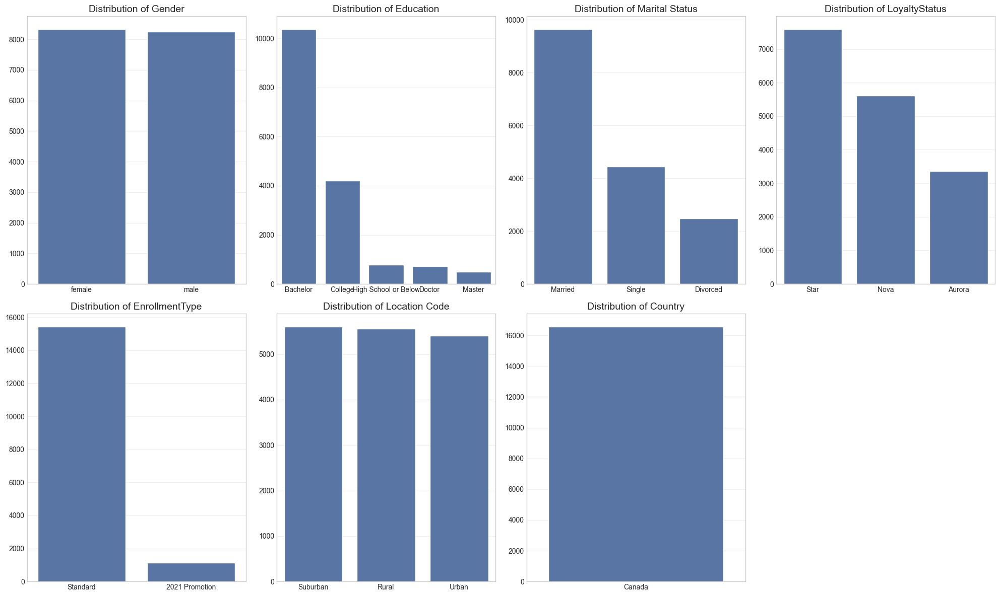

In [331]:

categorical_customer = ["Gender", "Education", "Marital Status", "LoyaltyStatus", "EnrollmentType", "Location Code","Country"]

plt.figure(figsize=(20, 12))
for i, col in enumerate(categorical_customer, 1):
    plt.subplot(2, 4, i)
    sns.countplot(x=col, data=customer, order=customer[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel("")
    plt.ylabel("")
plt.tight_layout()
plt.show()


From these visualizations, we observe that the dataset shows no meaningful variation in gender or location type, suggesting that these variables may have limited discriminative power for segmentation.
Regarding education, the majority of loyalty members hold a Bachelor’s degree, followed by those with College-level education.
In terms of marital status, most customers are married, which may indicate a stable and mature demographic segment.
The loyalty status distribution reveals that most clients belong to the Star tier, followed by Nova and Aurora, highlighting a concentration in mid-level membership.
Finally, the enrollment type indicates that the majority of customers joined through the Standard enrollment process, which could suggest limited participation in promotional or referral programs.


#### 4.1.2 Distribution of Numerical Features

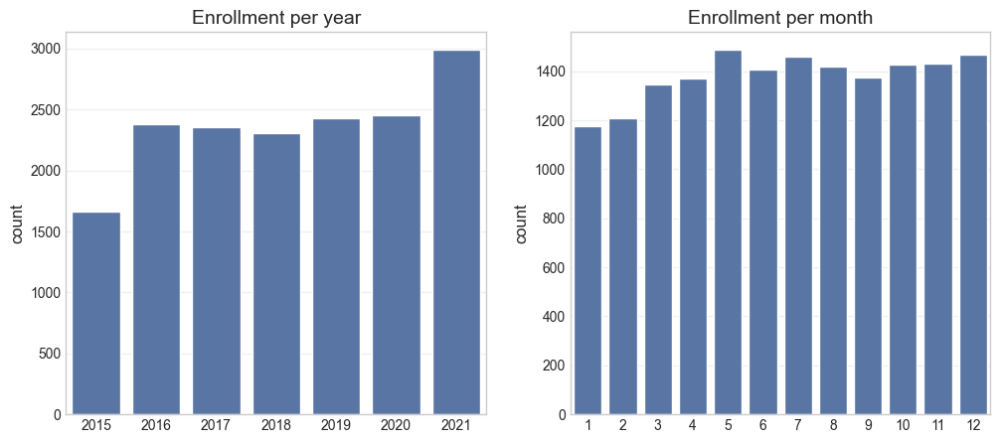

,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,Postal code,Gender,Education,Location Code,Income,Marital Status,LoyaltyStatus,EnrollmentDateOpening,CancellationDate,Customer Lifetime Value,EnrollmentType
Loyalty#,,,,,,,,,,,,,,,,,,,
480934,Cecilia,Householder,Cecilia Householder,Canada,Ontario,Toronto,43.653225,-79.383186,M2Z 4K1,female,Bachelor,Urban,70146.0,Married,Star,2019-02-15,1904-01-01,3839.14,Standard
549612,Dayle,Menez,Dayle Menez,Canada,Alberta,Edmonton,53.544388,-113.490930,T3G 6Y6,male,College,Rural,0.0,Divorced,Star,2019-03-09,1904-01-01,3839.61,Standard
429460,Necole,Hannon,Necole Hannon,Canada,British Columbia,Vancouver,49.282730,-123.120740,V6E 3D9,male,College,Urban,0.0,Single,Star,2017-07-14,2021-01-08,3839.75,Standard


In [332]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.countplot(x=customer["EnrollmentDateOpening"].dt.year, data=customer)
plt.title("Enrollment per year")
plt.xlabel("")

plt.subplot(1, 2, 2)
sns.countplot(x=customer["EnrollmentDateOpening"].dt.month, data=customer)
plt.title("Enrollment per month")
plt.xlabel("")
plt.show()
customer.head(3)

The analysis of enrollment trends shows a stable customer acquisition rate between 2016 and 2020, followed by a significant surge in 2021, which represents the highest volume of new enrollments within the dataset. This latest growth suggests successful recent marketing or promotional efforts and indicates a healthy expansion of the customer base. 2021 Promotion

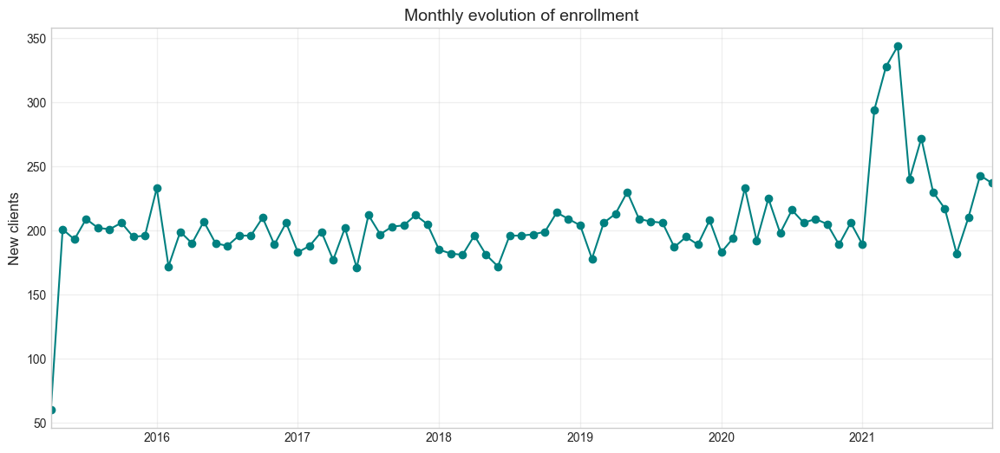

In [333]:
monthly_enrollments = customer.groupby(customer["EnrollmentDateOpening"].dt.to_period("M")).size().sort_index()
# converter índice PeriodIndex para timestamp para plot ficar com labels de datas
monthly_enrollments.index = monthly_enrollments.index.to_timestamp()

plt.figure(figsize=(14, 6))
monthly_enrollments.plot(kind='line', marker='o', color='teal')
plt.title("Monthly evolution of enrollment")
plt.xlabel("")
plt.ylabel("New clients")
plt.grid(True, alpha=0.3)
plt.show()

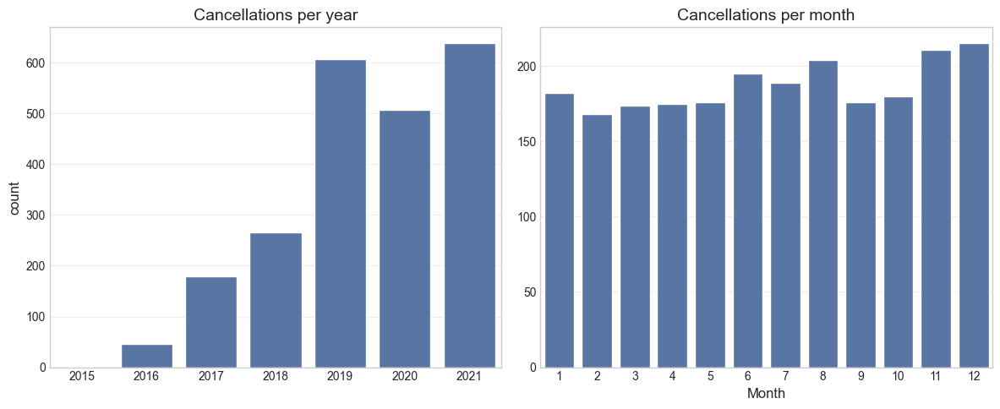

In [334]:

valid_dates = customer["CancellationDate"].dt.year != 1904


plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.countplot(x=customer.loc[valid_dates, "CancellationDate"].dt.year.astype(int).sort_values())
plt.title("Cancellations per year")
plt.xlabel("")

plt.subplot(1,2,2)
sns.countplot(x=customer.loc[valid_dates, "CancellationDate"].dt.month.astype(int))
plt.title("Cancellations per month")
plt.xlabel("Month")
plt.ylabel("")
plt.tight_layout()

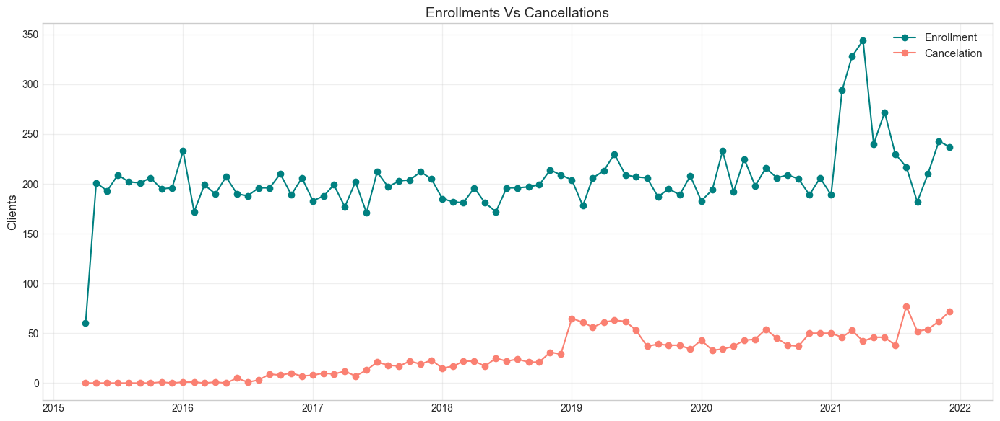

In [335]:
monthly_enroll = customer.groupby(customer["EnrollmentDateOpening"].dt.to_period("M")).size()
monthly_cancel = customer.loc[valid_dates].groupby(customer.loc[valid_dates, "CancellationDate"].dt.to_period("M")).size()

# Criar range completo de meses para alinhar as séries
all_months = pd.period_range(
    start=min(monthly_enroll.index.min(), monthly_cancel.index.min()),
    end=max(monthly_enroll.index.max(), monthly_cancel.index.max()),
    freq="M"
)

# Reindexar para garantir continuidade
monthly_enroll = monthly_enroll.reindex(all_months, fill_value=0)
monthly_cancel = monthly_cancel.reindex(all_months, fill_value=0)

# Converter PeriodIndex em datetime (para eixo legível)
monthly_enroll.index = monthly_enroll.index.to_timestamp()
monthly_cancel.index = monthly_cancel.index.to_timestamp()

plt.figure(figsize=(14,6))
plt.plot(monthly_enroll.index, monthly_enroll, marker='o', label="Enrollment", color='teal')
plt.plot(monthly_cancel.index, monthly_cancel, marker='o', label="Cancelation", color='salmon')
plt.title("Enrollments Vs Cancellations", fontsize=14)
plt.xlabel("")
plt.ylabel("Clients")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


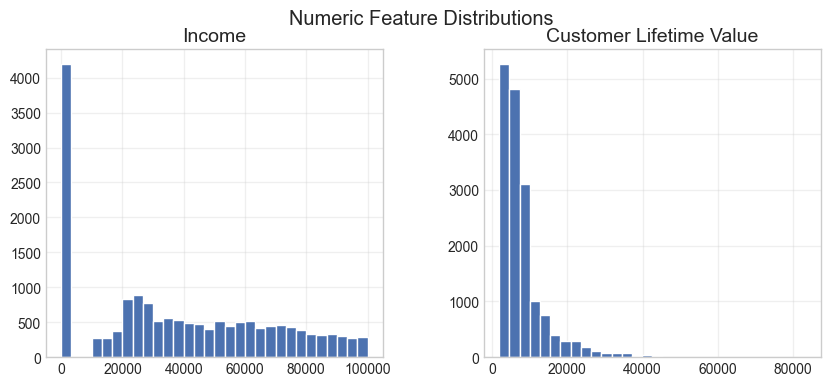

In [336]:
numeric_customer = ["Income", "Customer Lifetime Value"]
customer[numeric_customer].hist(bins=30 ,figsize=(10,4))
plt.suptitle("Numeric Feature Distributions")
plt.show()


The distributions of Income and Customer Lifetime Value are highly right-skewed, with the vast majority of customers concentrated at low values. The presence of a long tail suggests potential high-value customers, but these instances should be investigated to determine if they represent a genuine business segment (e.g., corporate clients) or data outliers.


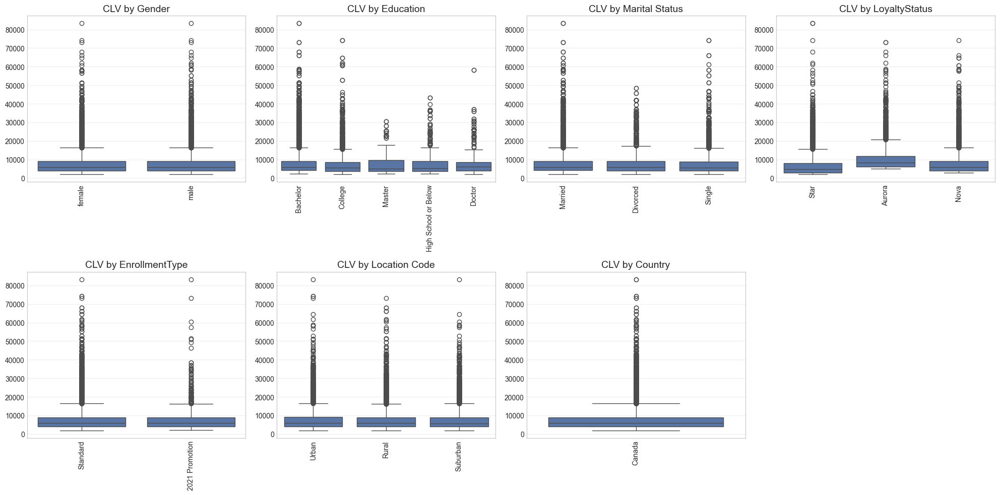

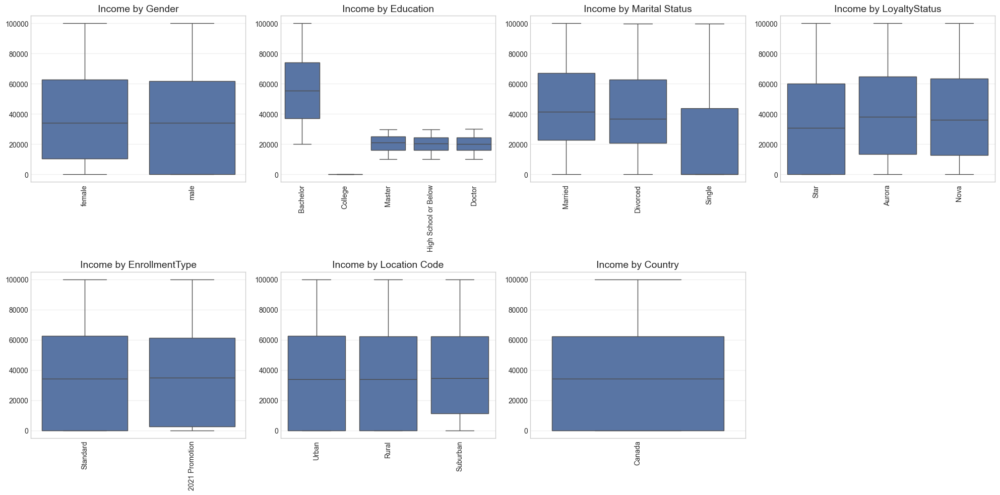

In [337]:
plt.figure(figsize=(20, 10))
for i, cat_col in enumerate(categorical_customer, 1):
    plt.subplot(2, 4, i)
    sns.boxplot(x=cat_col, y="Customer Lifetime Value", data=customer)
    plt.title(f"CLV by {cat_col}")
    plt.xlabel("")
    plt.ylabel("")
    plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 10))
for i, cat_col in enumerate(categorical_customer, 1):
    plt.subplot(2, 4, i)
    sns.boxplot(x=cat_col, y="Income", data=customer)
    plt.title(f"Income by {cat_col}")
    plt.xlabel("")
    plt.ylabel("")
    plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [338]:
def find_group_outliers(df, group_col, value_col, k=1.5):
    outlier_idx = []
    for name, g in df.groupby(group_col):
        q1 = g[value_col].quantile(0.25)
        q3 = g[value_col].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - k * iqr
        upper = q3 + k * iqr
        mask = (g[value_col] < lower) | (g[value_col] > upper)
        outlier_idx.extend(g[mask].index.tolist())
    return df.loc[outlier_idx]

def outliers_for_all(df, cat_cols, value_cols=("Customer Lifetime Value", "Income"), k=1.5):
    results = {}
    for val in value_cols:
        print(f"\n--- {val} ---")
        # compute outliers per categorical column
        for col in cat_cols:
            out = find_group_outliers(df, col, val, k=k)
            results[(col, val)] = out
            print(f"{col}: {len(out)} outliers")
    return results

outliers_dict = outliers_for_all(customer, categorical_customer)



--- Customer Lifetime Value ---
Gender: 1463 outliers
Education: 1477 outliers
Marital Status: 1446 outliers
LoyaltyStatus: 1355 outliers
EnrollmentType: 1460 outliers
Location Code: 1445 outliers
Country: 1460 outliers

--- Income ---
Gender: 0 outliers
Education: 0 outliers
Marital Status: 0 outliers
LoyaltyStatus: 0 outliers
EnrollmentType: 0 outliers
Location Code: 0 outliers
Country: 0 outliers


**Income Distribution by Loyalty Status**

The median Income is similar but slightly lower for the Star loyalty group compared to Aurora and Nova. However, the overall distribution and range of Income across all three groups are highly consistent, with the Interquartile Ranges (IQR) and whiskers spanning similar values (from approximately $0 to $100,000). This suggests that Loyalty Status is not a strong differentiator of customer income levels.

**Customer liftime value by Loyalty Status**

The plot shows that high-CLV customers (outliers) are not segregated within a single, premium loyalty status; they are present across all three loyalty statuses (Star, Aurora, and Nova). While the Aurora tier shows a slightly higher median CLV, the overall pattern suggests that Loyalty Status is a poor predictor of a customer's lifetime value.

**Income Distribution by Education Level**
The analysis reveals that a Bachelor's degree is the dominant factor determining high customer income, with this group showing a significantly higher median and broader Interquartile Range (IQR) than all others. In contrast, Master's, High School, and Doctor levels show consistently low and similar median incomes. Crucially, the College category displays a median income of zero, pointing to a severe data quality issue (missing or improperly coded income values) that must be addressed prior to any predictive modeling.

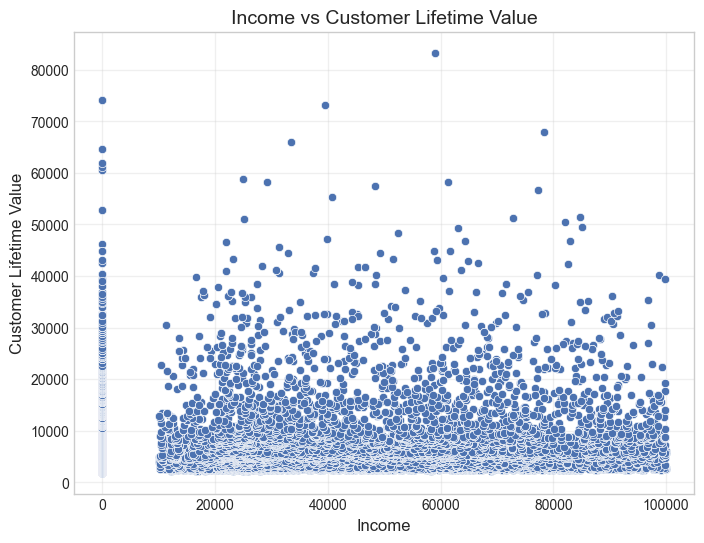

In [339]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Income', y='Customer Lifetime Value', data=customer)
plt.title('Income vs Customer Lifetime Value')
plt.show()

The scatter plot confirms that there is no strong linear correlation between Income and Customer Lifetime Value (CLV). High-CLV customers (the upper outliers) are observed across the entire income spectrum, demonstrating that a customer's purchasing power is not the primary driver of their long-term value. This suggests that predictive models should prioritize behavioral features over income.

--- Summary of Customer Lifetime Value ---
count    16574.000000
mean      7986.494716
std       6858.499179
min       1898.010000
25%       3978.822500
50%       5780.180000
75%       8954.430000
max      83325.380000
Name: Customer Lifetime Value, dtype: float64
Missing values: 0
Skewness: 3.08
Kurtosis: 14.39


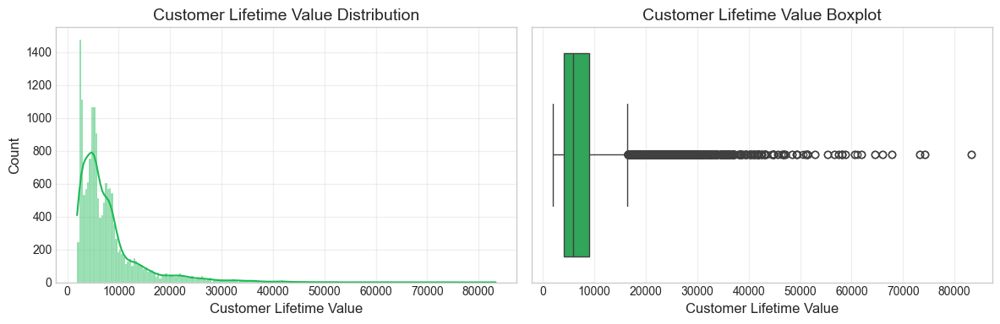

In [340]:
analyze_feature(customer['Customer Lifetime Value'], feature_name='Customer Lifetime Value')

### 4.2 Flights Database

In [341]:
flight.describe().T

,count,mean,min,25%,50%,75%,max,std
Loyalty#,596664.0,549435.680825,100018.0,326234.0,550020.0,771901.0,999986.0,258867.195581
Year,596664.0,2020.0,2019.0,2019.0,2020.0,2021.0,2021.0,0.816497
Month,596664.0,6.5,1.0,3.75,6.5,9.25,12.0,3.452055
YearMonthDate,596664,2020-06-16 02:40:00.000000768,2019-01-01 00:00:00,2019-09-23 12:00:00,2020-06-16 00:00:00,2021-03-08 18:00:00,2021-12-01 00:00:00,NaN
NumFlights,596664.0,3.845372,0.0,0.0,0.0,7.0,21.0,5.022941
NumFlightsWithCompanions,596664.0,0.936168,0.0,0.0,0.0,1.0,11.0,1.968412
DistanceKM,596664.0,7973.603444,0.0,0.0,984.5,15400.0,42040.0,10269.174348
PointsAccumulated,596664.0,797.122897,0.0,0.0,98.0,1540.0,4204.0,1026.742807
PointsRedeemed,596664.0,236.461457,0.0,0.0,0.0,0.0,7496.0,985.650609
DollarCostPointsRedeemed,596664.0,2.336869,0.0,0.0,0.0,0.0,74.0,9.749377


#### 4.2.1 Distribution of Numerical Features


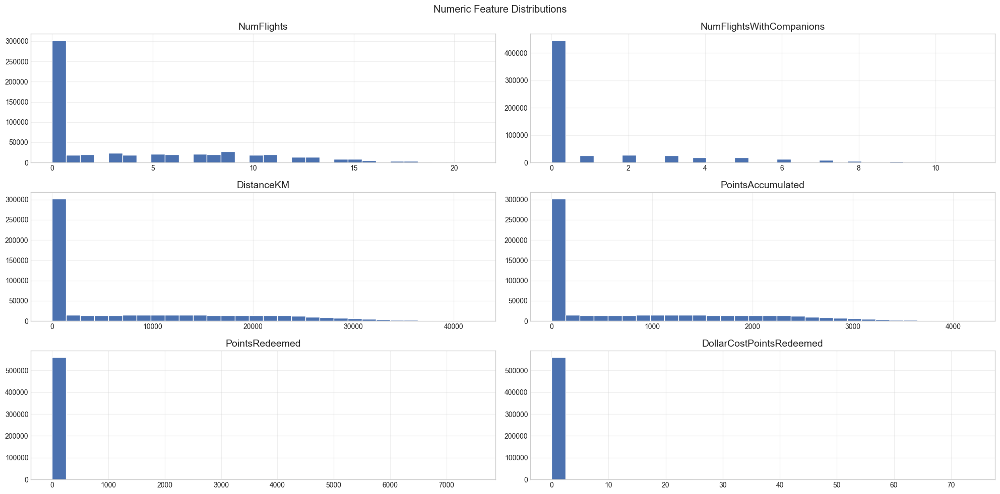

Número de outliers por variável:
NumFlights                   6814
NumFlightsWithCompanions    95880
DistanceKM                   1828
PointsAccumulated            1821
PointsRedeemed              34884
DollarCostPointsRedeemed    34884
dtype: int64


In [342]:
numeric_flights = ["NumFlights", "NumFlightsWithCompanions", "DistanceKM", "PointsAccumulated", "PointsRedeemed", "DollarCostPointsRedeemed"]

# Histograms
flight[numeric_flights].hist(bins=30, figsize=(20, 10))
plt.suptitle("Numeric Feature Distributions")
plt.tight_layout()
plt.show()

# Identificar outliers usando IQR
Q1 = flight[numeric_flights].quantile(0.25)
Q3 = flight[numeric_flights].quantile(0.75)
IQR = Q3 - Q1

outliers = ((flight[numeric_flights] < (Q1 - 1.5 * IQR)) | (flight[numeric_flights] > (Q3 + 1.5 * IQR))).sum()
print("Número de outliers por variável:")
print(outliers)

### 4.3 Multivariate analysis


In [343]:
flight.groupby(["Year", "Month"])["NumFlights"].sum()

Year  Month
2019  1         38645
      2         38753
      3         52952
      4         45638
      5         53729
      6         67803
      7         75705
      8         65973
      9         51971
      10        48921
      11        45897
      12        64287
2020  1         47266
      2         47102
      3         63398
      4         55080
      5         64345
      6         79345
      7         88023
      8         77554
      9         62370
      10        59427
      11        56036
      12        76462
2021  1         48422
      2         47841
      3         65889
      4         55915
      5         75675
      6         91401
      7        102553
      8         89049
      9         71788
      10        67916
      11        64310
      12        86954
Name: NumFlights, dtype: int64

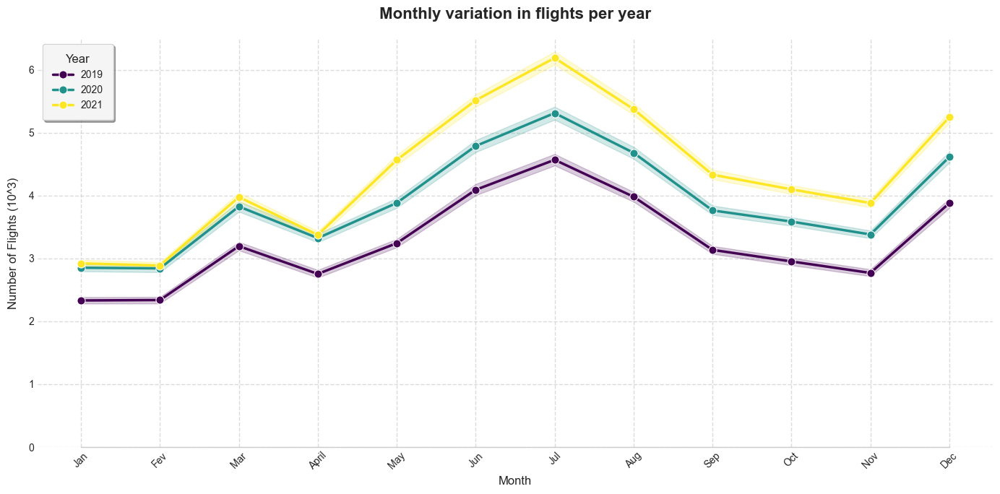

In [344]:
# Choosing the style 
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(14, 7))

# Create the graph
ax = sns.lineplot(
        data=flight,
        x="Month",
        y="NumFlights",
        hue="Year",
        palette="viridis",  # Color scheme
        linewidth=2.5,
        marker='o',         # Add markers
        markersize=8     
    )

plt.title("Monthly variation in flights per year",
            fontsize=16,
            fontweight='bold',
            pad=20)
plt.ylabel('Number of Flights (10^3)', fontsize=12, labelpad=10)

plt.legend(
        title='Year',
        title_fontsize=12,
        fontsize=10,
        frameon=True,
        fancybox=True,
        framealpha=0.9,
        shadow=True,
        borderpad=1
)

plt.xticks(range(1, 13),
           ['Jan', 'Fev', 'Mar', 'April', 'May', 'Jun',
            'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
           rotation=45)
plt.ylim(0)

plt.grid(True, linestyle='--', alpha=0.7)

sns.despine(trim=True, left=True)

plt.tight_layout()
plt.show()

In [345]:
#sns.pairplot(data=flight, vars= numeric_flights)

#plt.show()

# meti # para nao demorar a correr

During the exploration, several features were found to have strong linear relationships. These are not coincidental correlations but rather indicators of specific business rules used by the airline.

A strong positive correlation was observed between DistanceKM and PointsAccumulated. This is expected, as it reflects the loyalty program's core mechanic: customers earn points based on the distance they fly.

However, the analysis revealed a more precise calculation. The data shows that the number of points awarded is based on a fixed ratio. For example, flights of 2,388 km and 2,380 km both yield 238 points. This strongly suggests that the business rule is PointsAccumulated = floor(DistanceKM / 10).

This means that points are awarded for every full 10 kilometers flown, and any remaining unit-level distance is truncated. Understanding this specific rule is key, as it explains the exact, predictable nature of how points are earned.

Similarly, the strong correlation between PointsRedeemed and DollarCostPointsRedeemed points to a derived relationship, not a behavioral one.

The DollarCostPointsRedeemed is likely an internal accounting metric. It is almost certainly calculated by multiplying the PointsRedeemed by a fixed monetary rate (a "cost-per-point") that the airline uses to track the financial liability of its loyalty program. This makes one variable a direct linear function of the other, explaining the perfect or near-perfect correlation.

The heatmap below comprove the things that we observed

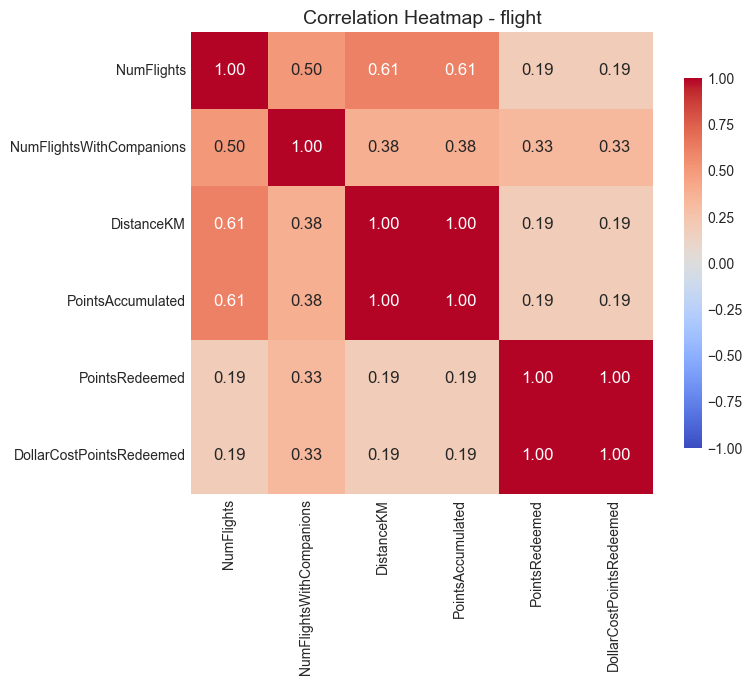

In [346]:

correlation_matrix = flight[numeric_flights].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, 
            annot=True,           
            cmap='coolwarm',     
            vmin=-1, vmax=1,      
            center=0,             
            square=True,          
            fmt='.2f',            
            cbar_kws={'shrink': 0.8})  

plt.title("Correlation Heatmap - flight")
plt.show()
plt.show()

In [347]:
numeric_cols = [
    'NumFlights',
    'DistanceKM',
    'PointsAccumulated',
    'PointsRedeemed',
    'DollarCostPointsRedeemed',
    'Customer Lifetime Value',
    'Income'
]

merged = pd.merge(customer, flight, on='Loyalty#', how='inner')
agg = merged.groupby('Loyalty#', as_index=False).agg({
    'NumFlights': 'sum',
    'DistanceKM': 'sum',
    'PointsAccumulated': 'sum',
    'PointsRedeemed': 'sum',
    'DollarCostPointsRedeemed': 'sum',
    'Customer Lifetime Value': 'mean',
    'Income': 'first',
    'LoyaltyStatus': 'first',
    'Gender': 'first',
    'Education': 'first',
})

In [348]:
#n_rows = len(categorical_customer)
#n_cols = len(numeric_flights)

#fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows))

#for i, cat in enumerate(categorical_customer):
    #for j, num in enumerate(numeric_flights):
        #ax = axes[i, j]
        #sns.boxplot(x=cat, y=num, data=merged, ax=ax)
        #ax.set_title(f'{num} by {cat}')
        #ax.set_xlabel('')
        #ax.set_ylabel('')
        #ax.tick_params(axis='x', rotation=45)

#plt.tight_layout()
#plt.show()

# meti # para nao demorar a correr

In [349]:
#sns.pairplot(merged[numeric_cols], diag_kind='kde', plot_kws={'alpha':0.6})
#plt.suptitle('Pairplot – Customer & Flight Numerical Variables', y=1.02)
#plt.show()

# so coloquei # para nao demorar a correr


## 5. Data Pre-processing

### 5.1 Feature Engineering

This section aggregates flight-related data for each customer based on their unique Loyalty# identifier.
A reusable function (cumulative_customer) is defined to compute the total sum of a selected column (e.g., number of flights, distance traveled, points accumulated, and points redeemed) per customer.
The resulting aggregated datasets are then merged into the main customer DataFrame to enrich it with cumulative statistics for each individual.

#### 5.1.1 Cumulative Customer Totals

Total values of flights, distance, points redeemed/accumulated, and flights with companions for each customer, capturing overall activity.

In [350]:
total_flights = cumulative_customer("NumFlights",flight)
total_DistanceKM = cumulative_customer("DistanceKM",flight)
total_PointsRedeemed = cumulative_customer("PointsRedeemed",flight)
total_PointsAccumulated = cumulative_customer("PointsAccumulated",flight)
total_NumFlightsWithCompanions = cumulative_customer("NumFlightsWithCompanions",flight)

--- Summary of Total NumFlights ---
count    16574.000000
mean       138.433390
std         78.846224
min          0.000000
25%         70.000000
50%        159.000000
75%        199.000000
max        343.000000
Name: NumFlights, dtype: float64
Missing values: 0
Skewness: -0.42
Kurtosis: -0.96


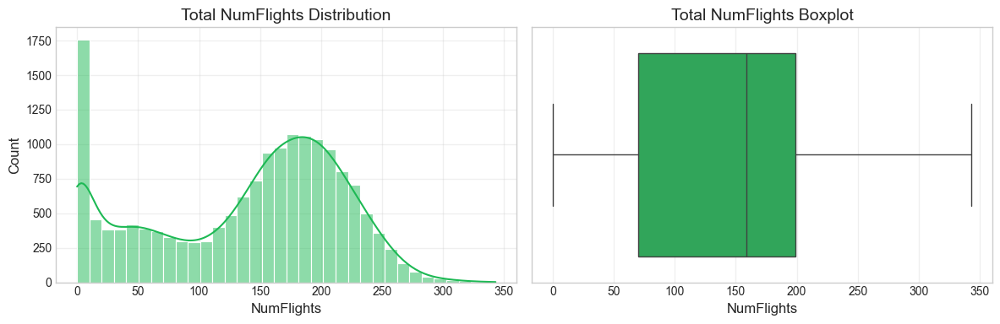

--- Summary of Total Distance KM ---
count     16574.000000
mean     287049.723989
std      163461.945565
min           0.000000
25%      144610.425000
50%      331463.550000
75%      413197.350000
max      712729.600000
Name: DistanceKM, dtype: float64
Missing values: 0
Skewness: -0.45
Kurtosis: -0.97


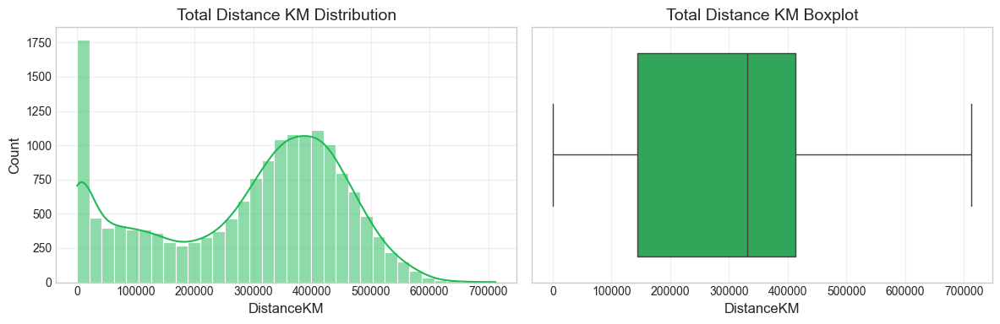

--- Summary of Total Points Redeemed ---
count    16574.000000
mean      8512.612465
std       8695.852829
min          0.000000
25%          0.000000
50%       6499.500000
75%      13545.250000
max      57524.000000
Name: PointsRedeemed, dtype: float64
Missing values: 0
Skewness: 1.13
Kurtosis: 1.24


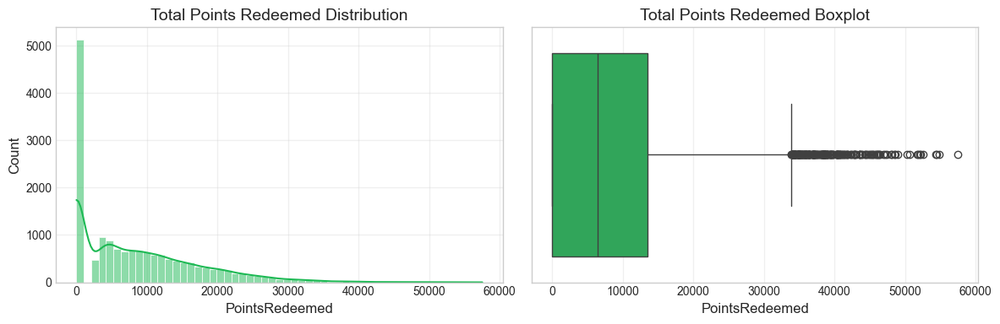

--- Summary of Total Points Accumulated ---
count    16574.000000
mean     28696.424279
std      16341.706535
min          0.000000
25%      14458.000000
50%      33135.000000
75%      41307.750000
max      71259.000000
Name: PointsAccumulated, dtype: float64
Missing values: 0
Skewness: -0.45
Kurtosis: -0.97


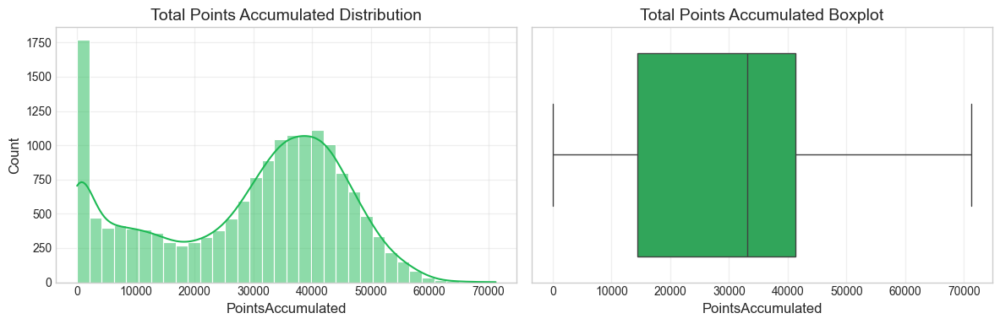

--- Summary of Total Flights With Companions ---
count    16574.000000
mean        33.702063
std         22.299848
min          0.000000
25%         15.000000
50%         35.000000
75%         50.000000
max        119.000000
Name: NumFlightsWithCompanions, dtype: float64
Missing values: 0
Skewness: 0.17
Kurtosis: -0.66


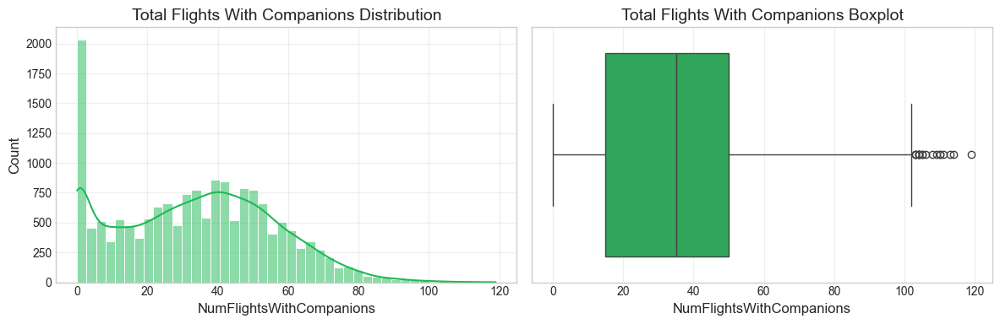

In [351]:
features = {
    "Total NumFlights": total_flights['NumFlights'],
    "Total Distance KM": total_DistanceKM['DistanceKM'],
    "Total Points Redeemed": total_PointsRedeemed['PointsRedeemed'],
    "Total Points Accumulated": total_PointsAccumulated['PointsAccumulated'],
    "Total Flights With Companions": total_NumFlightsWithCompanions['NumFlightsWithCompanions']
}

for name, feat in features.items():
    analyze_feature(feat, feature_name=name)

#### 5.1.2 Seasonality Features

Features that capture seasonal patterns in customer flight behavior, showing periods of higher or lower activity throughout the year.

--- Summary of Summer_Ratio ---
count    16574.000000
mean         0.276276
std          0.166378
min          0.000000
25%          0.179255
50%          0.296089
75%          0.385525
max          1.000000
Name: Summer_Ratio, dtype: float64
Missing values: 0
Skewness: -0.06
Kurtosis: -0.07


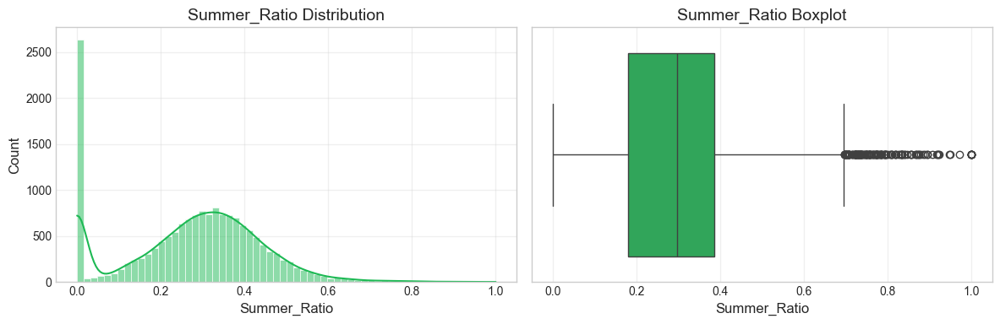

--- Summary of Fall_Ratio ---
count    16574.000000
mean         0.228610
std          0.168067
min          0.000000
25%          0.134806
50%          0.218144
75%          0.297872
max          1.000000
Name: Fall_Ratio, dtype: float64
Missing values: 0
Skewness: 1.58
Kurtosis: 5.08


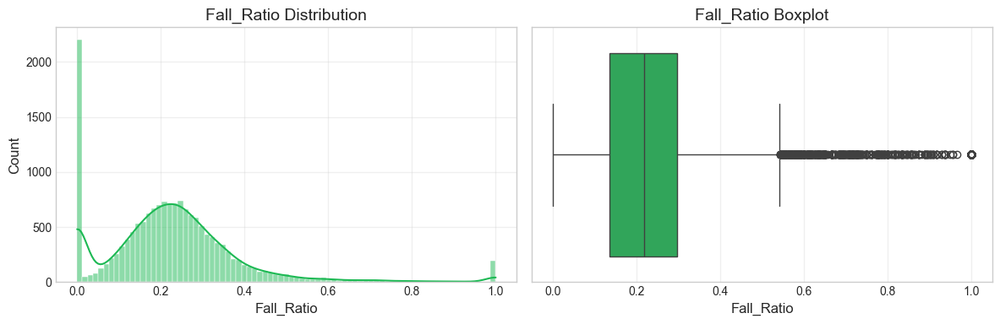

--- Summary of Spring_Ratio ---
count    16574.000000
mean         0.195370
std          0.137703
min          0.000000
25%          0.096154
50%          0.204678
75%          0.282051
max          1.000000
Name: Spring_Ratio, dtype: float64
Missing values: 0
Skewness: 0.57
Kurtosis: 1.75


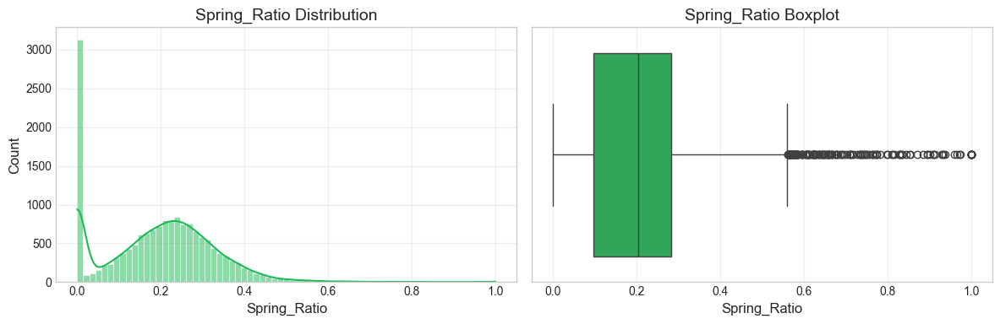

--- Summary of Winter_Ratio ---
count    16574.000000
mean         0.210870
std          0.164892
min          0.000000
25%          0.119073
50%          0.200000
75%          0.275997
max          1.000000
Name: Winter_Ratio, dtype: float64
Missing values: 0
Skewness: 2.05
Kurtosis: 7.67


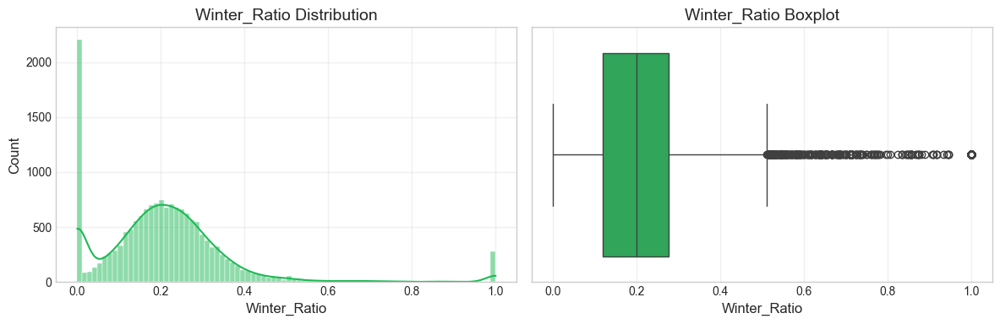

--- Summary of Seasonality_Index ---
count    16574.000000
mean         0.908917
std          0.618692
min          0.000000
25%          0.633842
50%          0.791297
75%          1.021152
max          3.462717
Name: Seasonality_Index, dtype: float64
Missing values: 0
Skewness: 1.93
Kurtosis: 5.48


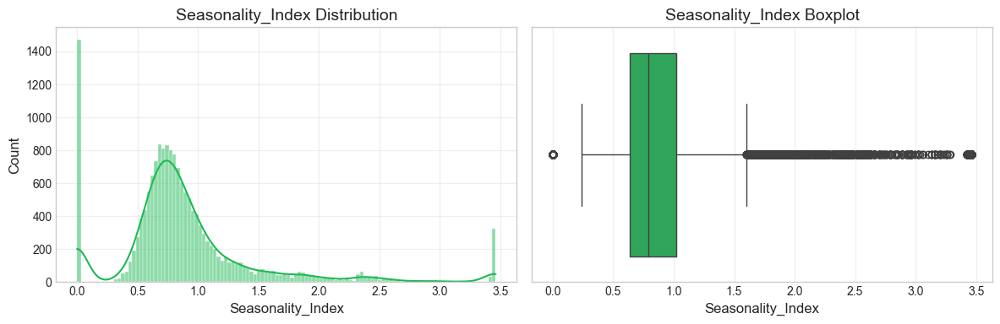

In [352]:
seasonality_data = calculate_seasonality(flight)


for col in ['Summer_Ratio', 'Fall_Ratio', 'Spring_Ratio', 'Winter_Ratio', 'Seasonality_Index']:
    analyze_feature(seasonality_data[col], feature_name=col)

#### 5.1.3 Trend Feature

Feature representing the trend of the number of flights per customer over time, indicating whether activity is increasing or decreasing.

--- Summary of Flight Trend Slope ---
count    16574.000000
mean         0.052713
std          0.096751
min         -0.305792
25%         -0.000901
50%          0.046654
75%          0.116602
max          0.399356
Name: Flight_Trend_Slope, dtype: float64
Missing values: 0
Skewness: 0.08
Kurtosis: 0.09


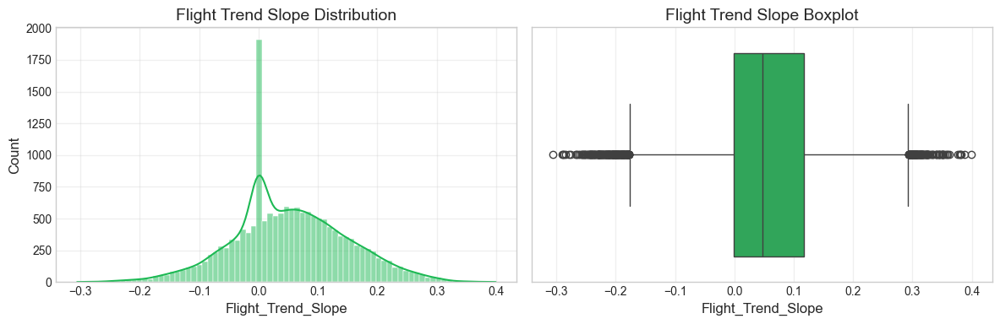

In [353]:
trend_data = calculate_trend(flight)

analyze_feature(trend_data['Flight_Trend_Slope'], feature_name='Flight Trend Slope')

#### 5.1.4 Integrating New Features

Merge all newly created features (cumulative totals, seasonality, and trend) into the main customer dataframe.

In [354]:
new_columns = [
    total_flights,
    total_DistanceKM,
    total_PointsRedeemed,
    total_PointsAccumulated,
    total_NumFlightsWithCompanions,
    seasonality_data,
    trend_data
]


for data in new_columns:
    customer = customer.merge(data, on="Loyalty#", how="left")

#### 5.1.5 Derived Ratios

Features derived from existing metrics, such as the proportion of flights with companions and average distance per flight, providing more granular insights into customer behavior.

In [355]:
customer = customer.fillna(0)
customer['Companion_Ratio'] = customer['NumFlightsWithCompanions'] / customer['NumFlights']
customer['Avg_Distance_Flight'] = customer['DistanceKM'] / customer['NumFlights']


customer = customer.replace([np.inf, -np.inf], 0)
customer[['Companion_Ratio', 'Avg_Distance_Flight']] = customer[['Companion_Ratio', 'Avg_Distance_Flight']].fillna(0)

--- Summary of Companion Ratio ---
count    16574.000000
mean         0.228568
std          0.134696
min          0.000000
25%          0.156405
50%          0.230107
75%          0.300654
max          1.000000
Name: Companion_Ratio, dtype: float64
Missing values: 0
Skewness: 0.93
Kurtosis: 4.53


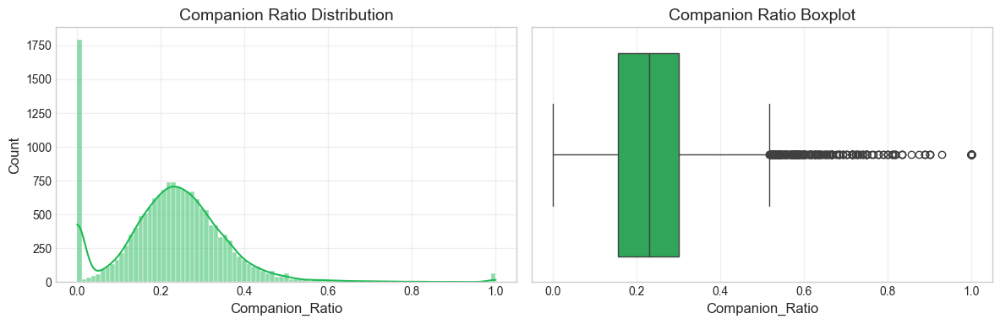

--- Summary of Avg Distance Flight ---
count    16574.000000
mean      2000.053117
std       1339.303003
min          0.000000
25%       1654.475163
50%       2017.920087
75%       2386.173839
max      43857.700000
Name: Avg_Distance_Flight, dtype: float64
Missing values: 0
Skewness: 11.00
Kurtosis: 238.79


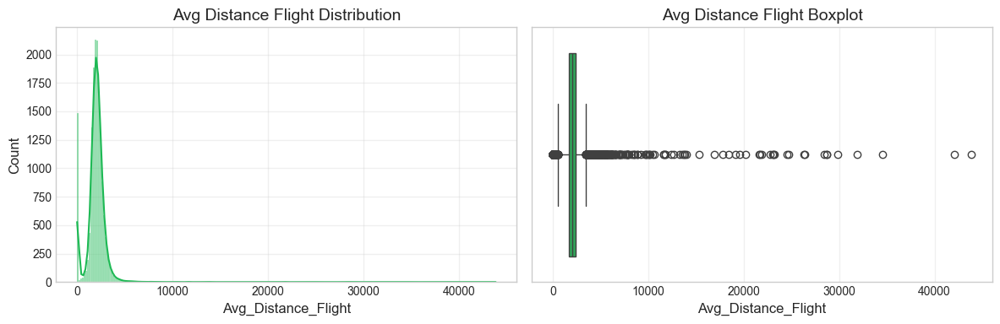

In [356]:
analyze_feature(customer['Companion_Ratio'], feature_name='Companion Ratio')
analyze_feature(customer['Avg_Distance_Flight'], feature_name='Avg Distance Flight')

#### 5.1.6 Temporal Customer Features

- **Recency**: Months since the last flight.
- **Tenure**: Days since the customer account was client of the company.

In [357]:
last_flight = (
    flight[flight['NumFlights'] > 0]
    .groupby('Loyalty#')['YearMonthDate']
    .max()
    .reset_index()
    .rename(columns={'YearMonthDate': 'last_flight_date'})
)
reference_date = flight['YearMonthDate'].max()

last_flight['recency_months'] = (
        (reference_date.year - last_flight['last_flight_date'].dt.year) * 12 +
        (reference_date.month - last_flight['last_flight_date'].dt.month)
)
customer = customer.merge(last_flight[['Loyalty#', 'recency_months']], on='Loyalty#', how='left')
customer.replace({"recency_months": {np.nan: -1}}, inplace=True)
customer['recency_months'] = customer['recency_months'].astype(int)

In [358]:
customer["Tenure"] = (pd.Timestamp.today() - customer["EnrollmentDateOpening"]).dt.days
customer.sort_values(by='Tenure', ascending=True, inplace=True)

--- Summary of Recency Months ---
count    16574.000000
mean         1.073609
std          3.420827
min         -1.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         23.000000
Name: recency_months, dtype: float64
Missing values: 0
Skewness: 4.30
Kurtosis: 19.51


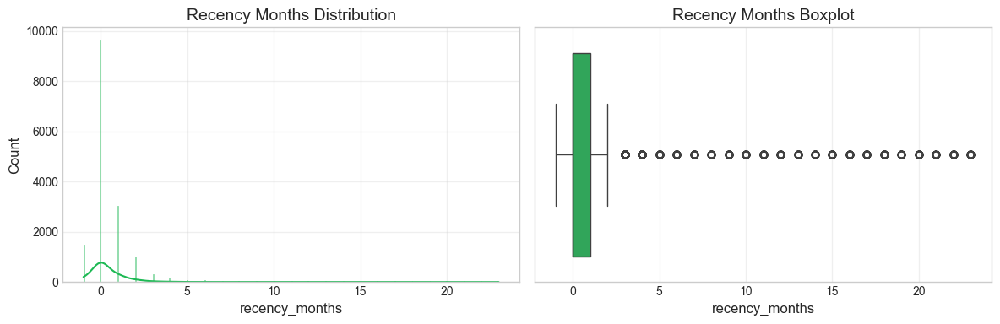

--- Summary of Tenure ---
count    16574.000000
mean      2639.836008
std        718.614784
min       1460.000000
25%       1997.000000
50%       2614.000000
75%       3266.750000
max       3925.000000
Name: Tenure, dtype: float64
Missing values: 0
Skewness: 0.07
Kurtosis: -1.24


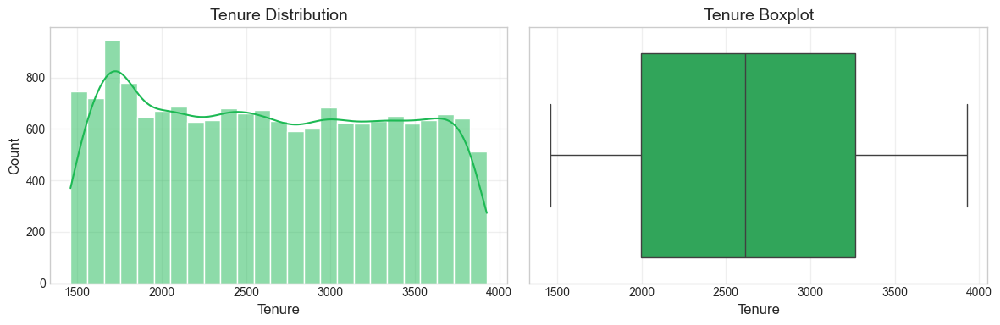

In [359]:
analyze_feature(customer['recency_months'], feature_name='Recency Months')
analyze_feature(customer['Tenure'], feature_name='Tenure')

#### 5.1.7 Engagement/Loyalty Metrics

Proportion of points redeemed vs accumulated, indicating customer engagement with the loyalty program:

- High Value (Near 1): Client that use points frequently, can indicate that the client engage and likes rewards
- Baixo valor (Near 0): Client that don't accumulate, can show some disinterest, or lack of importance/attention with the rewards.


In [360]:
customer["PointsUtilizationRate"] = customer["PointsRedeemed"] / (customer["PointsAccumulated"] + 1)

--- Summary of Points Utilization Rate ---
count    16574.000000
mean         0.287741
std          0.485267
min          0.000000
25%          0.000000
50%          0.215526
75%          0.419986
max         33.007812
Name: PointsUtilizationRate, dtype: float64
Missing values: 0
Skewness: 25.35
Kurtosis: 1396.15


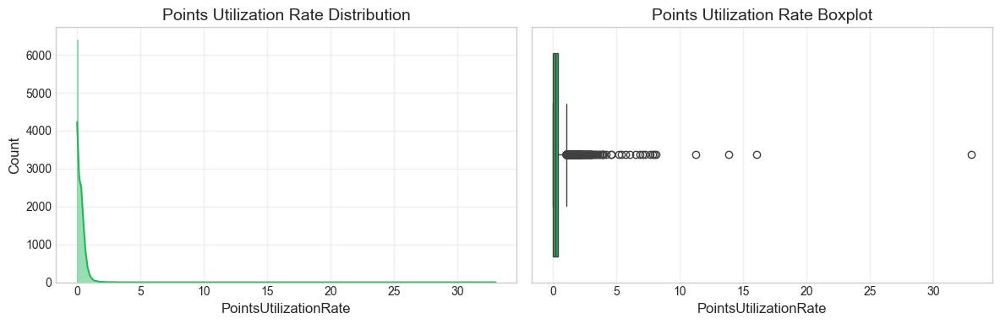

In [361]:
analyze_feature(customer['PointsUtilizationRate'], feature_name='Points Utilization Rate')

#### 5.1.8 New Customer Lifetime Value (CLV)

New normalized metric combining number of flights, income, and tenure to estimate the long-term value of each customer.

In [362]:
scaler = MinMaxScaler()

cols_to_combine = ['NumFlights', 'Income', 'Tenure']

df_temp_calc = pd.DataFrame(scaler.fit_transform(customer[cols_to_combine]), 
                            columns=cols_to_combine, 
                            index=customer.index)

# nova fórmula de CLV com pesos ajustados
customer['CLV'] = (
    (df_temp_calc['NumFlights'] * 0.50) + 
    (df_temp_calc['Income'] * 0.30) + 
    (df_temp_calc['Tenure'] * 0.20)
)

--- Summary of CLV ---
count    16574.000000
mean         0.410766
std          0.174555
min          0.000000
25%          0.285331
50%          0.422869
75%          0.539891
max          0.922920
Name: CLV, dtype: float64
Missing values: 0
Skewness: -0.18
Kurtosis: -0.62


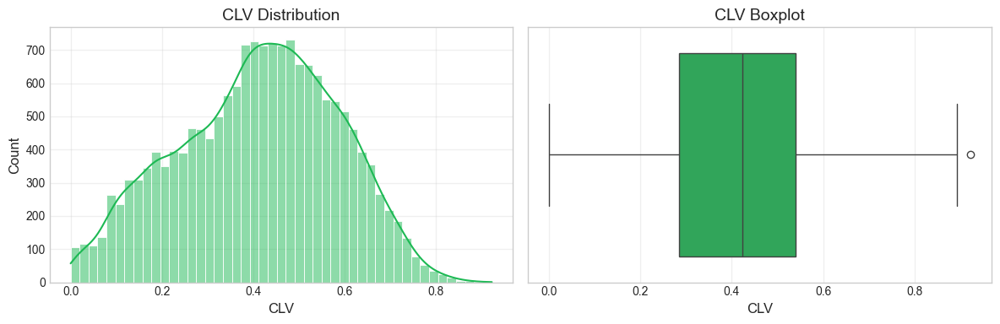

In [363]:
analyze_feature(customer['CLV'], feature_name='CLV')

#### (Bonus) Map Exploration

NOTE: 
 The map is interactive. Hover over the data points to view detailed information

In [364]:
# Group by Province/State and count the number of customers
customermap = customer.groupby("Province or State").agg({
    "Loyalty#": "count",  # Count number of customers
    "Latitude": "first",
    "Longitude": "first",
    "LoyaltyStatus": lambda x: x.mode()[0],
    "NumFlights": "mean",
    "DistanceKM": "mean",
}).reset_index().rename(columns={"Loyalty#": "NumCustomers"})

# Create the map
fig = px.scatter_mapbox(
    customermap,
    lat="Latitude",
    lon="Longitude",
    size="NumCustomers",
    color="NumCustomers",
    hover_name="Province or State",
    hover_data={"NumCustomers": True, "Latitude": False, "Longitude": False, "NumFlights": True, "DistanceKM" : True, "LoyaltyStatus": True},
    zoom=3,
    height=700,
    title="Number of Customers by Canadian Province/State",
    color_continuous_scale=px.colors.sequential.Viridis
)

# Update layout for better visualization
fig.update_layout(
    mapbox_style="carto-positron",
    margin={"r": 0, "t": 50, "l": 0, "b": 0},
    coloraxis_colorbar=dict(
        title="Number of Customers",
        thicknessmode="pixels",
        thickness=20,
        lenmode="pixels",
        len=300,
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.01
    )
)

fig.show()

C:\Users\alexc\AppData\Local\Temp\ipykernel_15064\2272481040.py:12: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



### 5.2 Feature Encoding

In [365]:
customer.columns

Index(['Loyalty#', 'First Name', 'Last Name', 'Customer Name', 'Country',
       'Province or State', 'City', 'Latitude', 'Longitude', 'Postal code',
       'Gender', 'Education', 'Location Code', 'Income', 'Marital Status',
       'LoyaltyStatus', 'EnrollmentDateOpening', 'CancellationDate',
       'Customer Lifetime Value', 'EnrollmentType', 'NumFlights', 'DistanceKM',
       'PointsRedeemed', 'PointsAccumulated', 'NumFlightsWithCompanions',
       'Fall_Ratio', 'Spring_Ratio', 'Summer_Ratio', 'Winter_Ratio',
       'Seasonality_Index', 'Flight_Trend_Slope', 'Companion_Ratio',
       'Avg_Distance_Flight', 'recency_months', 'Tenure',
       'PointsUtilizationRate', 'CLV'],
      dtype='object')

In [366]:
metric_features = [
    "Income",
    "CLV",
    "NumFlights",
    "DistanceKM",
    "PointsRedeemed",
    "PointsAccumulated",
    "NumFlightsWithCompanions",

    "Fall_Ratio",
    "Spring_Ratio",
    "Summer_Ratio",
    "Winter_Ratio",
    "Seasonality_Index",

    "Flight_Trend_Slope",
    "Companion_Ratio",
    "Avg_Distance_Flight",

    "recency_months",
    "Tenure",
    "PointsUtilizationRate"
]

categorical_features = [
    'Gender',
    'Education',
    'Marital Status',
    'EnrollmentType',
    'Province or State',
    'City'
]

In [367]:
customer_oh = pd.get_dummies(customer[categorical_features], prefix='oh', drop_first=True, dtype=int)
customer = pd.concat([customer, customer_oh], axis=1)
non_metric_features = customer.columns[customer.columns.str.startswith('oh_')].tolist()

In [ ]:
features_to_use = metric_features + non_metric_features

unused_features = [col for col in customer.columns if col not in features_to_use]
unused_features = [col for col in unused_features if col not in categorical_features]
print(f"Features Métricas ({len(metric_features)}): {metric_features}")
print(f"Features One-Hot ({len(non_metric_features)}): {non_metric_features}")
print(f"Features Unused/Descartadas ({len(unused_features)}): {unused_features}")

Features Métricas (18): ['Income', 'CLV', 'NumFlights', 'DistanceKM', 'PointsRedeemed', 'PointsAccumulated', 'NumFlightsWithCompanions', 'Fall_Ratio', 'Spring_Ratio', 'Summer_Ratio', 'Winter_Ratio', 'Seasonality_Index', 'Flight_Trend_Slope', 'Companion_Ratio', 'Avg_Distance_Flight', 'recency_months', 'Tenure', 'PointsUtilizationRate']
Features One-Hot (46): ['oh_male', 'oh_College', 'oh_Doctor', 'oh_High School or Below', 'oh_Master', 'oh_Married', 'oh_Single', 'oh_Standard', 'oh_British Columbia', 'oh_Manitoba', 'oh_New Brunswick', 'oh_Newfoundland', 'oh_Nova Scotia', 'oh_Ontario', 'oh_Prince Edward Island', 'oh_Quebec', 'oh_Saskatchewan', 'oh_Yukon', 'oh_Calgary', 'oh_Charlottetown', 'oh_Dawson Creek', 'oh_Edmonton', 'oh_Fredericton', 'oh_Halifax', 'oh_Hull', 'oh_Kelowna', 'oh_Kingston', 'oh_London', 'oh_Moncton', 'oh_Montreal', 'oh_Ottawa', 'oh_Peace River', 'oh_Quebec City', 'oh_Regina', "oh_St. John's", 'oh_Sudbury', 'oh_Thunder Bay', 'oh_Toronto', 'oh_Tremblant', 'oh_Trenton', 'o

In [369]:
unused_reais

['Loyalty#',
 'First Name',
 'Last Name',
 'Customer Name',
 'Country',
 'Latitude',
 'Longitude',
 'Postal code',
 'Location Code',
 'LoyaltyStatus',
 'EnrollmentDateOpening',
 'CancellationDate',
 'Customer Lifetime Value']

In [294]:
customer = customer[metric_features + non_metric_features].copy()

,Income,CLV,NumFlights,DistanceKM,PointsRedeemed,PointsAccumulated,NumFlightsWithCompanions,Fall_Ratio,Spring_Ratio,Summer_Ratio,...,oh_Thunder Bay,oh_Toronto,oh_Tremblant,oh_Trenton,oh_Vancouver,oh_Victoria,oh_West Vancouver,oh_Whistler,oh_Whitehorse,oh_Winnipeg
9494,14072.0,0.042224,0,0.0,0,0,0,0.000000,0.000000,0.00000,...,0,0,0,0,0,0,0,0,0,0
10877,79751.0,0.239298,0,0.0,0,0,0,0.000000,0.000000,0.00000,...,0,0,0,0,0,0,0,0,0,0
427,28264.0,0.084808,0,0.0,0,0,0,0.000000,0.000000,0.00000,...,0,0,1,0,0,0,0,0,0,0
7985,0.0,0.000000,0,0.0,0,0,0,0.000000,0.000000,0.00000,...,0,0,0,0,0,0,0,0,0,0
11944,73938.0,0.418649,135,416199.3,9288,41609,14,0.155556,0.437037,0.22963,...,0,1,0,0,0,0,0,0,0,0
5438,0.0,0.285714,196,391788.7,0,39166,29,0.204082,0.147959,0.30102,...,0,0,0,0,0,0,0,0,0,0
7773,94303.0,0.282963,0,0.0,0,0,0,0.000000,0.000000,0.00000,...,0,0,0,1,0,0,0,0,0,0
3495,29790.0,0.089468,0,0.0,0,0,0,0.000000,0.000000,0.00000,...,0,0,0,0,0,0,0,0,0,0
14680,89284.0,0.267984,0,0.0,0,0,0,0.000000,0.000000,0.00000,...,0,0,0,0,0,0,0,0,0,0
6086,66707.0,0.200240,0,0.0,0,0,0,0.000000,0.000000,0.00000,...,0,1,0,0,0,0,0,0,0,0


### 5.3 Feature Selection

In [74]:
columns_to_drop = [
    # --- Identificadores & PII ---
    'Loyalty#', 'First Name', 'Last Name', 'Customer Name',
    'Country', 'Postal code', 'Latitude', 'Longitude',

    # --- Originais categóricas (já codificadas) ---
    'Gender',
    'Education',
    'Marital Status',
    'EnrollmentType',
    'Province or State',
    'City',
    'Location Code',
    'LoyaltyStatus',

    # --- Datas ---
    'EnrollmentDateOpening',
    'CancellationDate',

    # --- Redundâncias ---
    'Customer Lifetime Value',
    'DistanceKM',
    'PointsRedeemed',
    'PointsAccumulated',
    'NumFlightsWithCompanions'
]

customer = customer.drop(columns=columns_to_drop, errors='ignore')
customer.head(3)

fs_metric_features = [f for f in metric_features if f in customer.columns]

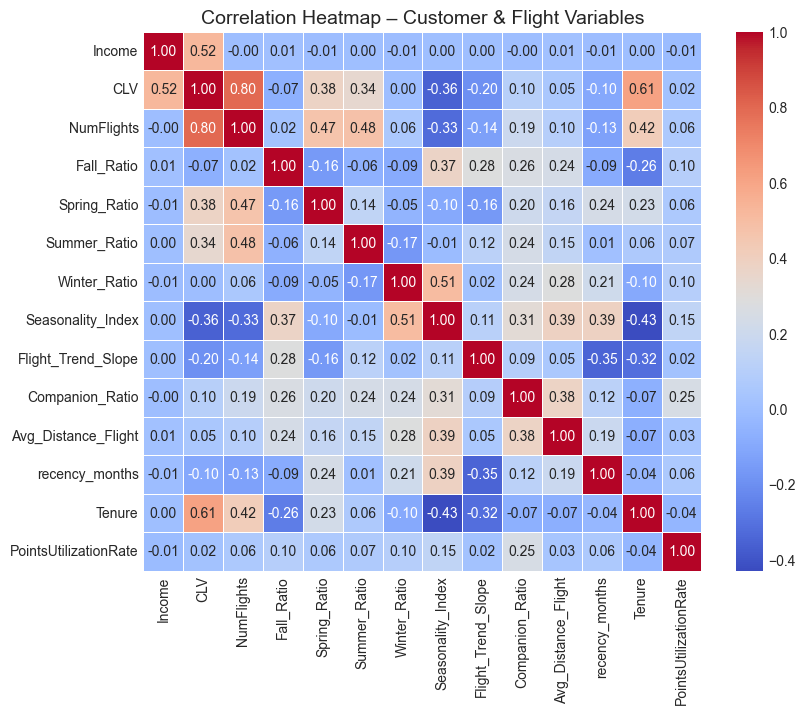

In [75]:
plt.figure(figsize=(9,7))
corr = customer[fs_metric_features].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap – Customer & Flight Variables')
plt.show()

### 5.4 Feature Scalling

In [76]:
customer_original = customer.copy()

In [77]:
# We SKIP 'Flight_Trend_Slope' because it has negative values
# We SKIP 'Fall_Ratio', etc., because they are already small (0-1)
cols_to_log = ['Income', 'CLV', 'NumFlights']

for col in cols_to_log:
    if col in customer.columns:
        # Check if there are negative values 
        if (customer[col] < 0).any():
            print(f"Skipping {col}: Contains negative values (cannot log transform).")
        else:
            customer[col] = np.log1p(customer[col])
            print(f"Transformed {col}.")

Transformed Income.
Transformed CLV.
Transformed NumFlights.


#### 5.4.1 MinMaxScaler

In [78]:
df_minmax = customer.copy()

In [79]:
mm_scaler = MinMaxScaler()
mm_scaled_feat = mm_scaler.fit_transform(df_minmax[fs_metric_features])

df_minmax[fs_metric_features] = mm_scaled_feat
df_minmax[fs_metric_features].describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
Income,16574.0,0.69,0.41,0.0,0.00,0.91,0.96,1.0
CLV,16574.0,0.51,0.19,0.0,0.38,0.54,0.66,1.0
NumFlights,16574.0,0.75,0.27,0.0,0.73,0.87,0.91,1.0
Fall_Ratio,16574.0,0.23,0.17,0.0,0.13,0.22,0.30,1.0
Spring_Ratio,16574.0,0.20,0.14,0.0,0.10,0.20,0.28,1.0
Summer_Ratio,16574.0,0.28,0.17,0.0,0.18,0.30,0.39,1.0
Winter_Ratio,16574.0,0.21,0.16,0.0,0.12,0.20,0.28,1.0
Seasonality_Index,16574.0,0.26,0.18,0.0,0.18,0.23,0.29,1.0
Flight_Trend_Slope,16574.0,0.51,0.14,0.0,0.43,0.50,0.60,1.0
Companion_Ratio,16574.0,0.23,0.13,0.0,0.16,0.23,0.30,1.0


MinMaxScaler compresses all data points into a fixed range between 0 and 1, where the lowest value becomes 0 and the highest becomes 1, ensuring that no single variable dominates the model simply because it has larger raw numbers.

#### 5.4.2 StandardScaler

In [80]:
df_standard = customer.copy()

In [81]:
scaler = StandardScaler()
ss_scaled_feat = scaler.fit_transform(customer[fs_metric_features])

df_standard[fs_metric_features] = ss_scaled_feat
df_standard[fs_metric_features].describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
Income,16574.0,0.0,1.0,-1.71,-1.71,0.52,0.65,0.75
CLV,16574.0,-0.0,1.0,-2.65,-0.67,0.13,0.75,2.50
NumFlights,16574.0,-0.0,1.0,-2.81,-0.09,0.43,0.57,0.92
Fall_Ratio,16574.0,-0.0,1.0,-1.36,-0.56,-0.06,0.41,4.59
Spring_Ratio,16574.0,0.0,1.0,-1.42,-0.72,0.07,0.63,5.84
Summer_Ratio,16574.0,0.0,1.0,-1.66,-0.58,0.12,0.66,4.35
Winter_Ratio,16574.0,-0.0,1.0,-1.28,-0.56,-0.07,0.39,4.79
Seasonality_Index,16574.0,0.0,1.0,-1.47,-0.44,-0.19,0.18,4.13
Flight_Trend_Slope,16574.0,0.0,1.0,-3.71,-0.55,-0.06,0.66,3.58
Companion_Ratio,16574.0,-0.0,1.0,-1.70,-0.54,0.01,0.54,5.73


StandardScaler transforms the data so that the mean is 0 and the standard deviation is 1. It tells us how many standard deviations a data point is above or below the average, without imposing fixed maximum or minimum limits.

#### 5.4.3 Comparing different scalers vs original data

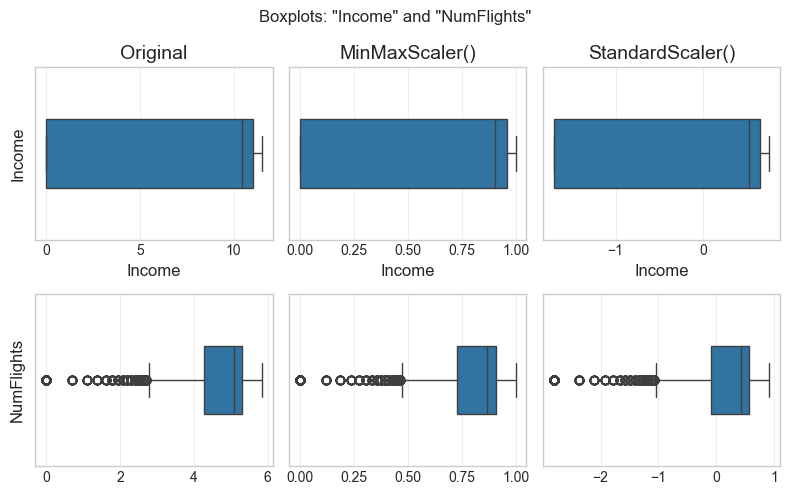

In [82]:

sns.set_style('whitegrid')
# Aumentar o figsize para que 6 boxplots fiquem legíveis
fig, axes = plt.subplots(2, 3, figsize=(8, 5), tight_layout=True, sharey='row')

bp_feat_l = 'Income'

sns.boxplot(customer, x=bp_feat_l, ax=axes[0][0], width=.4)
axes[0][0].set_title('Original')
axes[0][0].set_ylabel(bp_feat_l)

sns.boxplot(df_minmax, x=bp_feat_l, ax=axes[0][1], width=.4)
axes[0][1].set_title('MinMaxScaler()')

sns.boxplot(df_standard, x=bp_feat_l, ax=axes[0][2], width=.4)
axes[0][2].set_title('StandardScaler()')



bp_feat_r = 'NumFlights'

sns.boxplot(customer, x=bp_feat_r, ax=axes[1][0], width=.4)
axes[1][0].set_ylabel(bp_feat_r)

sns.boxplot(df_minmax, x=bp_feat_r, ax=axes[1][1], width=.4)

sns.boxplot(df_standard, x=bp_feat_r, ax=axes[1][2], width=.4)


axes[1][0].set_xlabel(None)
axes[1][1].set_xlabel(None)
axes[1][2].set_xlabel(None)

fig.suptitle('Boxplots: "{}" and "{}"'.format(bp_feat_l, bp_feat_r))
plt.show()

Text(0.5, 0.98, 'Boxplots: "Income"')

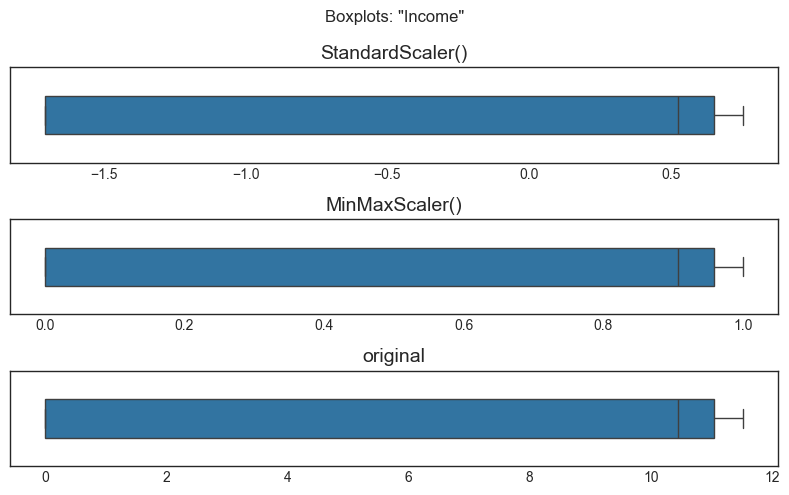

In [83]:
sns.set_style('white')

fig, axes = plt.subplots(3,1, figsize=(8,5), tight_layout=True,)

sns.boxplot(customer, x=bp_feat_l, ax=axes[2], width=.4)
sns.boxplot(df_minmax, x=bp_feat_l, ax=axes[1], width=.4)
sns.boxplot(df_standard, x=bp_feat_l, ax=axes[0], width=.4)

axes[0].set_title("StandardScaler()")
axes[0].set_xlabel(None)
axes[1].set_title("MinMaxScaler()")
axes[1].set_xlabel(None)
axes[2].set_title("original")
axes[2].set_xlabel(None)

plt.suptitle('Boxplots: "{}"'.format(bp_feat_l))

As we can see through the boxplots, MinMaxScaler forces the data into the 0-1 interval destroying the subtle differences in variance among average customers. This compression leads to clustering results that are less discriminatory.

StandardScaler preserves the relative distances between data points. This makes it ideal for the distance-based algorithms that we will use later, as it ensures that distances are calculated fairly and robustly across all features.

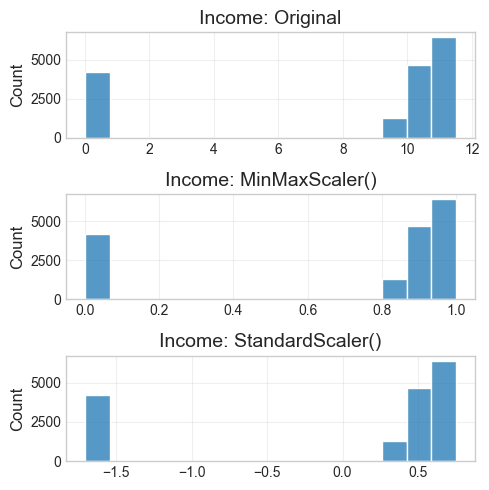

In [84]:
sns.set_style('whitegrid')

# Create subplots with 3 rows, 1 column:
fig, axes = plt.subplots(3,1, 
                         figsize=(5,5), tight_layout=True)

# Which feature do you want to visualize?
hp_feat = 'Income'

# common function args for histplot
hp_args = dict(x=hp_feat, bins=15)


sns.histplot(customer, ax=axes[0], **hp_args)
axes[0].set_title('{}: Original'.format(hp_feat))
axes[0].set_xlabel(None)

sns.histplot(df_minmax, ax=axes[1], **hp_args)
axes[1].set_title('{}: MinMaxScaler()'.format(hp_feat))
axes[1].set_xlabel(None)

sns.histplot(df_standard, ax=axes[2], **hp_args)
axes[2].set_title('{}: StandardScaler()'.format(hp_feat))
axes[2].set_xlabel(None)


plt.show()

sns.set()

We decided to keep the StandardScaler because it best preserved relative distances across features and provided the most suitable scaling for our clustering objectives.

In [85]:
customer = df_standard.copy()

In [86]:
sns.set()

### 5.5 Outliers removal (DBSCAN)

We create a clean dataset using DBSCAN for K-Means training, ensuring that centroids are not distorted by extreme values. However, these outliers are saved in df_outliers for separate analysis, as they can also represent valuable customers.

In [87]:
len(fs_metric_features)

14

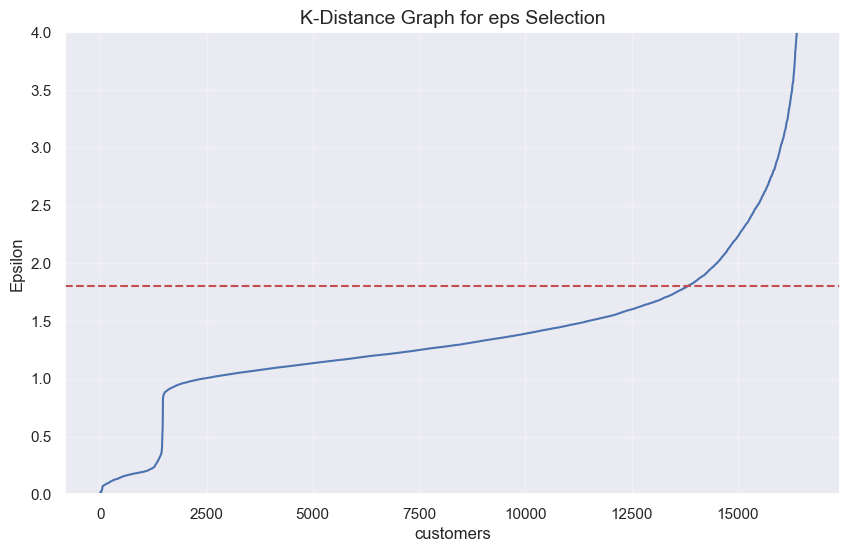

In [88]:
neigh = NearestNeighbors(n_neighbors=28) #2* nr de features
neigh.fit(customer[fs_metric_features])
distances, _ = neigh.kneighbors(customer[fs_metric_features])

# Ordenar e plotar
distances = np.sort(distances[:, -1], axis=0)

plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title('K-Distance Graph for eps Selection', fontsize=14)
plt.xlabel('customers')
plt.ylabel('Epsilon')
plt.grid(True, alpha=0.3)
plt.axhline(y=1.8, color='r', linestyle='--', label='Potential eps (elbow)')
plt.ylim(0,4)
plt.show()

In [89]:
all_customers = customer.copy()

In [90]:
dbscan = DBSCAN(eps=1.8, min_samples=28, n_jobs=-1) 
dbscan_labels = dbscan.fit_predict(customer[fs_metric_features]) # ou features_modelo

outlier_count = Counter(dbscan_labels)
print(f"DBSCAN results: {outlier_count}")
print(f"Outliers detected (-1): {outlier_count[-1]}")
n_core = sum([count for label, count in outlier_count.items() if label != -1])
print(f"Core customers: {n_core}")

customer_out = customer[dbscan_labels == -1].copy()

# data frame limpo scaled para o kmeans
customer = customer[dbscan_labels != -1].copy()

print(f"\nWorking with {len(customer):,} core customers, {np.round(customer.shape[0] / all_customers.shape[0], 4)}")
print(f"Outliers saved for later: {len(customer_out)}")

DBSCAN results: Counter({np.int64(2): 10207, np.int64(3): 3296, np.int64(-1): 1566, np.int64(0): 1128, np.int64(1): 345, np.int64(4): 32})
Outliers detected (-1): 1566
Core customers: 15008

Working with 15,008 core customers, 0.9055
Outliers saved for later: 1566


## 6. Data Segmentation

### 6.1 RFM Analysis

alterar M depois do feature engineering

To better understand customer behavior and identify meaningful subgroups, we applied an RFM (recency, frequency, monetary) segmentation model. This method classifies customers based on:
- Recency (R): how recently they flew;
- Frequency (F): how often they fly;
- Monetary (M): how much money they spend.

This allows us to highlight high-value customers, at-risk customers, and behavioral patterns relevant for targeted marketing strategies.

atencao: alterar depois monetary (atualmente é CLV, mas temos de mudar)

In [91]:
def create_rfm_quantiles(df, recency, frequency, monetary, rec_ascending=True, freq_ascending=False, mon_ascending=False):
    rfm_df = df.copy()

    rfm_df["R_quintile"] = pd.qcut(rfm_df[recency].rank(method="first", ascending = rec_ascending),
                                   q=5, labels=[1,2,3,4,5]
                                   ).astype(int)
    rfm_df["F_quintile"] = pd.qcut(rfm_df[frequency].rank(method="first", ascending = freq_ascending),
                                   q=5, labels=[1,2,3,4,5]
                                   ).astype(int)
    rfm_df["M_quintile"] = pd.qcut(rfm_df[monetary].rank(method="first", ascending = mon_ascending),
                                   q=5, labels=[1,2,3,4,5]
                                   ).astype(int)

    rfm_df["RFM_score"] = (rfm_df["R_quintile"].astype(str) + rfm_df["F_quintile"].astype(str) + rfm_df["M_quintile"].astype(str))

    return rfm_df


In [92]:
customer = create_rfm_quantiles(customer,recency="recency_months",frequency="NumFlights", monetary="CLV", rec_ascending=False, freq_ascending=True, mon_ascending=True)
customer.head()
customer.iloc[:,17:]

,oh_High School or Below,oh_Master,oh_Married,oh_Single,oh_Standard,oh_British Columbia,oh_Manitoba,oh_New Brunswick,oh_Newfoundland,oh_Nova Scotia,...,oh_Vancouver,oh_Victoria,oh_West Vancouver,oh_Whistler,oh_Whitehorse,oh_Winnipeg,R_quintile,F_quintile,M_quintile,RFM_score
9494,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,5,1,1,511
10877,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,5,1,1,511
427,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,5,1,1,511
7985,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,5,1,1,511
11944,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,2,3,123
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7976,0,0,0,1,1,0,0,1,0,0,...,0,0,0,0,0,0,5,4,3,543
13107,0,0,0,0,1,1,0,0,0,0,...,1,0,0,0,0,0,5,3,4,534
6173,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,5,3,5,535
11788,0,0,1,0,1,1,0,0,0,0,...,1,0,0,0,0,0,5,3,5,535


Customer segmentation

We defined a set of business-driven RFM rules to map each customer into a meaningful segment.  
This includes groups such as:

| Segment                |  RFM  | Description                                                                 |  Marketing                                              |
|------------------------|-------------------|-----------------------------------------------------------------------------|-----------------------------------------------------------------------------|
| **High-value Loyal customers**          | 555               | Recently active, purchase frequently, and spend the most.                   | VIP programs, exclusive rewards, early access to new products.             |
| **Loyal Frequent customers**    | X5X               | High purchase frequency, even if not always recent.                         | Personalized offers, loyalty nurturing, regular engagement.                |
| **Big spenders**       | XX5               | Highest monetary contribution but not necessarily frequent or recent.       | Promote premium products, upselling opportunities.                         |
| **Potential Loyalists**| 515 / 525         | Recent high spenders with still low frequency.                               | Encourage repeat purchases with progressive discounts or subscriptions.    |
| **New customers**      | 511 / 512         | Recently acquired but with low spending and low frequency.                  | Welcome campaigns, onboarding flows, recurring purchase incentives.        |
| **At Risk customers**  | 155 / 255         | Previously high frequency and/or high spenders, but not recent.             | Re-engagement campaigns, special comeback offers.                          |
| **Lost customers**     | 155  | High-value customers who have been inactive for a long time.                | Aggressive recovery campaigns, personalized incentives.                    |
| **Lost Cheap customers** | 111             | Long inactive, low frequency, and low spending.                             | Avoid spending resources trying to reacquire.                              |
| **Others**             | Mixed             | Customers who don’t fit cleanly into the above priority groups.             | General marketing strategies depending on overall business goals.          |


In [93]:
def assign_segment(rfm):
        r, f, m = int(rfm[0]), int(rfm[1]), int(rfm[2])

        if r == 5 and f == 5 and m == 5:
            return "High-value Loyal customers"

        if f == 5 and not (r == 5 and m == 5):  
            return "Loyal Frequent customers"

        if m == 5 and not (r == 5 and f == 5):
            return "Big spenders"

        if r == 5 and m == 5 and f in [1, 2]:
            return "Potential Loyalists"

        if r == 5 and f == 1 and m in [1,2]:
            return "New customers"

        if (r in [1,2]) and f == 5 and m == 5:
            return "At Risk customers"

        if r == 1 and f == 5 and m == 5:
            return "Lost customers"

        if r == 1 and f == 1 and m == 1:
            return "Lost Cheap customers"

        return "Others"


RFM_segment
Others                        8736
Loyal Frequent customers      2673
Big spenders                  1565
New customers                 1387
High-value Loyal customers     329
Lost Cheap customers           318
Name: count, dtype: int64

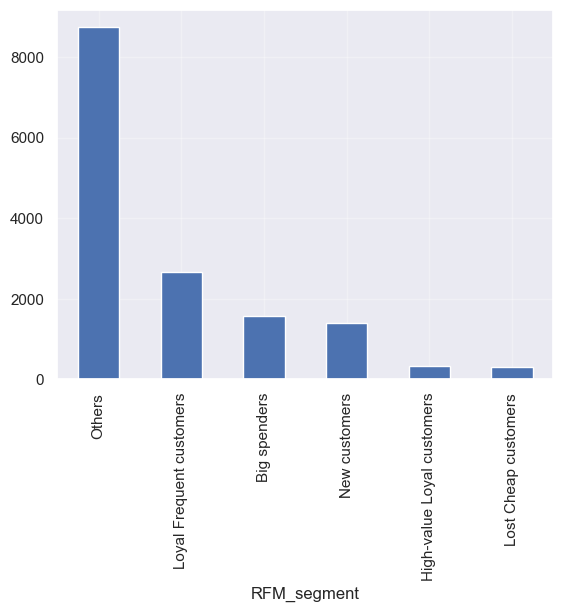

In [94]:
customer["RFM_segment"] = customer["RFM_score"].apply(assign_segment)
customer["RFM_segment"].value_counts().plot(kind="bar")
customer["RFM_segment"].value_counts()

The final distribution of segments highlights the behavioral diversity within the customer base.  
A larger presence of groups such as Loyal customers or Big spenders indicates strong retention and high engagement.  
Conversely, the proportion of At Risk or Lost customers reveals potential churn issues that may require dedicated retention strategies.

## 7. Data Clustering

In [95]:
fs_metric_features

['Income',
 'CLV',
 'NumFlights',
 'Fall_Ratio',
 'Spring_Ratio',
 'Summer_Ratio',
 'Winter_Ratio',
 'Seasonality_Index',
 'Flight_Trend_Slope',
 'Companion_Ratio',
 'Avg_Distance_Flight',
 'recency_months',
 'Tenure',
 'PointsUtilizationRate']

**Perspectives**

In [96]:
clustering_perspectives = {
    # Value-based segmentation: assesses the economic value and long-term
    # relationship of each customer with the company.
    "Value_Segmentation": [
        'CLV',
        'Income',
        'PointsUtilizationRate',
        'Tenure'
    ],

    # Behavioral segmentation: analyzes how customers travel and how
    # their travel behavior evolves over time.
    "Behavioral_Segmentation": [
        'NumFlights',
        'Avg_Distance_Flight',
        'recency_months',
        'Companion_Ratio',
        'Flight_Trend_Slope'
    ],

    # Seasonality segmentation: captures when customers travel during
    # the year and their dependency on specific seasons.
    "Seasonality_Segmentation": [
        'Fall_Ratio',
        'Spring_Ratio',
        'Summer_Ratio',
        'Winter_Ratio',
        'Seasonality_Index'
    ]
}

In [97]:
# Demographic segmentation: quem são os clientes em termos de perfil socioeconómico?
Demographic_Segmentation = [
        'Province or State',
        'City',
        'Location Code',
        'Gender',
        'Education',
        'Marital Status'
]

### 7.1 Value segmentation perspective

In [98]:
%load_ext autoreload
%autoreload 2

In [99]:
features_val = clustering_perspectives['Value_Segmentation']

#### 7.1.1 K-means and Hierarchical clustering

To ensure a robust segmentation, we will not rely solely on K-Means.
We will compare it against Hierarchical Clustering to validate the number of clusters k and check if the customer groups have irregular shapes. The algorithm that best explains the variance R^2 of the data will be selected for the final profiling.

In [100]:
df_value_kmeans_hc = customer[features_val].copy()
df_value_kmeans_hc

,CLV,Income,PointsUtilizationRate,Tenure
9494,-2.321024,0.334546,-0.592971,-1.641869
10877,-0.957750,0.705538,-0.592971,-1.641869
427,-2.005796,0.483691,-0.592971,-1.641869
7985,-2.646570,-1.708342,-0.592971,-1.641869
11944,0.106175,0.689352,-0.132972,-1.641869
...,...,...,...,...
7976,0.352186,-1.708342,-0.217197,1.785661
13107,0.713888,0.451972,-0.074309,1.787053
6173,1.133051,0.615203,-0.196083,1.788445
11788,1.390079,0.681059,-0.123669,1.788445


In [101]:
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

In [102]:
hierarchical = AgglomerativeClustering(
    metric='euclidean'
)

In [103]:
df_value_sample = df_value_kmeans_hc.sample(n=5000, random_state=42)

We used a subset of the data to determine the optimal number of clusters k and the best clustering approach, overcoming the constraints about calculating the distance matrix for the entire population.

In [104]:
os.environ["OMP_NUM_THREADS"] = "1"

r2_scores = {}

r2_scores['kmeans'] = func.get_r2_scores(df_value_sample, df_value_kmeans_hc.columns.tolist(), kmeans)

for linkage in ['complete', 'average', 'single', 'ward']: # 4 different versions of HC
    r2_scores[linkage] = func.get_r2_scores(
        df_value_sample,                 # data
        df_value_kmeans_hc.columns.tolist(),   # features of perspective
        # use HClust, changing the linkage at each iteration
        hierarchical.set_params(linkage=linkage) 
    )

In [105]:
r2_scores_df = pd.DataFrame(r2_scores)
r2_scores_df

,kmeans,complete,average,single,ward
1,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.349689,0.280505,0.349689,0.349689,0.349689
3,0.600100,0.433073,0.351016,0.350317,0.571737
4,0.670274,0.605132,0.533458,0.350760,0.648062
5,0.737162,0.622148,0.591734,0.351228,0.709280
6,0.769714,0.688459,0.592044,0.351614,0.746888
7,0.791570,0.704848,0.593350,0.351878,0.769902
8,0.811216,0.709522,0.610775,0.352240,0.790723


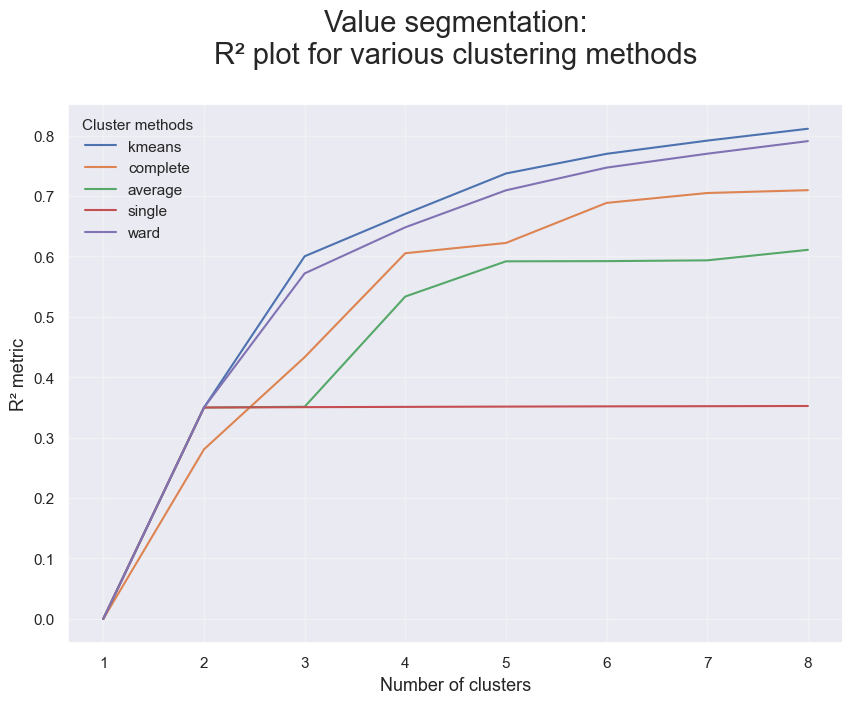

In [106]:
r2_scores_df.plot.line(figsize=(10,7))

plt.title("Value segmentation:\nR² plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()

The comparison identifies K-Means as the best algorithm for this dataset, since it achieves the highest R^2 scores across all cluster counts.
Analyzing the elbow of the curve reveals that 5 clusters is the optimal solution.

In [107]:
df_sample_value_viz = df_value_kmeans_hc.sample(n=3000, random_state=42)

To optimize processing time, we will generate the Silhouette plot using a random subset of 3,000 customers.

For n_clusters = 2, the average score is: 0.4145
For n_clusters = 3, the average score is: 0.4042
For n_clusters = 4, the average score is: 0.3999
For n_clusters = 5, the average score is: 0.3539
For n_clusters = 6, the average score is: 0.3577
For n_clusters = 7, the average score is: 0.3251
For n_clusters = 8, the average score is: 0.3118
For n_clusters = 9, the average score is: 0.3074
For n_clusters = 10, the average score is: 0.3136


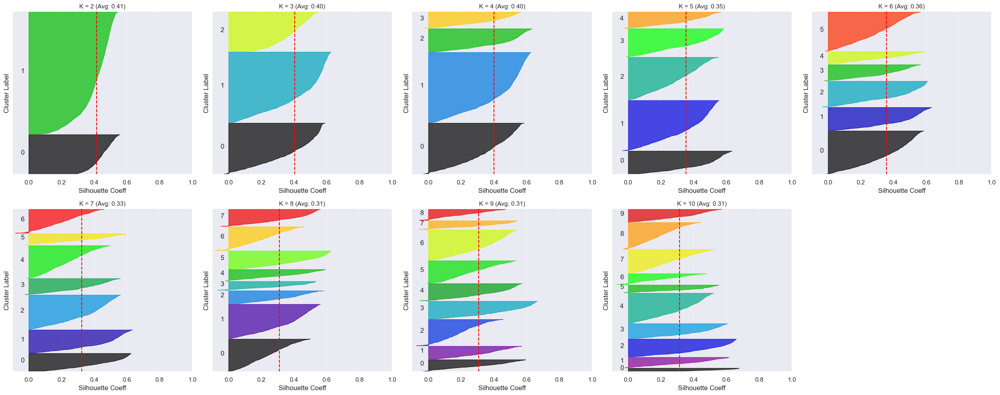

In [108]:
func.visualize_silhouette_graf(df_sample_value_viz, range_clusters=range(2, 11))

While the Elbow Method visually suggested an optimal solution between k=2 and k=4, we selected k=5 as the final structure.This decision was driven by two factors:R-Squared Maximization: The 5-cluster solution yielded a higher Coefficient of Determination ($R^2$), ensuring a tighter statistical fit and lower intra-cluster variance. More importantly, the move from 4 to 5 clusters allowed for the separation of the 'New Customer' segment into two distinct profiles (High Potential vs. Low Value). This distinction, clearly visible in the SOM topology, would be lost in a 4-cluster solution.Therefore, we prioritized Business Interpretability and strategic actionability over the strict parsimony of the Elbow curve.

In [109]:
kmeans_value = KMeans(
    n_clusters=5,
    init='k-means++',
    n_init=500,
    random_state=42
)

In [110]:
value_labels = kmeans_value.fit_predict(df_value_kmeans_hc)
value_labels

array([2, 2, 2, ..., 1, 1, 1], shape=(15008,), dtype=int32)

In [111]:
print(pd.Series(value_labels).value_counts().sort_index())

0    1532
1    4594
2    2678
3    2141
4    4063
Name: count, dtype: int64


#### 7.1.2 DBSCAN

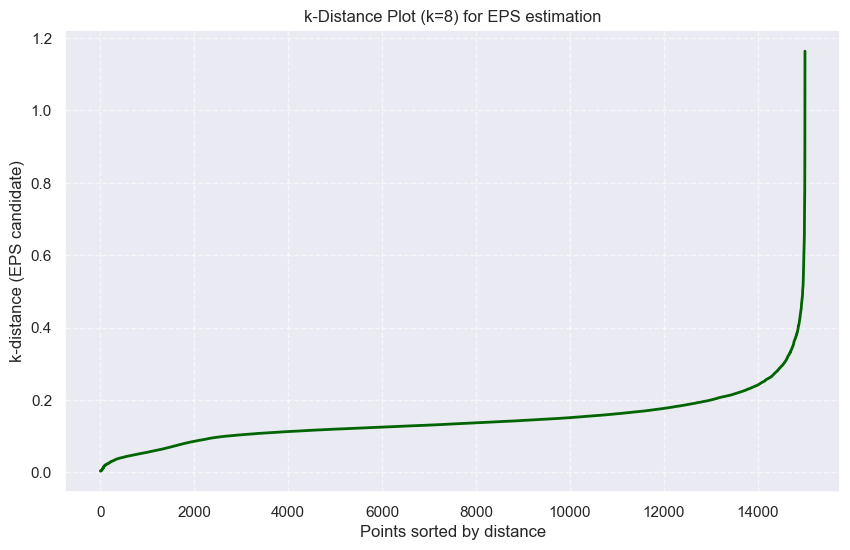

In [112]:
k_val = plot_k_distance(customer, features_val)

In [113]:
dbscan_results = {}

labels_val, n_clus_val, dist_val = get_dbscan(
    customer, 
    features_val, 
    eps=0.2,
    min_samples=7
)

dbscan_results['Value'] = {'Clusters': n_clus_val, 'Distribution': dist_val}

Clusters found: 15
Noise: 865 customers (5.76%)
Cluster Distribution:
-1       865
 0     10702
 1      2998
 2         7
 3        14
 4        63
 5         7
 6         9
 7         4
 8         7
 9         6
 10       17
 11      269
 12       11
 13       22
 14        7
Name: count, dtype: int64
R2 Score: 0.3652


Here we can see a good example of a bad clustering solution, where DBSCAN creates a large number of small clusters and a few large clusters. Its does not provide a clear separation between clusters and it is not a good solution for this dataset.

#### 7.1.3 HDBSCAN

In [114]:
labels_hdb_val, n_hdb_val, dist_hdb_val = func.get_hdbscan(
    customer, 
    features_val, 
    min_cluster_size=200, 
    min_samples=7         
)

c:\Users\alexc\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\sklearn\cluster\_hdbscan\hdbscan.py:722: FutureWarning:

The default value of `copy` will change from False to True in 1.10. Explicitly set a value for `copy` to silence this warning.



Clusters found: 3
Noise: 22 customers (0.15%)
Cluster distribution:
-1       22
 0    11335
 1     3381
 2      270
Name: count, dtype: int64
R2 Score: 0.3620


Compared to DBSCAN, HDBSCAN creates a more balanced distribution of clusters, with a more uniform size of clusters. But we have 2 groups that are bigger than the others, which is not a good solution for this dataset.

#### 7.1.4 Mean-shift

In [115]:
df_value_meanshift= customer.copy()
df_value_meanshift['Cluster_MS_val'] = get_meanshift(customer, features_val)

Used quantile 0.25 -> 2 clusters found.


In [116]:
print(df_value_meanshift.groupby('Cluster_MS_val')[features_val].mean())
print("\nCluster Sizes:")
print(df_value_meanshift.groupby('Cluster_MS_val').size())

                     CLV    Income  PointsUtilizationRate    Tenure
Cluster_MS_val                                                     
0               0.304810  0.579511              -0.061984  0.067785
1              -0.474672 -1.706172              -0.030252  0.112212

Cluster Sizes:
Cluster_MS_val
0    11331
1     3677
dtype: int64


The Mean Shift algorithm, which relies on density estimation, failed to capture the granularity required for effective segmentation. It produced a binary solution (k=2):

Cluster 0: An overly broad segment containing 75% of the database, merging 'Mass Market' customers with 'High-Value' VIPs.

Cluster 1: A smaller segment of low-income customers.

This lack of granularity renders Mean Shift unsuitable for our strategic goals.

#### 7.1.5 Gaussian Mixture Model

In [117]:
df_value_gaussian_mix_model= customer.copy()

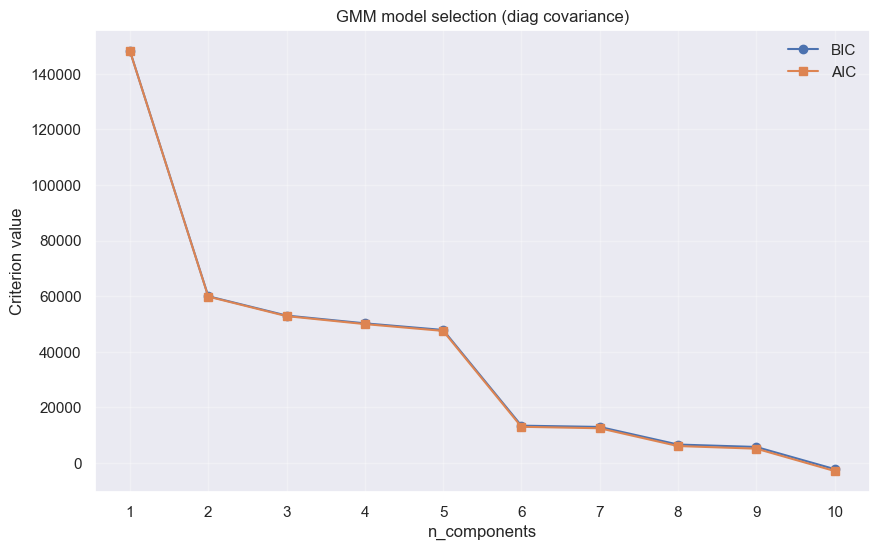

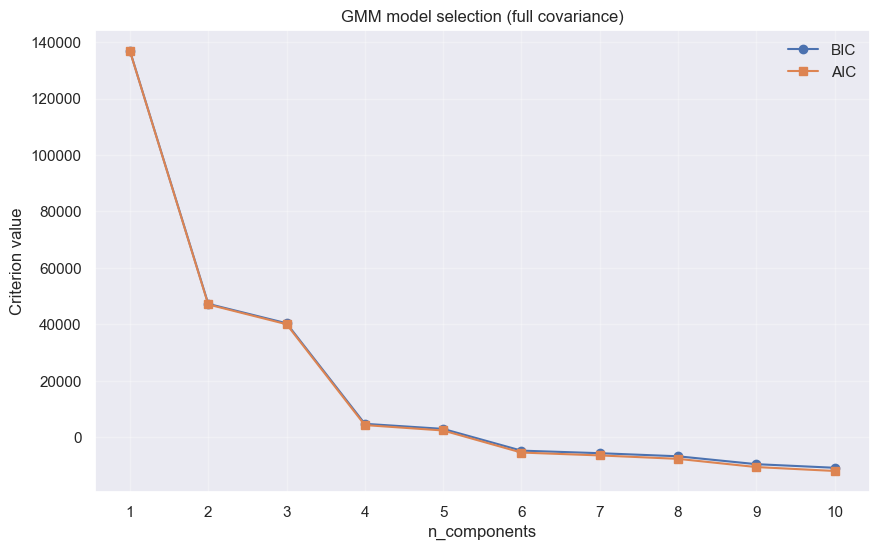

In [118]:
get_n_components(df_value_gaussian_mix_model, features_val)

The optimal number of components ($K$) for the Gaussian Mixture Model was determined by minimizing the Akaike Information Criterion (AIC) and Bayesian Information Criterion (BIC). These metrics were evaluated for both Diagonal and Full covariance structures across a range of 1 to 10 components.

The **Full Covariance** structure is strictly superior to the Diagonal structure for this dataset.
* **Magnitude of Error:** The Full Covariance model achieves significantly lower criterion scores, dropping to approximately **5,000** at 4 components. In contrast, the Diagonal model’s score at the same point is much higher, hovering around **50,000**.
* **Implication:** This massive gap in scores confirms that the features in the dataset are strongly correlated. The Diagonal model's assumption of independence is incorrect and fails to efficiently capture the data's complexity compared to the Full Covariance model.

The Full Covariance plot displays a unique "stepped" trajectory that strongly supports the selection of 4 clusters:
* **The "Elbow" at $K=4$:** While there is an initial drop from 1 to 2 components, the most dramatic and defining feature of the plot is the precipitous drop from $K=3$ to $K=4$. The score plummets from ~40,000 to ~5,000, indicating that the 4th component captures a massive amount of structural information.
* **Stability ($K=4$ to $K=5$):** Immediately following this drop, the curve hits a distinct plateau between 4 and 5 components, where the AIC/BIC values stabilize. This suggests that adding a 5th component provides negligible statistical gain, making 4 the most efficient "natural" breakpoint in the data.

**Decision:** A **Full Covariance GMM with 4 components** is selected as the optimal model.

In [119]:
gmm_model_value, df_concat_value = fit_gmm_segmentation(df_value_gaussian_mix_model, features_val, k=4, rsq_func=get_rsq)

GMM (full, k=4) R² score: 0.5127

Cluster Sizes:
gmm_labels
0    1190
1    3305
2    3673
3    6840
Name: count, dtype: int64



--- GMM Probability Analysis ---
Threshold: 90%
Clear assignments: 14,278 customers
Uncertain assignments: 730 customers (4.9%)


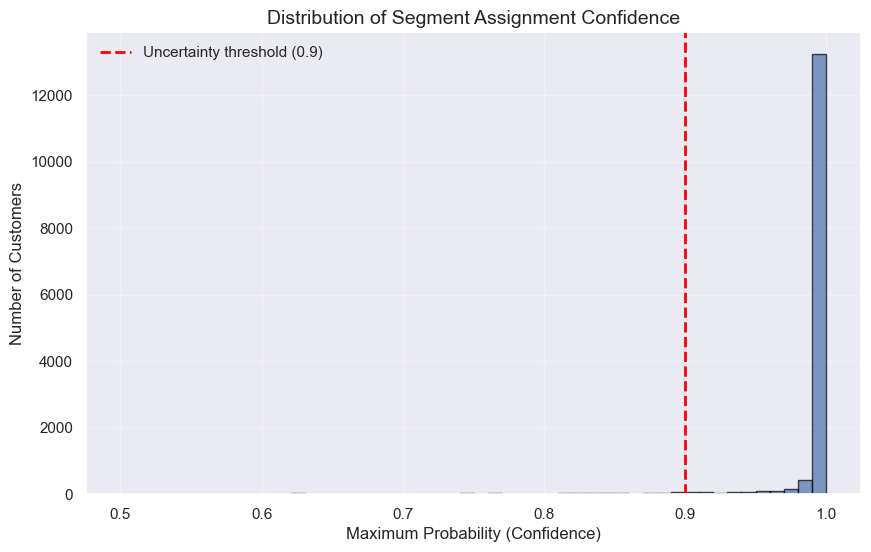

In [120]:
analyze_gmm_uncertainty(gmm_model_value, df_value_gaussian_mix_model, features_val, threshold=0.9)

**Uncertainty Analysis**
* **Threshold:** A strict confidence threshold of **90%** was applied to test the robustness of the clusters.
* **Results:** The model successfully classified **95.1%** of customers (14,278) with high confidence. The remaining **4.9%** lie in the "boundary" regions between clusters.

#### 7.1.6 SOM

##### 7.1.6.1 Component planes and U-matrix

In [121]:
grid_size = 12
features_to_use = features_val

# Inicializar e Treinar
som_val = MiniSom(x=grid_size, y=grid_size, input_len=len(features_to_use),
                  topology='hexagonal', sigma=1.0, learning_rate=0.5,
                  random_seed=42)
som_val.random_weights_init(customer[features_to_use].values)
som_val.train_batch(customer[features_to_use].values, 50000, verbose=True)

weights_val = som_val.get_weights()


 [ 50000 / 50000 ] 100% - 0:00:00 left 
 quantization error: 0.5721468662766239


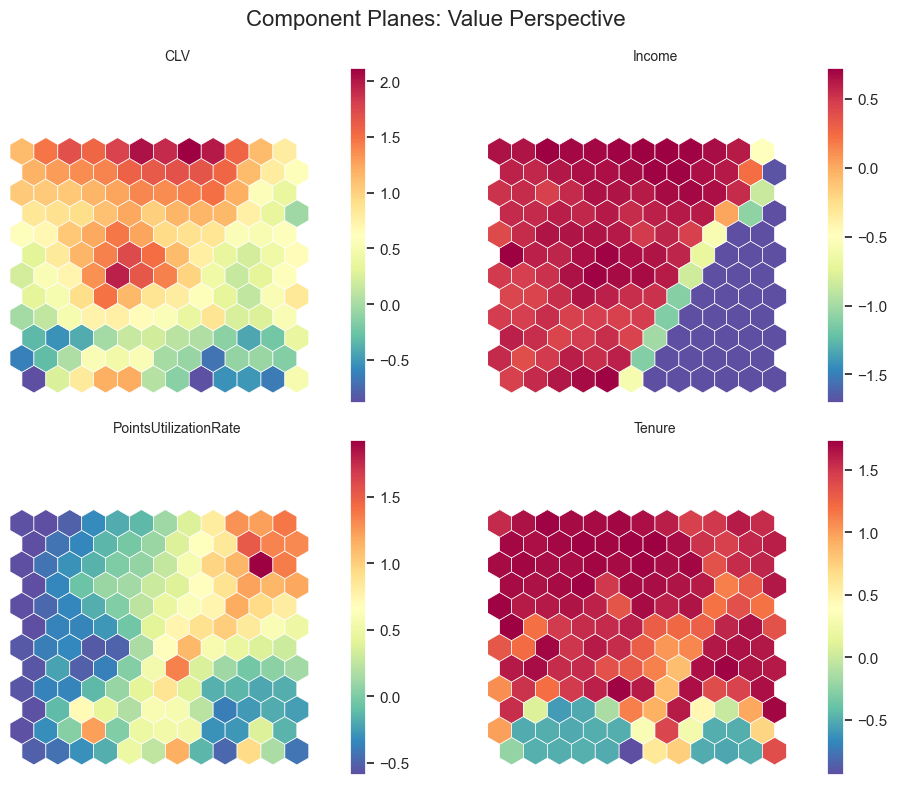

In [122]:
n_plots = len(features_to_use)
n_cols = 2 
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 8))
axes = axes.flatten()

for i, feature_name in enumerate(features_to_use):
    # Extrair os pesos desta variável
    feature_weights = weights_val[:, :, i]
    
    # Desenhar o mapa (assumindo que já tens a função plot_hexagons carregada)
    plot_hexagons(feature_weights, som_val, axes[i], label=feature_name, cmap=cm.Spectral_r)

plt.suptitle("Component Planes: Value Perspective", fontsize=16)
plt.tight_layout()
plt.show()

The visual analysis of the Component Planes reveals a strong spatial correlation between Income and CLV, creating a clear horizontal gradient that separates high-value users (Left) from the lower-value majority (Right). Additionally, the Tenure plane identifies a distinct, isolated 'island' of new customers (bottom-center), topologically separated from the established customer base.


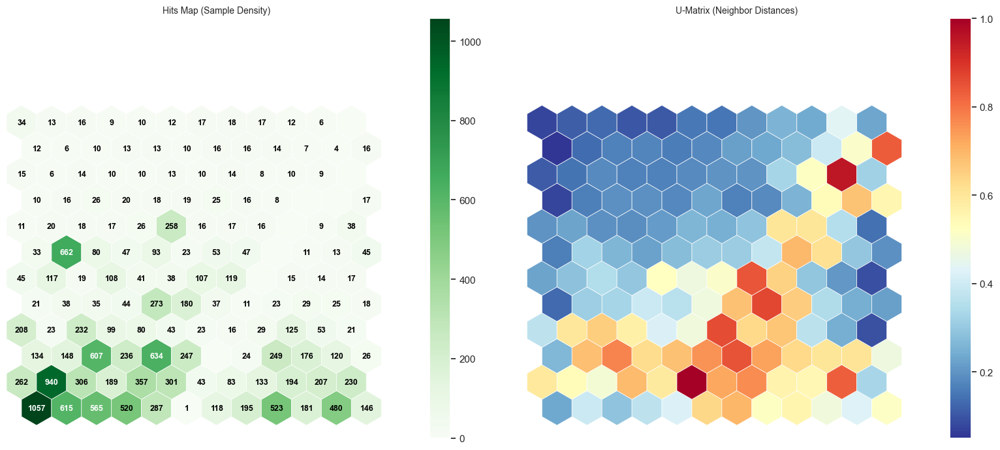

In [123]:
plot_som_diagnostics(som_val, customer[features_val].values)

The Hits Map confirms a highly skewed distribution consistent with the Pareto Principle. The vast majority of the customer base is concentrated in a high-density cluster in the bottom-center region (neurons containing >1000 samples), while the high-value areas on the left remain sparsely populated, indicating that 'VIP' customers are rare and unique.

The U-Matrix validates the structural separation of the segments. A distinct vertical barrier of high distances (Red/Orange nodes) runs through the center of the map, mathematically isolating the dense 'Mass Market' region from the Premium segments. This confirms that the difference between these groups is not gradual, but represents a significant jump in financial behavior.

##### 7.1.6.2 SOMS with K-means

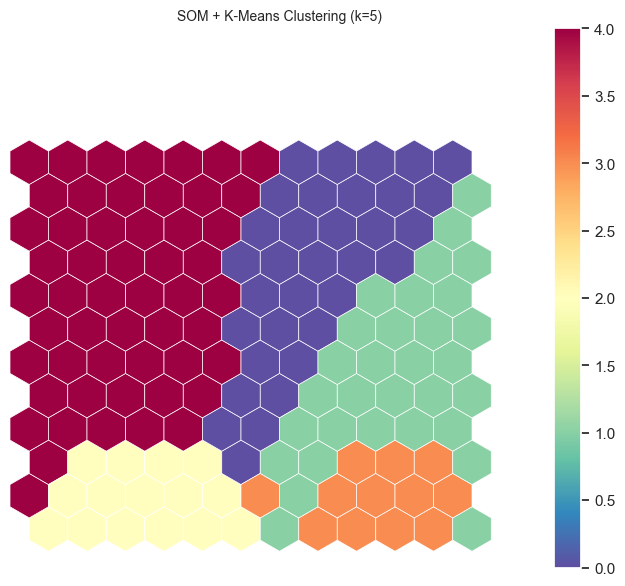

In [124]:
labels_som_kmeans_val = run_som_kmeans(som_val, customer[features_val].values, n_clusters=5) 

Green: The entire left side of the map forms a large, contiguous region. Correlating with the Component Planes, this represents the Premium/VIP segment, characterized by high Income and CLV.

Red: The algorithm successfully isolated a distinct, compact cluster in the bottom-center. This perfectly aligns with the low-tenure 'island' observed in the feature maps, proving that New Customers are structurally unique.

Yellow & Orange: The right side of the map (lower income) is clearly divided into two distinct sub-segments (Top-Right and Bottom-Right). This suggests that K-Means identified nuances within the 'Mass Market'—likely differentiating between 'Drifting' customers and 'Loyal Low-Value' users.


##### 7.1.6.3 SOMS with Hierarchical clustering

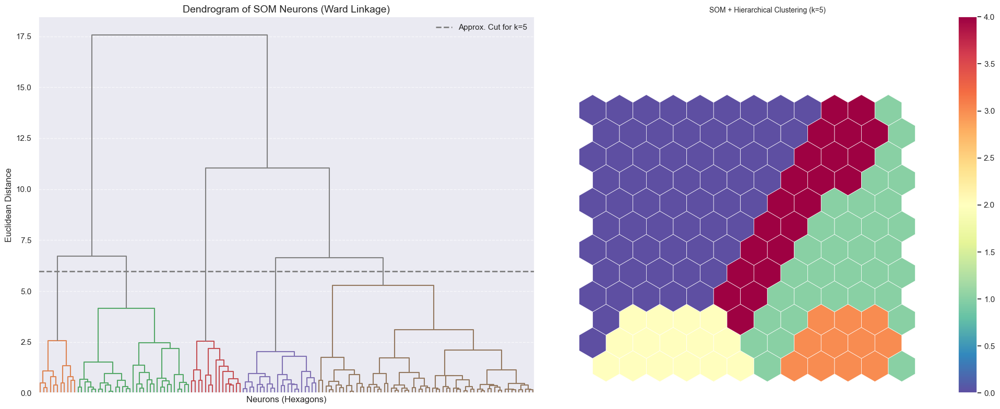

In [125]:
labels_som_hc_val = run_som_hierarchical(som_val, customer[features_val].values, n_clusters=5)

Green: The algorithm identified a massive, contiguous region on the Left side. This is virtually identical to the K-Means 'High Value' cluster, proving that the Premium segment is the most distinct and stable group in the database.

Yellow: The Bottom-Center region (Yellow) is cleanly isolated. This aligns perfectly with the 'Low Tenure' island seen in the Component Planes, confirming that distinct strategies are needed for this onboarding segment.

Purple/Red/Orange: On the Right side (lower income), the Hierarchical method creates a vertical stratification. Unlike K-Means, which treated the corners as similar, Hierarchical Clustering suggests a 'ladder' of value within the Mass Market, likely separating customers based on slight variations in spending frequency or engagement.

#### Value segmentation results

In [126]:
results_value = []
# Ensure we are using the correct data
X_value = customer[features_val].copy()

# =========================================================
# 1. K-MEANS 
# =========================================================
metrics_km_hc = get_model_metrics(
    df=X_value,
    labels=value_labels, 
    model_name="K-Means", 
    perspective="Value"
)
results_value.append(metrics_km_hc)

# =========================================================
# 2. DBSCAN
# =========================================================
metrics_dbscan = get_model_metrics(
    df=X_value,
    labels=labels_val, 
    model_name="DBSCAN",
    perspective="Value"
)
results_value.append(metrics_dbscan)

# =========================================================
# 3. HDBSCAN
# =========================================================
metrics_hdb = get_model_metrics(
    df=X_value,
    labels=labels_hdb_val,
    model_name="HDBSCAN",
    perspective="Value"
)
results_value.append(metrics_hdb)

# =========================================================
# 4. GAUSSIAN MIXTURE (GMM)
# =========================================================
labels_value_gmm = gmm_model_value.predict(X_value)

metrics_gmm = get_model_metrics(
    df=X_value,
    labels=labels_value_gmm,
    model_name="Gaussian Mixture",
    perspective="Value"
)
results_value.append(metrics_gmm)

# =========================================================
# 5. SOM + K-MEANS
# =========================================================

metrics_som_km = get_model_metrics(
    df=X_value,
    labels=np.array(labels_som_kmeans_val),
    model_name="SOM + K-Means",
    perspective="Value"
)
results_value.append(metrics_som_km)

# =========================================================
# 6. SOM + HIERARCHICAL
# =========================================================

metrics_som_hc = get_model_metrics(
    df=X_value,
    labels=np.array(labels_som_hc_val),
    model_name="SOM + Hierarchical",
    perspective="Value"
)
results_value.append(metrics_som_hc)


In [127]:
df_compare_value = pd.DataFrame(results_value)
df_compare_value = df_compare_value.sort_values(by='R2 Score', ascending=False)
df_compare_value

,Perspective,Model Name,Num_Clusters,R2 Score,Silhouette Score,Davies-Bouldin,Calinski-Harabasz
0,Value,K-Means,5,0.7369,0.353,0.999,10507.8
4,Value,SOM + K-Means,5,0.6262,0.234,1.244,6284.5
5,Value,SOM + Hierarchical,5,0.6248,0.226,1.243,6245.8
3,Value,Gaussian Mixture,4,0.5127,0.217,1.507,5261.7
1,Value,DBSCAN,15,0.3792,-0.216,0.913,616.3
2,Value,HDBSCAN,3,0.3606,0.352,1.136,4224.6


### 7.2 Behavioral Segmentation perspective

In [128]:
features_behave = clustering_perspectives['Behavioral_Segmentation']

#### 7.2.1 K-means with Hierarchical clustering

In [129]:
df_behave_kmeans_hc = customer[features_behave].copy()
df_behave_kmeans_hc

,NumFlights,Avg_Distance_Flight,recency_months,Companion_Ratio,Flight_Trend_Slope
9494,-2.812689,-1.493399,-0.606190,-1.696969,-0.544848
10877,-2.812689,-1.493399,-0.606190,-1.696969,-0.544848
427,-2.812689,-1.493399,-0.606190,-1.696969,-0.544848
7985,-2.812689,-1.493399,-0.606190,-1.696969,-0.544848
11944,0.325471,0.808583,-0.021519,-0.927038,-0.016736
...,...,...,...,...,...
7976,0.511584,0.541788,-0.313854,-0.343360,-0.713790
13107,0.500966,-0.320906,-0.313854,-0.320547,0.285232
6173,0.500966,-0.079830,-0.313854,-0.487386,-0.084579
11788,0.493789,-0.354792,-0.313854,-0.473641,1.556957


In [130]:
df_behave_sample = df_behave_kmeans_hc.sample(n=5000, random_state=42)

In [131]:
r2_scores_behave = {}

r2_scores_behave['kmeans'] = func.get_r2_scores(df_behave_sample, df_behave_kmeans_hc.columns.tolist(), kmeans)

for linkage in ['complete', 'average', 'single', 'ward']: # 4 different versions of HC
    r2_scores_behave[linkage] = func.get_r2_scores(
        df_behave_sample,                 # data
        df_behave_kmeans_hc.columns.tolist(),   # features of perspective
        # use HClust, changing the linkage at each iteration
        hierarchical.set_params(linkage=linkage) 
    )

In [132]:
r2_scores_behave = pd.DataFrame(r2_scores)
r2_scores_behave

,kmeans,complete,average,single,ward
1,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.349689,0.280505,0.349689,0.349689,0.349689
3,0.600100,0.433073,0.351016,0.350317,0.571737
4,0.670274,0.605132,0.533458,0.350760,0.648062
5,0.737162,0.622148,0.591734,0.351228,0.709280
6,0.769714,0.688459,0.592044,0.351614,0.746888
7,0.791570,0.704848,0.593350,0.351878,0.769902
8,0.811216,0.709522,0.610775,0.352240,0.790723


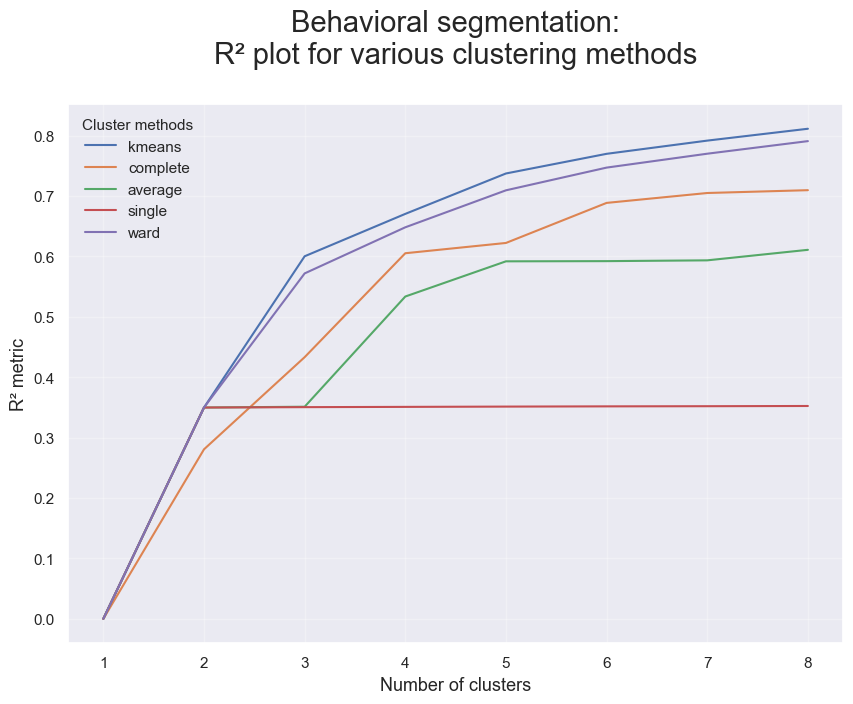

In [133]:
r2_scores_df_behave = pd.DataFrame(r2_scores)

r2_scores_df_behave.plot.line(figsize=(10,7))

plt.title("Behavioral segmentation:\nR² plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()

The comparison of clustering algorithms reveals that K-Means outperforms other methods, achieving the highest explained variance across all k values. Regarding the number of clusters, we identify a elbow at k=3. 

In [134]:
df_sample_behave_viz = df_behave_kmeans_hc.sample(n=3000, random_state=42)

To optimize processing time, we will generate the Silhouette plot using a random subset of 3,000 customers.

For n_clusters = 2, the average score is: 0.6250
For n_clusters = 3, the average score is: 0.3886
For n_clusters = 4, the average score is: 0.3419
For n_clusters = 5, the average score is: 0.3271
For n_clusters = 6, the average score is: 0.3133
For n_clusters = 7, the average score is: 0.3239
For n_clusters = 8, the average score is: 0.3078
For n_clusters = 9, the average score is: 0.2929
For n_clusters = 10, the average score is: 0.2969


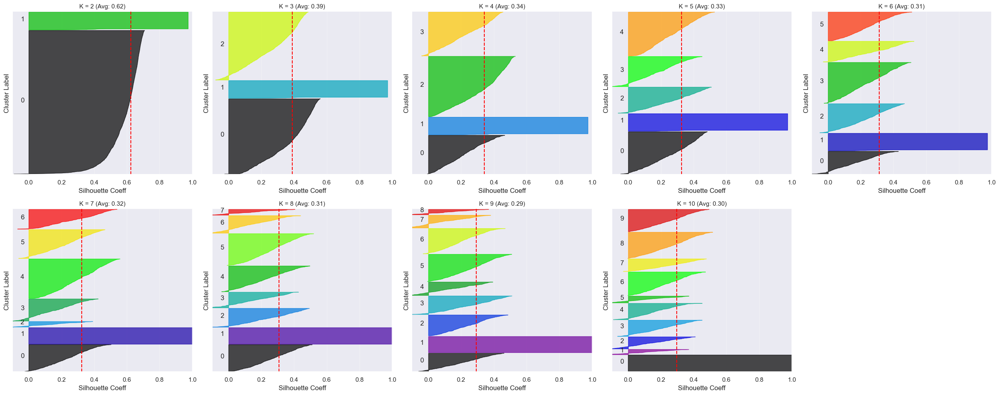

In [135]:
func.visualize_silhouette_graf(df_sample_behave_viz, range_clusters=range(2, 11))

Although the Silhouette analysis indicates a mathematical peak at k=2, we rejected this solution as it results in an oversimplified binary segmentation ( merely separating high vs. low values). We selected k=5 because it offers the optimal balance between statistical validity and business utility, allowing us to identify distinct niche profiles that would otherwise be merged in a 2-cluster solution.

In [136]:
kmeans_value = KMeans(
    n_clusters=5,
    init='k-means++',
    n_init=500,
    random_state=42
)

In [137]:
behave_labels = kmeans_value.fit_predict(df_behave_kmeans_hc)
behave_labels

array([1, 1, 1, ..., 3, 2, 1], shape=(15008,), dtype=int32)

In [138]:
print(pd.Series(behave_labels).value_counts().sort_index())

0    3740
1    1527
2    2730
3    3908
4    3103
Name: count, dtype: int64


#### 7.2.2 DBSCAN

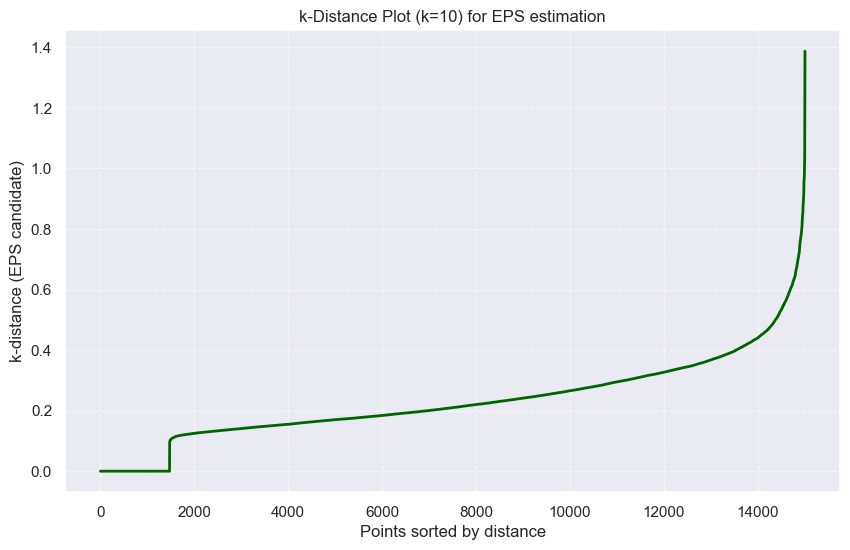

In [139]:
k_behave = plot_k_distance(customer, features_behave)

In [140]:
labels_behave, n_clus_behave, dist_behave = get_dbscan(
    customer, 
    features_behave, 
    eps=0.35,
    min_samples=9
)

dbscan_results['Behave'] = {'Clusters': n_clus_behave, 'Distribution': dist_behave}

Clusters found: 4
Noise: 1104 customers (7.36%)
Cluster Distribution:
-1     1104
 0     1473
 1    12416
 2        6
 3        9
Name: count, dtype: int64
R2 Score: 0.4839


Once again, DBSCAN didn't show a good distribution of the clusters, so we rejected this solution.

#### 7.2.3 HDBSCAN

In [141]:
labels_hdb_behave, n_hdb_behave, dist_hdb_behave = func.get_hdbscan(
    customer, 
    features_behave, 
    min_cluster_size=200, 
    min_samples=9         
)

c:\Users\alexc\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\sklearn\cluster\_hdbscan\hdbscan.py:722: FutureWarning:

The default value of `copy` will change from False to True in 1.10. Explicitly set a value for `copy` to silence this warning.



Clusters found: 2
Noise: 15 customers (0.10%)
Cluster distribution:
-1       15
 0     1473
 1    13520
Name: count, dtype: int64
R2 Score: 0.4723


As we can see here the HDBSCAN solution is not a good solution for this dataset, as the clusters are not homogenous.

#### 7.2.4 Mean-shift

In [142]:
df_behave_meanshift= customer.copy()
df_behave_meanshift['Cluster_MS_behave'] = get_meanshift(customer, features_behave)

Used quantile 0.25 -> 2 clusters found.


In [143]:
print(df_behave_meanshift.groupby('Cluster_MS_behave')[features_behave].mean())
print("\nCluster Sizes:")
print(df_behave_meanshift.groupby('Cluster_MS_behave').size())

                   NumFlights  Avg_Distance_Flight  recency_months  \
Cluster_MS_behave                                                    
0                    0.380839             0.088449       -0.167991   
1                   -2.735457            -1.439752       -0.585659   

                   Companion_Ratio  Flight_Trend_Slope  
Cluster_MS_behave                                       
0                         0.118713            0.133270  
1                        -1.695019           -0.520084  

Cluster Sizes:
Cluster_MS_behave
0    13456
1     1552
dtype: int64


Consistent with the previous findings, the Mean Shift algorithm produced an overly simplistic binary segmentation (k=2)

#### 7.2.5 Gaussian Mixture Model

In [144]:
df_behave_gaussian_mix_model= customer.copy()


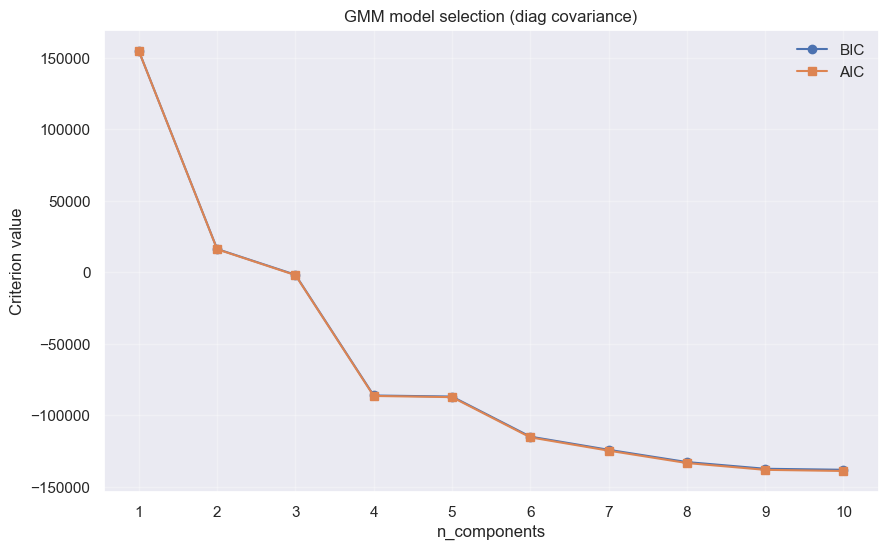

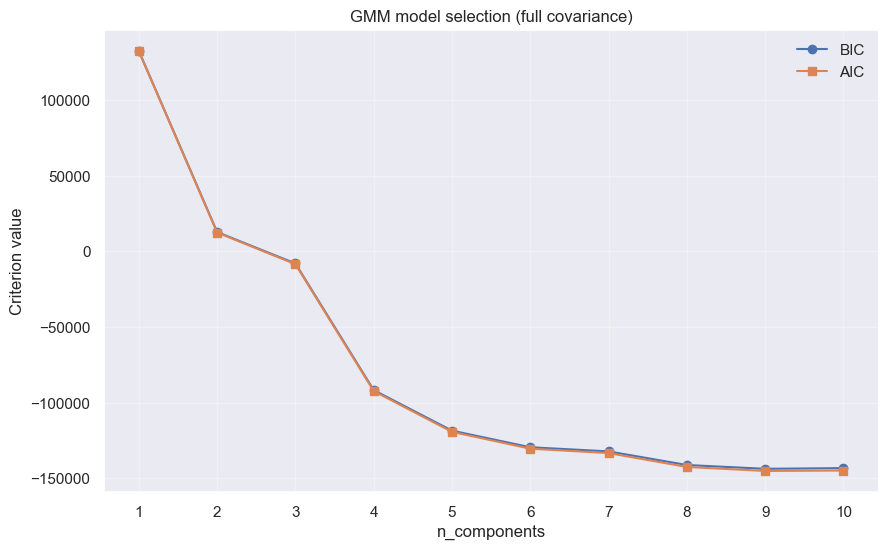

In [145]:
get_n_components(df_behave_gaussian_mix_model, features_behave)

The **Full Covariance** structure is significantly superior to the Diagonal structure for this dataset.
* **Magnitude of Error:** The Full Covariance model achieves substantially lower (better) criterion scores much earlier. At 4 components, the Full Covariance score is approximately **-90,000**, whereas the Diagonal model is only around **-80,000**.
* **Implication:** The consistent gap in scores confirms that the features in the dataset are correlated. The Diagonal model's assumption of independence is inefficient, requiring more components to match the fit that the Full Covariance model achieves with fewer.

The Full Covariance plot exhibits a clear "Elbow" that supports the selection of 4 clusters:
* **Precipitous Drop ($K=1$ to $K=4$):** There is a massive, nearly vertical reduction in AIC/BIC values from 1 to 4 components. The score drops from a positive ~140,000 down to a negative **-90,000**, indicating that these first four components capture the vast majority of the data's structural complexity.
* **The "Elbow" ($K=4$):** The curve bends noticeably at **4 components**. While there is still improvement moving to 5 and 6, the slope becomes much less steep compared to the dramatic descent seen prior to $K=4$.

**Decision:** A **Full Covariance GMM with 4 components** is selected as the optimal model.

In [146]:
gmm_model_behave, df_concat_behave = fit_gmm_segmentation(df_behave_gaussian_mix_model, features_behave, k=4, rsq_func=get_rsq)

GMM (full, k=4) R² score: 0.5427

Cluster Sizes:
gmm_labels
0    3671
1    8742
2    1473
3    1122
Name: count, dtype: int64



--- GMM Probability Analysis ---
Threshold: 95%
Clear assignments: 14,580 customers
Uncertain assignments: 428 customers (2.9%)


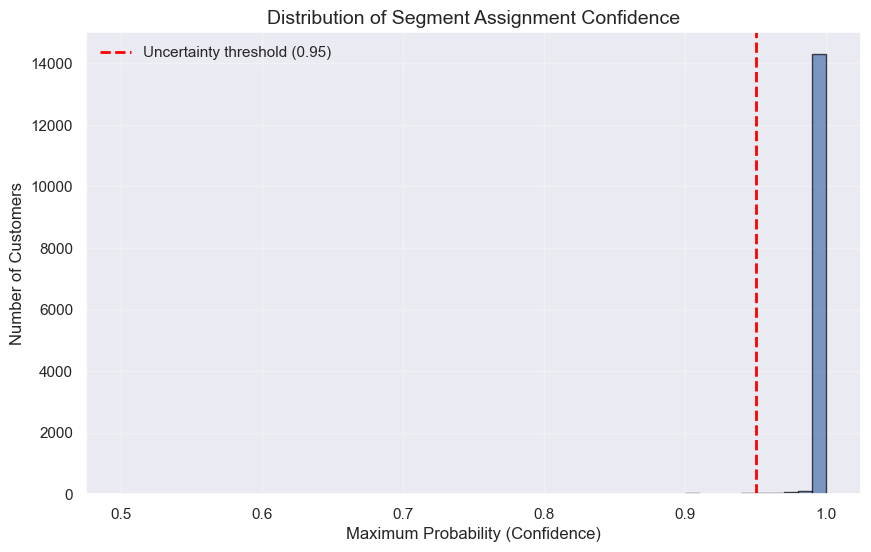

In [147]:
analyze_gmm_uncertainty(gmm_model_behave, df_behave_gaussian_mix_model, features_behave, threshold=0.95)

**Uncertainty Analysis**
* **Threshold:** A strict confidence threshold of **95%** was applied to test the robustness of the clusters.
* **Results:** The model successfully classified **97.1%** of customers (14,580) with high confidence. The remaining **2.9%** lie in the "boundary" regions between clusters.

#### 7.2.6 SOM

##### 7.2.6.1 Component planes and U-matrix

In [148]:
grid_size = 12
features_to_use = features_behave

# Inicializar e Treinar
som_behave = MiniSom(x=grid_size, y=grid_size, input_len=len(features_to_use),
                  topology='hexagonal', sigma=1.0, learning_rate=0.5,
                  random_seed=42)

som_behave.random_weights_init(customer[features_to_use].values)
som_behave.train_batch(customer[features_to_use].values, 20000, verbose=True)

weights_behave = som_behave.get_weights()

 [ 20000 / 20000 ] 100% - 0:00:00 left 
 quantization error: 0.3514763038213148


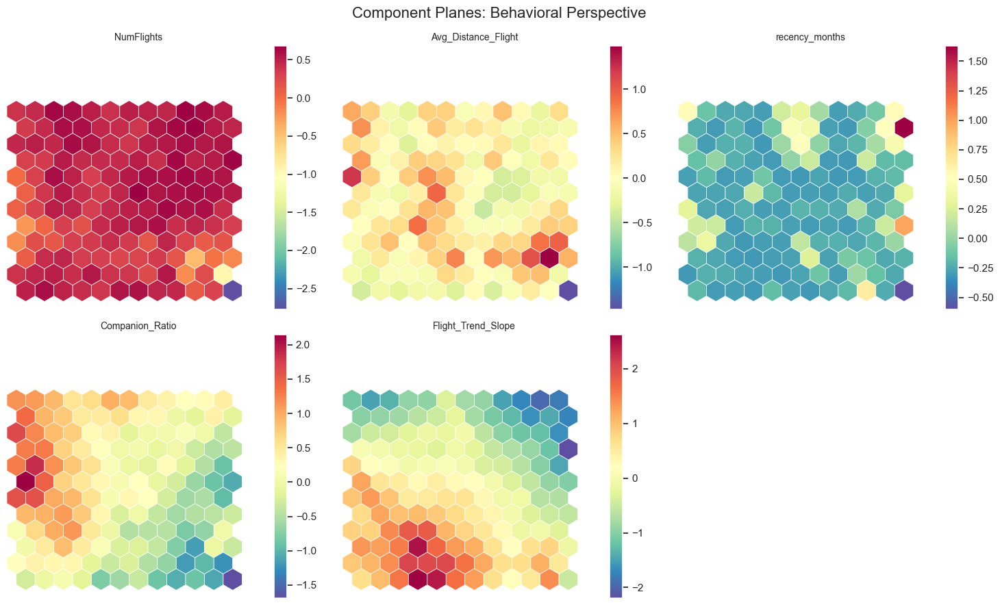

In [149]:
n_plots = len(features_behave)
n_cols = 3 
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 9))
axes = axes.flatten()

# 4. Loop through features and plot
for i, feature_name in enumerate(features_behave):
    # Extract weights for this specific feature
    feature_weights = weights_behave[:, :, i]
    
    # Plot the hexagon map
    # Using Spectral_r: Red = High Values, Blue = Low Values
    plot_hexagons(feature_weights, som_behave, axes[i], label=feature_name, cmap=cm.Spectral_r)

# 5. Hide the empty subplot (since we have 5 plots for 6 spaces)
for j in range(n_plots, len(axes)):
    axes[j].axis('off')

plt.suptitle("Component Planes: Behavioral Perspective", fontsize=16)
plt.tight_layout()
plt.show()

Bottom-Left: This region represents the ideal customer behavior. It combines High Frequency (NumFlights in Red) with a strongly Positive Trend (Flight_Trend_Slope in Dark Red). These are 'Growing Loyalists' who are actively increasing their engagement.

Top-Left: A distinct blue cluster in the Top-Left corner of NumFlights identifies users with very low activity. Coinciding with low Avg_Distance and low Recency, this topologically isolated group represents Dormant or Lost customers.

Social Segmentation (Left vs. Right): The Companion_Ratio plane dictates the map's horizontal structure. The Left Side (Blue) is strictly Solo Travelers, while the Right Side (Yellow/Red) is dominated by Family and Group Travelers. Interestingly, the 'Family' side correlates with longer flight distances (Avg_Distance_Flight), suggesting that leisure trips tend to be long-haul.

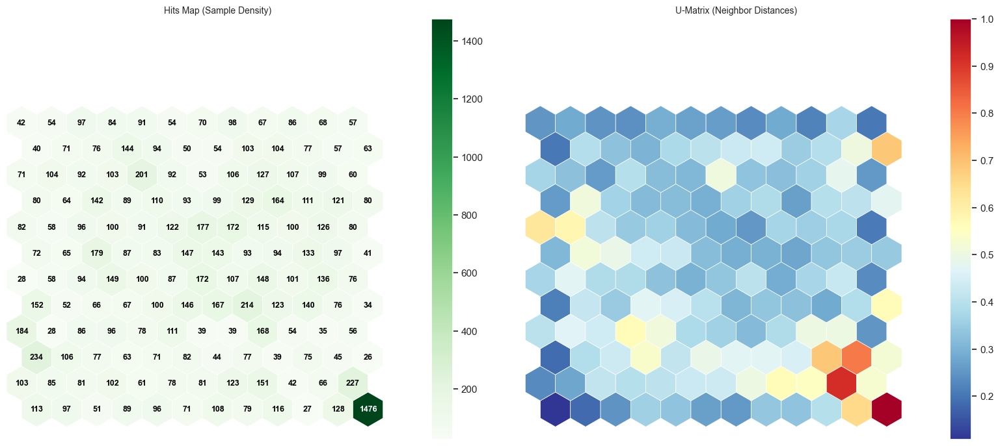

In [150]:
plot_som_diagnostics(som_behave, customer[features_behave].values)

Hits Map: The map highlights a massive concentration of customers in the Top-Left corner (single neuron with 1,473 samples). This corresponds to the 'Inactive/Dormant' segment identified in the component planes. The rest of the map shows a relatively even distribution, indicating that active travelers (Solo, Family, Business) are well-spread across the grid.

U-Matrix: The U-Matrix mathematically confirms the isolation of the Top-Left group. A sharp Red/Orange barrier surrounds this corner, proving that these inactive users are structurally distinct from the rest. The remainder of the map is predominantly Blue, suggesting that the differences between active segments (e.g., shifting from 'Solo' to 'Family' travel) are gradual and fluid.

##### 7.2.6.2 SOMS with K-means

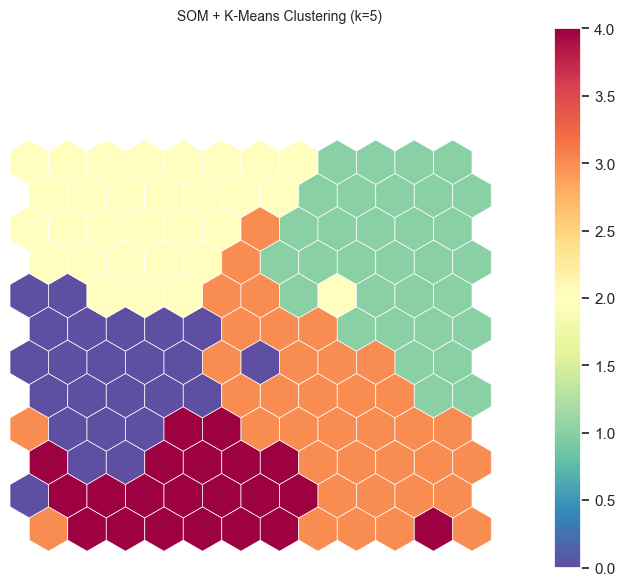

In [151]:
labels_som_kmeans_behave = run_som_kmeans(som_behave, customer[features_behave].values, n_clusters=5)

Orange: The algorithm successfully isolated the Top-Left corner into a distinct cluster. This matches the 'Inactive' pocket seen in the feature maps (low frequency, low recency), confirming that these disconnected users are structurally unique.

Purple: The Bottom-Left region forms a massive, contiguous block. This corresponds to the 'Golden Corner' (High Frequency + Positive Trend), effectively grouping the most valuable, active, and growing solo travelers into a single targetable segment.

The Social Divide (Right Side): The Right side of the map (Green/Red) is clearly separated from the Left. This confirms the structural split between Solo Travelers (Left) and Family/Group Travelers (Right), suggesting that marketing content should be visually differentiated based on this vertical boundary.

##### 7.2.6.3 SOMS with Hierarchical clustering

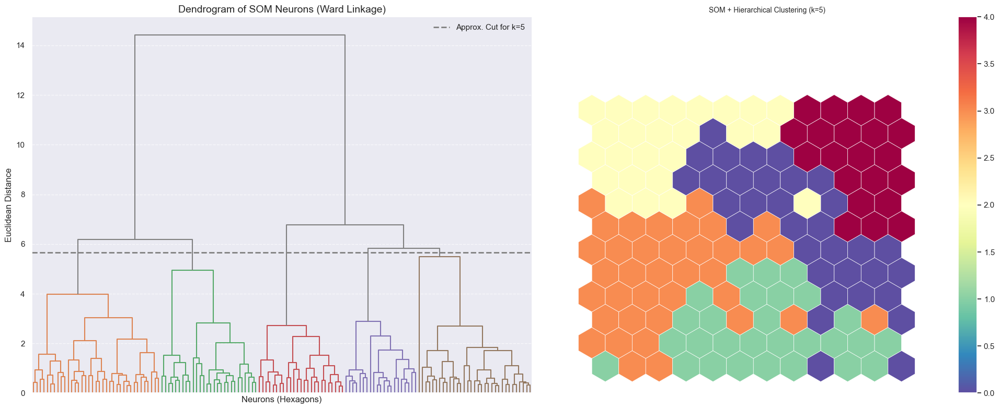

In [152]:
labels_som_hc_behave = run_som_hierarchical(som_behave, customer[features_behave].values, n_clusters=5)

Yellow: The algorithm confirms the mathematical isolation of the Top-Left corner. This specific group of inactive users is so distinct that it forms its own tiny branch in the dendrogram, separate from all active users.

Green: The Bottom-Left region forms a solid, cohesive cluster. This aligns with the high-frequency/positive-trend behavior, representing the most consistent business/solo travelers.

Family/Leisure Stratification: Unlike K-Means, which treated the right side as a large block, Hierarchical Clustering creates a vertical gradient (Purple --> Orange --> Red). This suggests that the 'Family/Leisure' market is not monolithic but consists of three distinct tiers—likely differentiated by travel distance or flight frequency.

#### Behavioral segmentation results

In [153]:
results_behave = []
# Ensure we are using the correct data
X_behave = customer[features_behave].copy()

# =========================================================
# 1. K-MEANS 
# =========================================================
metrics_km_hc = get_model_metrics(
    df=X_behave,
    labels=behave_labels, 
    model_name="K-Means", 
    perspective="Behavioral"
)
results_behave.append(metrics_km_hc)

# =========================================================
# 2. DBSCAN
# =========================================================
#metrics_dbscan = get_model_metrics(
#    df=X_behave,
#    labels=labels_dbscan_behave,
#    model_name="DBSCAN",
#    perspective="Behavioral"
#)
#results_behave.append(metrics_dbscan)
# =========================================================
# 3. HDBSCAN
# =========================================================
metrics_hdb = get_model_metrics(
    df=X_behave,
    labels=labels_hdb_behave,
    model_name="HDBSCAN",
    perspective="Behavioral"
)
results_behave.append(metrics_hdb)
# =========================================================
# 4. GAUSSIAN MIXTURE (GMM)
# =========================================================
labels_behave_gmm = gmm_model_behave.predict(X_behave)

metrics_gmm = get_model_metrics(
    df=X_behave,
    labels=labels_behave_gmm,
    model_name="Gaussian Mixture",
    perspective="Behavioral"
)
results_behave.append(metrics_gmm)

# =========================================================
# 5. SOM + K-MEANS
# =========================================================

metrics_som_km = get_model_metrics(
    df=X_behave,
    labels=np.array(labels_som_kmeans_behave),
    model_name="SOM + K-Means",
    perspective="Behavioral"
)
results_behave.append(metrics_som_km)

# =========================================================
# 6. SOM + HIERARCHICAL
# =========================================================

metrics_som_hc = get_model_metrics(
    df=X_behave,
    labels=np.array(labels_som_hc_behave),
    model_name="SOM + Hierarchical",
    perspective="Behavioral"
)
results_behave.append(metrics_som_hc)

In [154]:
df_compare_behave = pd.DataFrame(results_behave)
df_compare_behave = df_compare_behave.sort_values(by='R2 Score', ascending=False)
df_compare_behave

,Perspective,Model Name,Num_Clusters,R2 Score,Silhouette Score,Davies-Bouldin,Calinski-Harabasz
0,Behavioral,K-Means,5,0.7676,0.317,1.012,12387.0
2,Behavioral,Gaussian Mixture,4,0.5427,0.134,1.996,5935.5
1,Behavioral,HDBSCAN,2,0.4729,0.629,0.300,13446.8
3,Behavioral,SOM + K-Means,5,0.4416,0.115,1.410,2965.9
4,Behavioral,SOM + Hierarchical,5,0.4007,0.087,1.699,2507.4


### 7.3 Seasonality Segmentation Perspective

In [155]:
features_season = clustering_perspectives['Seasonality_Segmentation']

#### 7.3.1 K-means with Hierarchical clustering

In [156]:
df_season_kmeans_hc = customer[features_season].copy()
df_season_kmeans_hc

,Fall_Ratio,Spring_Ratio,Summer_Ratio,Winter_Ratio,Seasonality_Index
9494,-1.360274,-1.418826,-1.660585,-1.278877,-1.469139
10877,-1.360274,-1.418826,-1.660585,-1.278877,-1.469139
427,-1.360274,-1.418826,-1.660585,-1.278877,-1.469139
7985,-1.360274,-1.418826,-1.660585,-1.278877,-1.469139
11944,-0.434689,1.755045,-0.280373,-0.200695,0.013929
...,...,...,...,...,...
7976,0.710787,0.226213,-0.332275,-0.039116,-0.617447
13107,0.812549,0.988324,-1.052771,-0.052293,-0.063100
6173,0.177416,0.947524,-0.816399,0.390640,-0.249739
11788,0.769624,-0.882410,0.695844,-0.210650,-0.244417


In [157]:
df_season_sample = df_season_kmeans_hc.sample(n=5000, random_state=42)

In [158]:
r2_scores_season = {}

df_season_sample = df_season_kmeans_hc.sample(n=5000, random_state=42)
r2_scores_season['kmeans'] = func.get_r2_scores(df_season_sample, df_season_kmeans_hc.columns.tolist(), kmeans)

for linkage in ['complete', 'average', 'single', 'ward']: # 4 different versions of HC
    r2_scores_season[linkage] = func.get_r2_scores(
        df_season_sample,                 # data
        df_season_kmeans_hc.columns.tolist(),   # features of perspective
        # use HClust, changing the linkage at each iteration
        hierarchical.set_params(linkage=linkage)
    )

In [159]:
r2_scores_season = pd.DataFrame(r2_scores)
r2_scores_season

,kmeans,complete,average,single,ward
1,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.349689,0.280505,0.349689,0.349689,0.349689
3,0.600100,0.433073,0.351016,0.350317,0.571737
4,0.670274,0.605132,0.533458,0.350760,0.648062
5,0.737162,0.622148,0.591734,0.351228,0.709280
6,0.769714,0.688459,0.592044,0.351614,0.746888
7,0.791570,0.704848,0.593350,0.351878,0.769902
8,0.811216,0.709522,0.610775,0.352240,0.790723


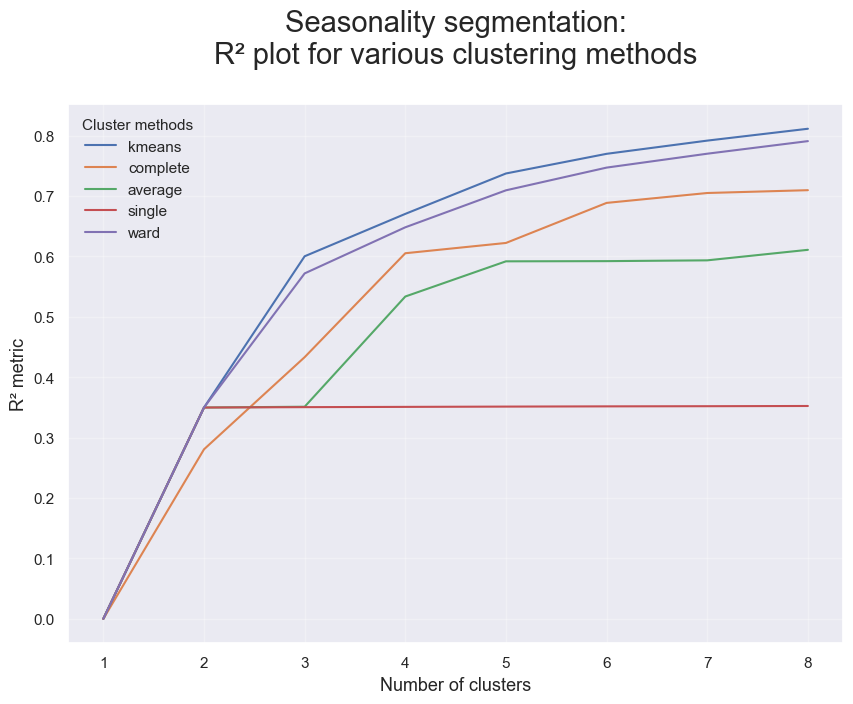

In [160]:
r2_scores_df_season = pd.DataFrame(r2_scores)

r2_scores_df_season.plot.line(figsize=(10,7))

plt.title("Seasonality segmentation:\nR² plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()

Again, when the topic of we are talking about is comparison of clustering algorithms, K-Means outperforms other methods, achieving the highest explained variance across all k values. Regarding the number of clusters, we identify a elbow at k=3 one more time. 

In [161]:
df_sample_season_viz = df_season_kmeans_hc.sample(n=3000, random_state=42)

For n_clusters = 2, the average score is: 0.5328
For n_clusters = 3, the average score is: 0.5324
For n_clusters = 4, the average score is: 0.3143
For n_clusters = 5, the average score is: 0.3236
For n_clusters = 6, the average score is: 0.3147
For n_clusters = 7, the average score is: 0.2894
For n_clusters = 8, the average score is: 0.2878
For n_clusters = 9, the average score is: 0.2894
For n_clusters = 10, the average score is: 0.2920


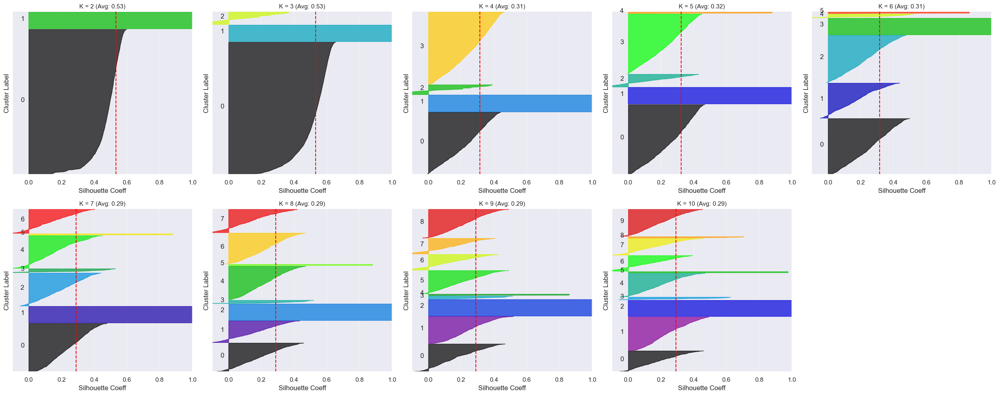

In [162]:
func.visualize_silhouette_graf(df_sample_season_viz, range_clusters=range(2, 11))

In [163]:
kmeans_season = KMeans(
    n_clusters=4,
    init='k-means++',
    n_init=500,
    random_state=42
)

In [164]:
season_labels = kmeans_season.fit_predict(df_season_kmeans_hc)
season_labels

array([2, 2, 2, ..., 0, 1, 2], shape=(15008,), dtype=int32)

In [165]:
print(pd.Series(season_labels).value_counts().sort_index())

0    7228
1    5615
2    1473
3     692
Name: count, dtype: int64


With k=3, the distribution showed a large peak in one of the clusters, which didn’t make sense. With k=4, the distribution was more balanced. Considering the graph of the number of flights per month and per year, there were two major peaks that likely correspond to the two largest clusters, while the other clusters represented smaller seasonal peaks.

#### 7.3.2 DBSCAN

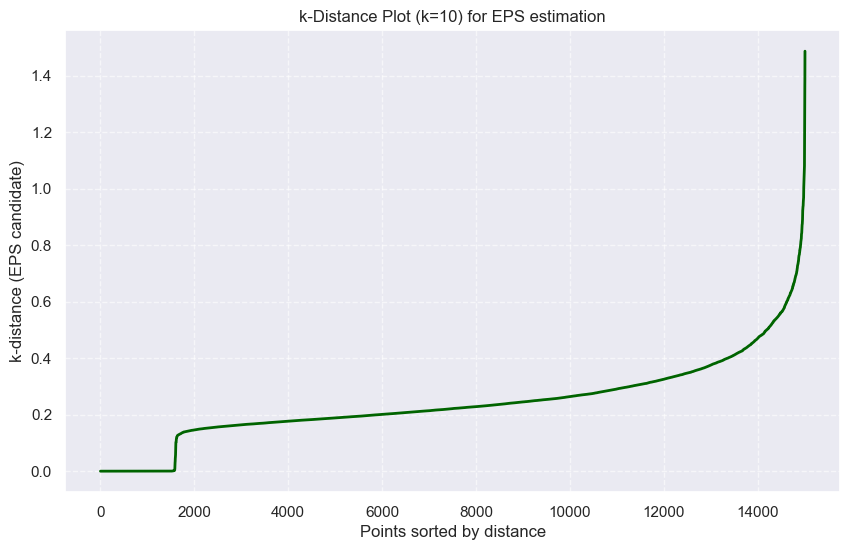

In [166]:
k_season = plot_k_distance(customer, features_season)

In [167]:
labels_season, n_clus_season, dist_season = get_dbscan(
    customer, 
    features_season, 
    eps=0.4,
    min_samples=9
)

dbscan_results['Season'] = {'Clusters': n_clus_season, 'Distribution': dist_season}

Clusters found: 9
Noise: 758 customers (5.05%)
Cluster Distribution:
-1      758
 0     1473
 1    12358
 2       86
 3       31
 4      210
 5       53
 6       13
 7       17
 8        9
Name: count, dtype: int64
R2 Score: 0.5226


DBSCAN shows us again that it is not a good option for this dataset, because of a large pick in one cluster, and a poor distribution of the other clusters.

#### 7.3.3 HDBSCAN

In [168]:
labels_hdb_season, n_hdb_season, dist_hdb_season = func.get_hdbscan(
    customer, 
    features_season, 
    min_cluster_size=200, 
    min_samples=9         
)

c:\Users\alexc\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\sklearn\cluster\_hdbscan\hdbscan.py:722: FutureWarning:

The default value of `copy` will change from False to True in 1.10. Explicitly set a value for `copy` to silence this warning.



Clusters found: 3
Noise: 209 customers (1.39%)
Cluster distribution:
-1      209
 0     1473
 1    12959
 2      367
Name: count, dtype: int64
R2 Score: 0.4403


HDBSCAN goes in the same way of the DBSCAN, shows us again that it is not a good option for this dataset, because of a large pick in one cluster, and a poor distribution of the other clusters.

#### 7.3.4 Mean-shift

In [169]:
df_season_meanshift= customer.copy()
df_season_meanshift['Cluster_MS_season'] = get_meanshift(customer, features_season)

Used quantile 0.25 -> 4 clusters found.


In [170]:
print(df_season_meanshift.groupby('Cluster_MS_season')[features_season].mean())
print("\nCluster Sizes:")
print(df_season_meanshift.groupby('Cluster_MS_season').size())

                   Fall_Ratio  Spring_Ratio  Summer_Ratio  Winter_Ratio  \
Cluster_MS_season                                                         
0                    0.059061      0.210136      0.283665      0.017095   
1                   -1.360274     -1.418826     -1.660585     -1.278877   
2                    3.225712     -1.407216     -1.448851     -0.111739   
3                   -0.576804     -1.414078     -1.652724      3.975444   

                   Seasonality_Index  
Cluster_MS_season                     
0                          -0.129779  
1                          -1.469139  
2                           2.113138  
3                           3.477844  

Cluster Sizes:
Cluster_MS_season
0    13094
1     1473
2      293
3      148
dtype: int64


Unlike the previous perspectives, Mean Shift successfully identified multiple density peaks in the seasonal data, converging on k=5 clusters. This suggests that seasonal preferences (e.g., Winter vs. Fall) create stronger natural groupings than financial or behavioral metrics.

#### 7.3.5 Gaussian Mixture Model

In [171]:
df_season_gaussian_mix_model= customer.copy()

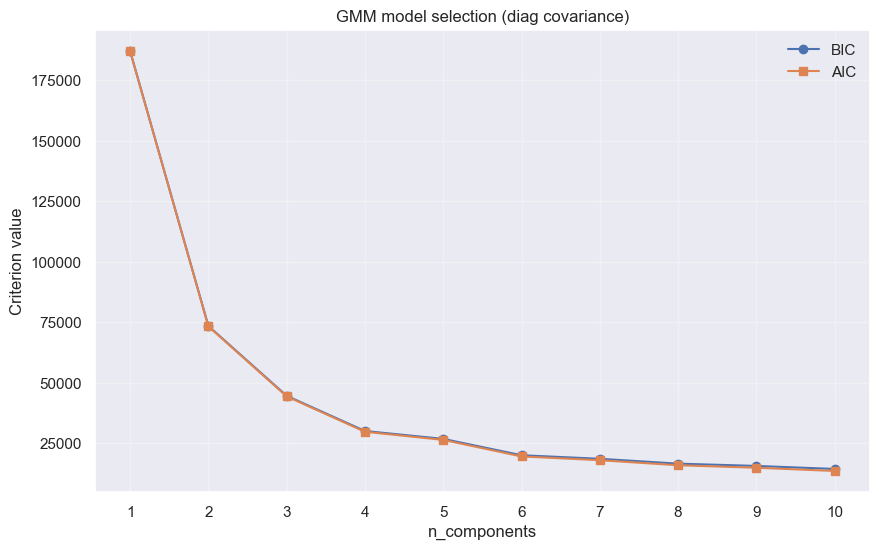

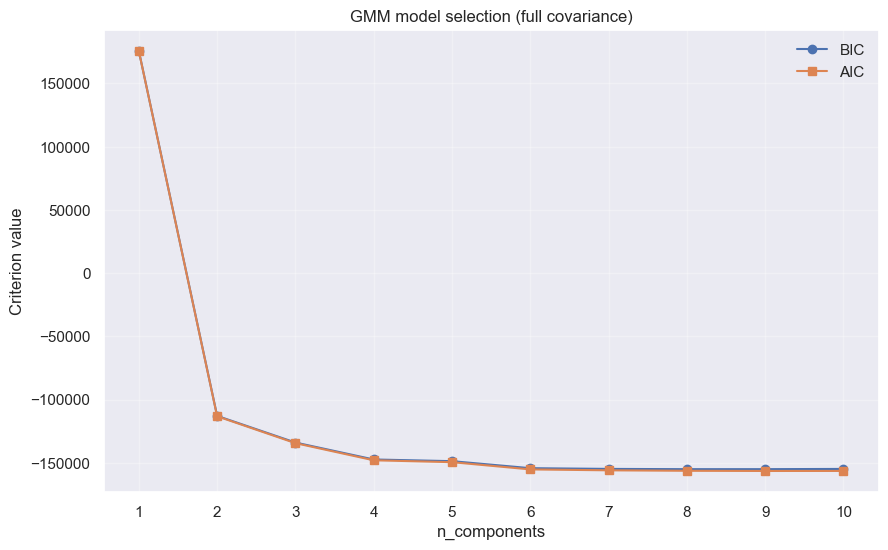

In [172]:
get_n_components(df_season_gaussian_mix_model, features_season)

The **Full Covariance** structure is strictly superior to the Diagonal structure for this dataset.
* **Magnitude of Error:** The Full Covariance model achieves exceptionally low criterion scores, dropping well below **-145,000**. In contrast, the Diagonal model performs significantly worse, with its best scores remaining positive (around **+12,000** to **+15,000**).
* **Implication:** The massive difference in scores confirms that the features in this dataset are highly correlated. The Diagonal model's assumption of feature independence is completely invalid here, necessitating the more flexible Full Covariance approach.

The Full Covariance plot exhibits a clear "Elbow" pattern that supports the selection of 4 clusters:
* **Precipitous Drop ($K=1$ to $K=3$):** The AIC/BIC values plummet vertically in the initial steps, indicating that the first few components capture the vast majority of the data's variance.
* **The "Elbow" ($K=4$):** The curve shows a distinct inflection point at **4 components**. The score drops from roughly -135,000 at $K=3$ to nearly **-148,000** at $K=4$. After this point, the curve flattens significantly.
* **Diminishing Returns:** Beyond $K=4$, the improvement becomes marginal. From $K=5$ to $K=10$, the values stabilize around -150,000, suggesting that adding more complexity beyond the 4th component yields minimal statistical gain relative to the risk of overfitting.

**Decision:** A **Full Covariance GMM with 4 components** is selected as the optimal model.

In [173]:
gmm_model_season, df_concat_season = fit_gmm_segmentation(df_season_gaussian_mix_model, features_season, k=4, rsq_func=get_rsq)

GMM (full, k=4) R² score: 0.4617

Cluster Sizes:
gmm_labels
0    8714
1    1473
2    3921
3     900
Name: count, dtype: int64



--- GMM Probability Analysis ---
Threshold: 80%
Clear assignments: 12,034 customers
Uncertain assignments: 2,974 customers (19.8%)


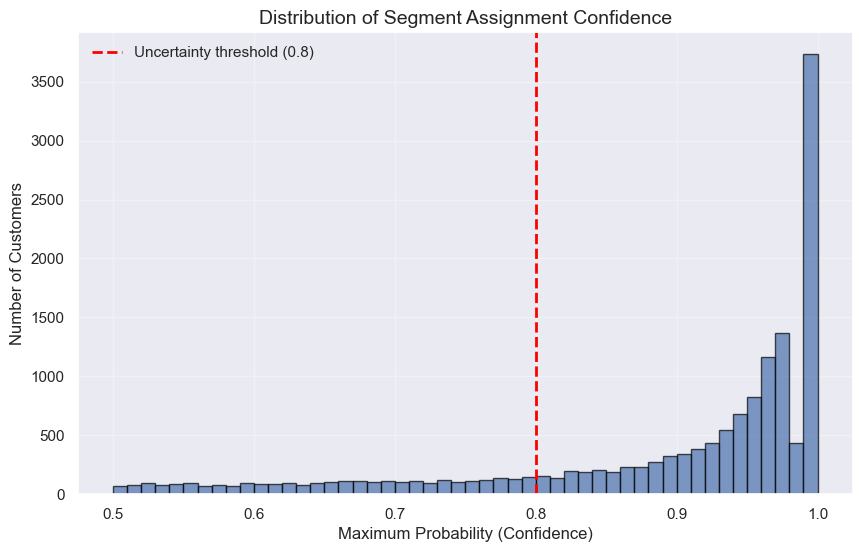

In [174]:
analyze_gmm_uncertainty(gmm_model_season, df_season_gaussian_mix_model, features_season, threshold=0.8)

**Uncertainty Analysis**
* **Threshold:** A strict confidence threshold of **80%** was applied to test the robustness of the clusters.
* **Results:** The model successfully classified **80.2%** of customers (12,034) with high confidence. The remaining **19.8%** lie in the "boundary" regions between clusters.

#### 7.3.6 SOM

##### 7.3.6.1 Component planes and U-matrix

In [175]:
grid_size = 12
features_to_use = features_season

# Inicializar e Treinar
som_season = MiniSom(x=grid_size, y=grid_size, input_len=len(features_to_use),
                  topology='hexagonal', sigma=1.0, learning_rate=0.5,
                  random_seed=42)

som_season.random_weights_init(customer[features_to_use].values)
som_season.train_batch(customer[features_to_use].values, 20000, verbose=True)

weights_season = som_season.get_weights()

 [ 20000 / 20000 ] 100% - 0:00:00 left 
 quantization error: 0.3975310797132208


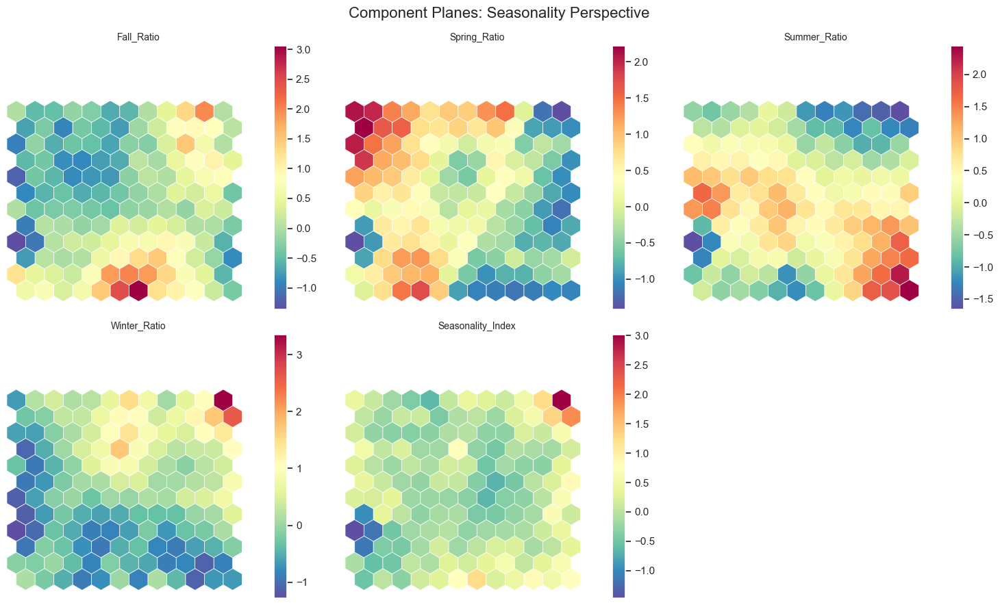

In [176]:
n_plots = len(features_season)
n_cols = 3 
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 9))
axes = axes.flatten()

# 4. Loop through features and plot
for i, feature_name in enumerate(features_season):
    # Extract weights for this specific feature
    feature_weights = weights_season[:, :, i]
    
    # Plot the hexagon map
    # Using Spectral_r: Red = High Values, Blue = Low Values
    plot_hexagons(feature_weights, som_season, axes[i], label=feature_name, cmap=cm.Spectral_r)

# 5. Hide the empty subplot (since we have 5 plots for 6 spaces)
for j in range(n_plots, len(axes)):
    axes[j].axis('off')

plt.suptitle("Component Planes: Seasonality Perspective", fontsize=16)
plt.tight_layout()
plt.show()

The map displays a clear geometric separation of preferences. Winter Travelers are strongly clustered in the Bottom-Left corner, Summer Travelers dominate the Bottom-Right, and Spring Travelers are concentrated in the Top-Center.

The central region of the grid shows moderate to low values across all seasonal ratios. This represents the 'Year-Round' traveler who does not exhibit a strong preference for a single season.

The Seasonality_Index plane highlights that the strongest seasonal habits (Dark Red nodes) are found in the Winter (Bottom-Left) and Fall (Bottom-Center) regions. This suggests that off-peak travelers are more likely to be 'Specialists' (flying only in that season) compared to Summer travelers, who may overlap with other periods.

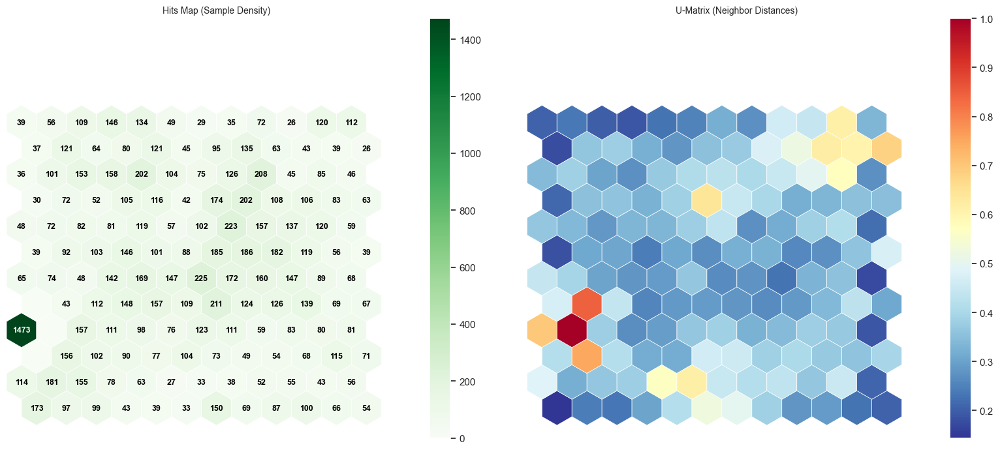

In [177]:
plot_som_diagnostics(som_season, customer[features_season].values)

Hits Map: Unlike the financial models, the sample distribution here is relatively balanced across the grid, indicating that no single 'season' dominates the entire customer base. However, the Bottom-Right corner contains a massive outlier (1,473 samples). This exact number matches the 'Inactive' segment from the Behavioral model, confirming that non-flyers are grouped here due to having null seasonal ratios.

U-Matrix: The U-Matrix effectively maps the boundary between 'Generalists' and 'Specialists'. The center is Blue, indicating smooth transitions between customers who fly in multiple seasons. In contrast, Red/Orange barriers clearly wall off the corners—specifically isolating the Winter Specialists (Bottom-Left) and the Inactive Group (Bottom-Right)—proving that these behaviors are structurally disconnected from the rest.

##### 7.3.6.2 SOMS with K-means

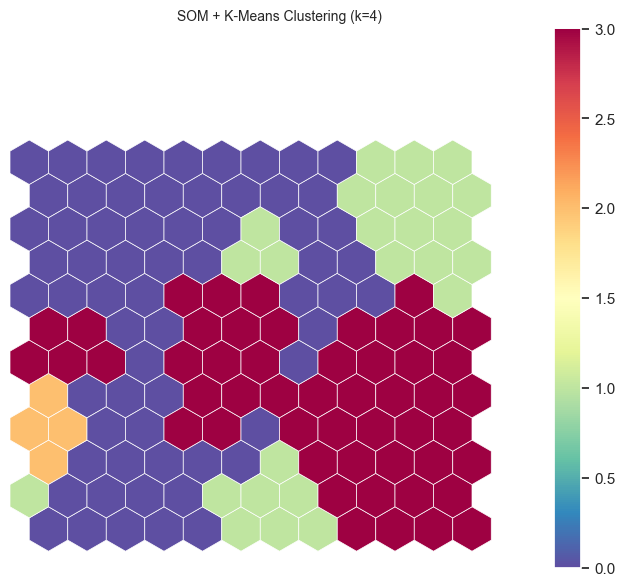

In [178]:
labels_som_kmeans_season = run_som_kmeans(som_season, customer[features_season].values, n_clusters=4)

Red: A compact, highly defined cluster occupies the Bottom-Left corner. This group corresponds perfectly to the high Winter_Ratio seen in the component planes, representing customers who exclusively travel during the cold season (ski/holidays).

Purple: The Right Side of the map is dominated by a large, contiguous cluster. This region aligns with high Summer_Ratio values, confirming that summer vacationers form the largest distinct seasonal block.

Green: The Top/Center region (Green) covers the areas with low seasonality indices. This represents the 'Year-Round' travelers who do not exhibit strong seasonal bias.

Orange: The Bottom-Center cluster appears to capture the transitional travelers (Fall/Spring) and potentially the inactive outlier group, acting as a bridge between the distinct seasonal extremes.

##### 7.3.6.3 SOMS with Hierarchical clustering

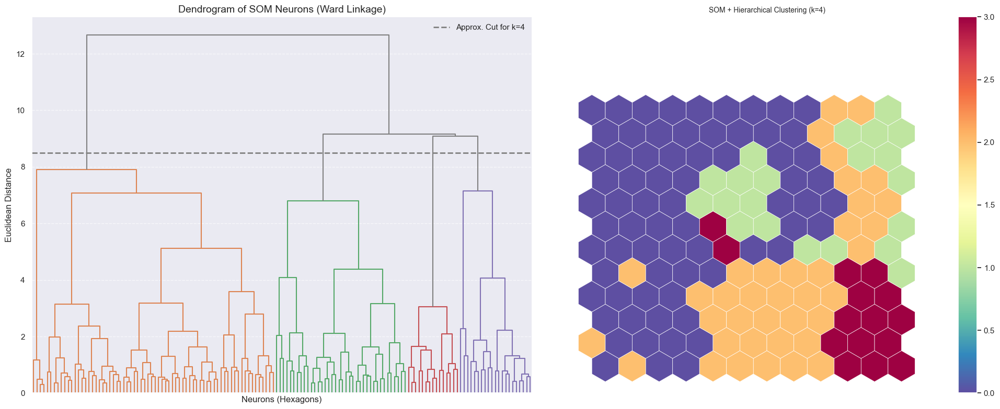

In [179]:
labels_som_hc_season = run_som_hierarchical(som_season, customer[features_season].values, n_clusters=4)

Purple: The algorithm identifies a massive, vertical block covering the entire Right side. This confirms that 'Summer Travelers' are the most distinct and cohesive seasonal group, showing very high stability across algorithms.

Green: The Bottom-Left corner is clearly isolated, though slightly smaller than in the K-Means solution. This reaffirms 'Winter Sports/Holidays' as a tight, specialized niche that doesn't overlap with other groups.

Orange: Unlike K-Means, which split the upper area, Hierarchical Clustering merges the Top and Left regions into a single giant cluster. This suggests that statistically, 'Spring Travelers' and 'Generalists' are very similar and might be treated as a single 'Off-Peak' segment.

Red: The fourth cluster appears as disconnected islands in the center and bottom. This likely captures the high-variance outliers (e.g., specific Fall travelers or the Inactive group) that don't fit the smoother gradients of the main seasons

#### Seasonality Segmentation Results

In [180]:
results_season = []
# Ensure we are using the correct data
X_season = customer[features_season].copy()

# =========================================================
# 1. K-MEANS 
# =========================================================
metrics_km_hc = get_model_metrics(
    df=X_season,
    labels=season_labels, 
    model_name="K-Means", 
    perspective="Seasonality"
)
results_season.append(metrics_km_hc)

# =========================================================
# 2. DBSCAN
# =========================================================
metrics_dbscan = get_model_metrics(
    df=X_season,
    labels=labels_season, 
    model_name="DBSCAN",
    perspective="Seasonality"
)
results_season.append(metrics_dbscan)

# =========================================================
# 3. HDBSCAN
# =========================================================
metrics_hdb = get_model_metrics(
    df=X_season,
    labels=labels_hdb_season,
    model_name="HDBSCAN",
    perspective="Seasonality"
)
results_season.append(metrics_hdb)
# =========================================================
# 4. GAUSSIAN MIXTURE (GMM)
# =========================================================
labels_season_gmm = gmm_model_season.predict(X_season)

metrics_gmm = get_model_metrics(
    df=X_season,
    labels=labels_season_gmm,
    model_name="Gaussian Mixture",
    perspective="Seasonality"
)
results_season.append(metrics_gmm)

# =========================================================
# 5. SOM + K-MEANS
# =========================================================

metrics_som_km = get_model_metrics(
    df=X_season,
    labels=np.array(labels_som_kmeans_season),
    model_name="SOM + K-Means",
    perspective="Seasonality"
)
results_season.append(metrics_som_km)

# =========================================================
# 6. SOM + HIERARCHICAL
# =========================================================

metrics_som_hc = get_model_metrics(
    df=X_season,
    labels=np.array(labels_som_hc_season),
    model_name="SOM + Hierarchical",
    perspective="Seasonality"
)
results_season.append(metrics_som_hc)


In [181]:
df_compare_season = pd.DataFrame(results_season)
df_compare_season = df_compare_season.sort_values(by='R2 Score', ascending=False)
df_compare_season

,Perspective,Model Name,Num_Clusters,R2 Score,Silhouette Score,Davies-Bouldin,Calinski-Harabasz
0,Seasonality,K-Means,4,0.5703,0.309,1.134,6636.5
1,Seasonality,DBSCAN,9,0.5661,0.431,0.450,2322.5
4,Seasonality,SOM + K-Means,4,0.5462,0.291,1.175,6020.3
3,Seasonality,Gaussian Mixture,4,0.4617,0.257,2.474,4289.1
2,Seasonality,HDBSCAN,3,0.4515,0.567,0.748,6090.0
5,Seasonality,SOM + Hierarchical,4,0.2517,0.121,1.656,1682.4


### 7.4 Final Clustering Solution

In [182]:
customer['value_cluster'] = value_labels

In [183]:
customer['behavioral_cluster'] = behave_labels

In [184]:
customer['seasonality_cluster'] = season_labels

In [185]:
print(f"Value clusters: {customer['value_cluster'].nunique()}")
print(f"Behavioral clusters: {customer['behavioral_cluster'].nunique()}")
print(f"Seasonality clusters: {customer['seasonality_cluster'].nunique()}")

Value clusters: 5
Behavioral clusters: 5
Seasonality clusters: 4


In [186]:
crosstab_result = pd.crosstab(
    index=[customer['value_cluster'], customer['behavioral_cluster']],
    columns=customer['seasonality_cluster']
)
crosstab_result

seasonality_cluster                  0    1    2    3
value_cluster behavioral_cluster                     
0             0                    120   69    0    0
              1                      0    0  223    0
              2                    209  277    0   39
              3                    136  133    0   14
              4                    145  139    0   28
1             0                   1013  554    0    0
              1                      0    0  412    0
              2                    192  163    0    1
              3                    790  535    0    0
              4                    563  367    0    4
2             0                     41   18    0    0
              1                      0    1  587   53
              2                    328  579    0  146
              3                     93  121    0  218
              4                    149  189    0  155
3             0                    489  260    0    3
              1                      0    0  122    0
              2                     90   78    0    0
              3                    383  276    0    0
              4                    272  167    0    1
4             0                    771  402    0    0
              1                      0    0  129    0
              2                    272  335    0   21
              3                    674  532    0    3
              4                    498  420    0    6

reavaliar os graficos seguintes apos o features selection

In [187]:
#cols_value = df_value.columns.tolist() 
#temp_df = customer[cols_value].copy()
#temp_df['Cluster'] = customer['value_cluster']

# Agrupar e calcular média
#profile_value = temp_df.groupby('Cluster').mean().T

# Desenhar
#fig, ax = plt.subplots(figsize=(8, 6))
#sns.heatmap(profile_value, center=0.5, annot=True, cmap="RdBu_r", fmt=".2f", ax=ax)
#ax.set_title("Perfilagem: Value Clusters (K=4)")
#plt.show()

In [188]:
#cols_behave = df_behave.columns.tolist()
#temp_df_b = customer[cols_behave].copy()
#temp_df_b['Cluster'] = customer['behavioral_cluster']

# Agrupar e calcular média
#profile_behave = temp_df_b.groupby('Cluster').mean().T

# Desenhar
#fig, ax = plt.subplots(figsize=(8, 8)) # Mais alto porque deve ter mais variáveis
#sns.heatmap(profile_behave, center=0.5, annot=True, cmap="RdBu_r", fmt=".2f", ax=ax)
#ax.set_title("Perfilagem: Behavioral Clusters (K=4)")
#plt.show()

### 7.5 Merge clusters using Hierarchical Clustering

In [189]:
total_features = clustering_perspectives['Value_Segmentation'] + clustering_perspectives['Behavioral_Segmentation'] + clustering_perspectives['Seasonality_Segmentation']
# Centroids of the concatenated cluster labels
customer_centroids = customer.groupby(['value_cluster', 'behavioral_cluster', 'seasonality_cluster'])[total_features].mean()
customer_centroids

CLV    Income  \
value_cluster behavioral_cluster seasonality_cluster                       
0             0                  0                   -0.466947 -1.708342   
                                 1                   -0.449580 -1.708342   
              1                  2                   -2.099932 -1.708342   
              2                  0                   -1.273552 -1.708342   
                                 1                   -1.344022 -1.708342   
                                 3                   -1.589571 -1.708342   
              3                  0                   -0.541361 -1.708342   
                                 1                   -0.739763 -1.708342   
                                 3                   -2.035579 -1.708342   
              4                  0                   -0.837304 -1.708342   
                                 1                   -1.069892 -1.708342   
                                 3                   -2.048216 -1.708342   
1             0                  0                    1.042640  0.582155   
                                 1                    1.079803  0.588742   
              1                  2                   -0.415771  0.592986   
              2                  0                    0.944330  0.583286   
                                 1                    0.981492  0.597737   
                                 3                    0.520664  0.634002   
              3                  0                    1.022871  0.588212   
                                 1                    1.008899  0.586106   
              4                  0                    0.888886  0.588158   
                                 1                    0.928176  0.595450   
                                 3                    0.461199  0.559023   
2             0                  0                   -0.377334  0.444781   
                                 1                   -0.225241  0.479291   
              1                  1                   -0.547343  0.737894   
                                 2                   -1.310611  0.538466   
                                 3                   -1.327851  0.601752   
              2                  0                   -0.714144  0.538300   
                                 1                   -0.751546  0.557575   
                                 3                   -0.972485  0.560295   
              3                  0                   -0.520677  0.497672   
                                 1                   -0.743940  0.521928   
                                 3                   -1.302459  0.570754   
              4                  0                   -0.685442  0.536762   
                                 1                   -0.782344  0.551443   
                                 3                   -1.204249  0.568726   
3             0                  0                    0.177947 -1.708342   
                                 1                    0.153992 -1.708342   
                                 3                   -0.318406 -1.708342   
              1                  2                   -1.404195 -1.708342   
              2                  0                   -0.004314 -1.708342   
                                 1                    0.072745 -1.708342   
              3                  0                    0.131087 -1.708342   
                                 1                    0.136534 -1.708342   
              4                  0                   -0.001033 -1.708342   
                                 1                    0.004271 -1.708342   
                                 3                   -0.661672 -1.708342   
4             0                  0                    0.613876  0.574240   
                                 1                    0.661339  0.580488   
              1                  2                   -0.353987  0.687722   
              2                

In [190]:
print(f"\nCentroids shape: {customer_centroids.shape}")


Centroids shape: (60, 14)


In [191]:
# Fit hierarchical clustering with distance tracking
hclust = AgglomerativeClustering(
    linkage='ward',
    metric='euclidean',
    distance_threshold=0,
    n_clusters=None
)
hclust_labels = hclust.fit_predict(customer_centroids)

# Build linkage matrix for dendrogram
# (Adapted from scikit-learn documentation)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

for i, merge in enumerate(hclust.children_):
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            current_count += 1 
        else:
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

linkage_matrix = np.column_stack([
    hclust.children_,
    hclust.distances_,
    counts
]).astype(float)

print("Linkage matrix ready for dendrogram!")

Linkage matrix ready for dendrogram!


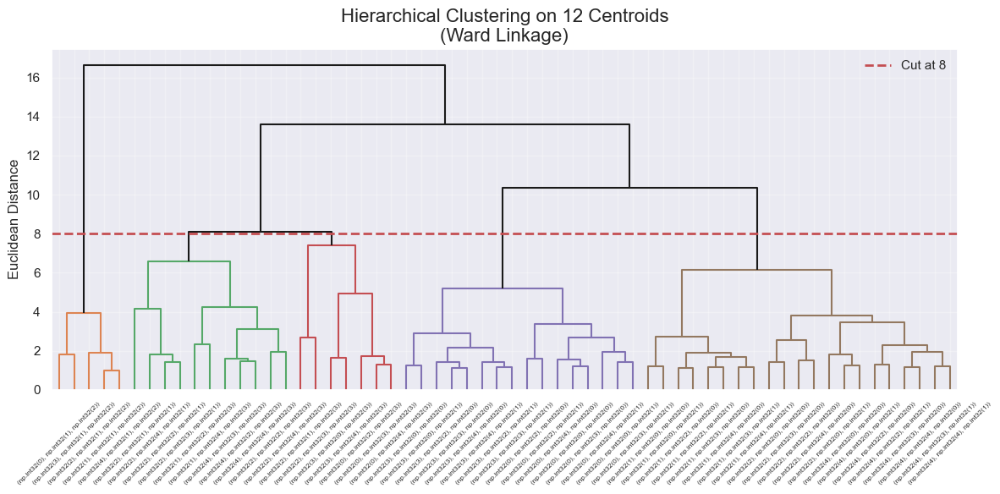

In [192]:
fig = plt.figure(figsize=(12, 6))

y_threshold = 8 # Can adjust this!

dendrogram(
    linkage_matrix,
    labels=customer_centroids.index,
    color_threshold=y_threshold,
    above_threshold_color='k'
)

plt.axhline(y=y_threshold, color='r', linestyle='--', linewidth=2, label=f'Cut at {y_threshold}')

plt.title(f'Hierarchical Clustering on 12 Centroids\n(Ward Linkage)', fontsize=16)
plt.ylabel('Euclidean Distance')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [193]:
n_final_clusters = 5 
hclust_final = AgglomerativeClustering(
    linkage='ward',
    n_clusters=n_final_clusters
)
hclust_final_labels=hclust_final.fit_predict(customer_centroids)
hclust_final_labels

array([4, 4, 3, 4, 4, 0, 4, 4, 0, 4, 4, 0, 2, 2, 3, 2, 2, 1, 2, 2, 2, 2,
       1, 2, 2, 1, 3, 0, 2, 1, 1, 2, 1, 0, 2, 1, 1, 4, 4, 0, 3, 4, 4, 4,
       4, 4, 4, 0, 2, 2, 3, 2, 2, 1, 2, 2, 1, 2, 2, 1])

In [194]:
customer_centroids['merged_labels'] = hclust_final_labels
customer_centroids

CLV    Income  \
value_cluster behavioral_cluster seasonality_cluster                       
0             0                  0                   -0.466947 -1.708342   
                                 1                   -0.449580 -1.708342   
              1                  2                   -2.099932 -1.708342   
              2                  0                   -1.273552 -1.708342   
                                 1                   -1.344022 -1.708342   
                                 3                   -1.589571 -1.708342   
              3                  0                   -0.541361 -1.708342   
                                 1                   -0.739763 -1.708342   
                                 3                   -2.035579 -1.708342   
              4                  0                   -0.837304 -1.708342   
                                 1                   -1.069892 -1.708342   
                                 3                   -2.048216 -1.708342   
1             0                  0                    1.042640  0.582155   
                                 1                    1.079803  0.588742   
              1                  2                   -0.415771  0.592986   
              2                  0                    0.944330  0.583286   
                                 1                    0.981492  0.597737   
                                 3                    0.520664  0.634002   
              3                  0                    1.022871  0.588212   
                                 1                    1.008899  0.586106   
              4                  0                    0.888886  0.588158   
                                 1                    0.928176  0.595450   
                                 3                    0.461199  0.559023   
2             0                  0                   -0.377334  0.444781   
                                 1                   -0.225241  0.479291   
              1                  1                   -0.547343  0.737894   
                                 2                   -1.310611  0.538466   
                                 3                   -1.327851  0.601752   
              2                  0                   -0.714144  0.538300   
                                 1                   -0.751546  0.557575   
                                 3                   -0.972485  0.560295   
              3                  0                   -0.520677  0.497672   
                                 1                   -0.743940  0.521928   
                                 3                   -1.302459  0.570754   
              4                  0                   -0.685442  0.536762   
                                 1                   -0.782344  0.551443   
                                 3                   -1.204249  0.568726   
3             0                  0                    0.177947 -1.708342   
                                 1                    0.153992 -1.708342   
                                 3                   -0.318406 -1.708342   
              1                  2                   -1.404195 -1.708342   
              2                  0                   -0.004314 -1.708342   
                                 1                    0.072745 -1.708342   
              3                  0                    0.131087 -1.708342   
                                 1                    0.136534 -1.708342   
              4                  0                   -0.001033 -1.708342   
                                 1                    0.004271 -1.708342   
                                 3                   -0.661672 -1.708342   
4             0                  0                    0.613876  0.574240   
                                 1                    0.661339  0.580488   
              1                  2                   -0.353987  0.687722   
              2                

In [195]:
cluster_mapper = customer_centroids['merged_labels'].to_dict()
cluster_mapper  

{(0, 0, 0): 4,
 (0, 0, 1): 4,
 (0, 1, 2): 3,
 (0, 2, 0): 4,
 (0, 2, 1): 4,
 (0, 2, 3): 0,
 (0, 3, 0): 4,
 (0, 3, 1): 4,
 (0, 3, 3): 0,
 (0, 4, 0): 4,
 (0, 4, 1): 4,
 (0, 4, 3): 0,
 (1, 0, 0): 2,
 (1, 0, 1): 2,
 (1, 1, 2): 3,
 (1, 2, 0): 2,
 (1, 2, 1): 2,
 (1, 2, 3): 1,
 (1, 3, 0): 2,
 (1, 3, 1): 2,
 (1, 4, 0): 2,
 (1, 4, 1): 2,
 (1, 4, 3): 1,
 (2, 0, 0): 2,
 (2, 0, 1): 2,
 (2, 1, 1): 1,
 (2, 1, 2): 3,
 (2, 1, 3): 0,
 (2, 2, 0): 2,
 (2, 2, 1): 1,
 (2, 2, 3): 1,
 (2, 3, 0): 2,
 (2, 3, 1): 1,
 (2, 3, 3): 0,
 (2, 4, 0): 2,
 (2, 4, 1): 1,
 (2, 4, 3): 1,
 (3, 0, 0): 4,
 (3, 0, 1): 4,
 (3, 0, 3): 0,
 (3, 1, 2): 3,
 (3, 2, 0): 4,
 (3, 2, 1): 4,
 (3, 3, 0): 4,
 (3, 3, 1): 4,
 (3, 4, 0): 4,
 (3, 4, 1): 4,
 (3, 4, 3): 0,
 (4, 0, 0): 2,
 (4, 0, 1): 2,
 (4, 1, 2): 3,
 (4, 2, 0): 2,
 (4, 2, 1): 2,
 (4, 2, 3): 1,
 (4, 3, 0): 2,
 (4, 3, 1): 2,
 (4, 3, 3): 1,
 (4, 4, 0): 2,
 (4, 4, 1): 2,
 (4, 4, 3): 1}

In [196]:
customer['merged_labels'] = customer.apply(
    lambda row: cluster_mapper[(row['value_cluster'], row['behavioral_cluster'],row['seasonality_cluster'])],
    axis=1
)
customer

,Income,CLV,NumFlights,Fall_Ratio,Spring_Ratio,Summer_Ratio,Winter_Ratio,Seasonality_Index,Flight_Trend_Slope,Companion_Ratio,...,oh_Winnipeg,R_quintile,F_quintile,M_quintile,RFM_score,RFM_segment,value_cluster,behavioral_cluster,seasonality_cluster,merged_labels
9494,0.334546,-2.321024,-2.812689,-1.360274,-1.418826,-1.660585,-1.278877,-1.469139,-0.544848,-1.696969,...,0,5,1,1,511,New customers,2,1,2,3
10877,0.705538,-0.957750,-2.812689,-1.360274,-1.418826,-1.660585,-1.278877,-1.469139,-0.544848,-1.696969,...,0,5,1,1,511,New customers,2,1,2,3
427,0.483691,-2.005796,-2.812689,-1.360274,-1.418826,-1.660585,-1.278877,-1.469139,-0.544848,-1.696969,...,0,5,1,1,511,New customers,2,1,2,3
7985,-1.708342,-2.646570,-2.812689,-1.360274,-1.418826,-1.660585,-1.278877,-1.469139,-0.544848,-1.696969,...,0,5,1,1,511,New customers,0,1,2,3
11944,0.689352,0.106175,0.325471,-0.434689,1.755045,-0.280373,-0.200695,0.013929,-0.016736,-0.927038,...,0,1,2,3,123,Others,2,3,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7976,-1.708342,0.352186,0.511584,0.710787,0.226213,-0.332275,-0.039116,-0.617447,-0.713790,-0.343360,...,0,5,4,3,543,Others,3,0,0,4
13107,0.451972,0.713888,0.500966,0.812549,0.988324,-1.052771,-0.052293,-0.063100,0.285232,-0.320547,...,0,5,3,4,534,Others,1,3,0,2
6173,0.615203,1.133051,0.500966,0.177416,0.947524,-0.816399,0.390640,-0.249739,-0.084579,-0.487386,...,0,5,3,5,535,Big spenders,1,3,0,2
11788,0.681059,1.390079,0.493789,0.769624,-0.882410,0.695844,-0.210650,-0.244417,1.556957,-0.473641,...,0,5,3,5,535,Big spenders,1,2,1,2


In [197]:
print(customer['merged_labels'].value_counts().sort_index())

merged_labels
0     356
1    1226
2    8710
3    1473
4    3243
Name: count, dtype: int64


In [198]:
# Quick distinctiveness check (R²)
r2_merged = get_rsq(customer, fs_metric_features, 'merged_labels')
print(f"\nMerged clustering R²: {r2_merged:.4f}")


Merged clustering R²: 0.4995


## 8. Profiling

#### 8.1 Feature importance and outliers classification

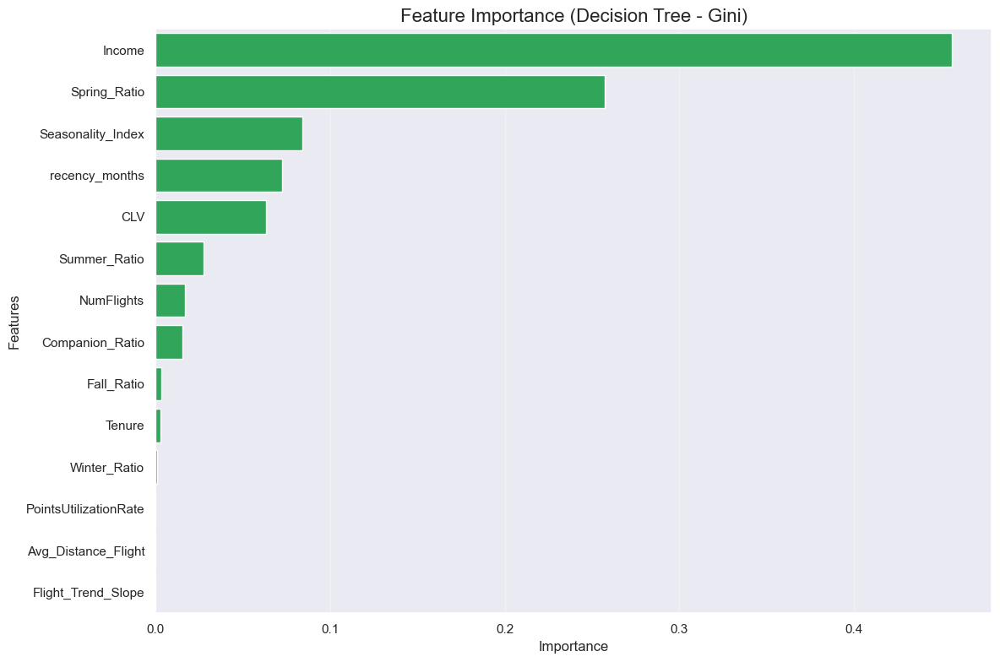

--- Top 5 drivers ---
              Feature  Importance
1              Income    0.456227
10       Spring_Ratio    0.257335
13  Seasonality_Index    0.084118
6      recency_months    0.072560
0                 CLV    0.063157

Outliers classification into clusters:
predicted_cluster
2    500
1    452
0    316
4    298
Name: count, dtype: int64


In [199]:
features = [
    'CLV', 'Income', 'PointsUtilizationRate', 'Tenure',
    'NumFlights', 'Avg_Distance_Flight', 'recency_months', 'Companion_Ratio', 'Flight_Trend_Slope',
    'Fall_Ratio', 'Spring_Ratio', 'Summer_Ratio', 'Winter_Ratio', 'Seasonality_Index'
]

X_train = customer[features]
y_train = customer['merged_labels']

X_outliers = customer_out[features]

# training decision tree
dt_model = DecisionTreeClassifier(random_state=42, max_depth=5)
dt_model.fit(X_train, y_train)


feature_importance = pd.DataFrame({
    'Feature': features,
    'Importance': dt_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance, color='#1DB954')
plt.title('Feature Importance (Decision Tree - Gini)', fontsize=16)
plt.xlabel("Importance", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.tight_layout()
plt.show()

print("--- Top 5 drivers ---")
print(feature_importance.head(5))

# classify outliers
predicted_clusters = dt_model.predict(X_outliers)
customer_out['predicted_cluster'] = predicted_clusters

print("\nOutliers classification into clusters:")
print(customer_out['predicted_cluster'].value_counts())

 The segmentation is primarily defined by two dimensions: Income (45.6%) and Spring Seasonality (25.7%). The clusters effectively separate customers based on their financial status and their specific tendency to travel in Spring. Metrics like Seasonality Index and Recency play a minor role (<10%), serving only to fine-tune the groups established by the dominant drivers.

 The majority of outliers (approx. 60%) were classified into Clusters 1 and 2. This suggests these two segments represent high-variance profiles (likely High-Net-Worth or Frequent Travelers) that naturally accommodate extreme values, whereas Clusters 0 and 4 are more rigid and uniform.

In [200]:
customer_original['merged_labels'] = customer['merged_labels']

#### 8.2 Profiling on Metric Features

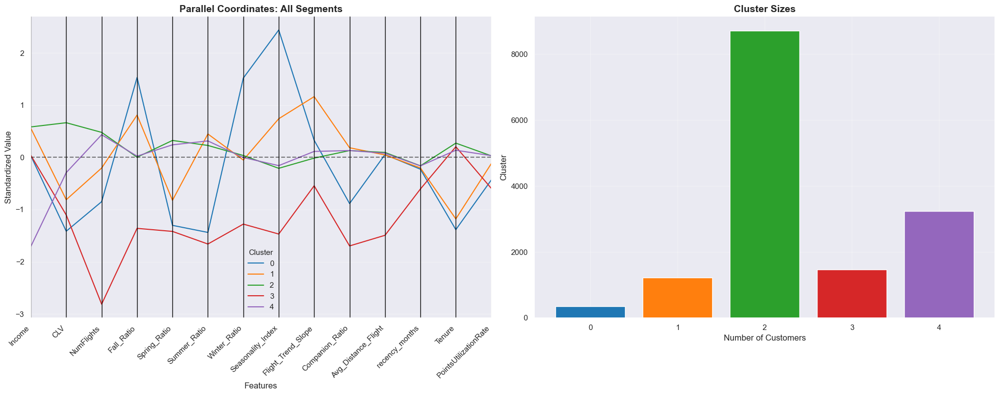

In [201]:
# Get centroids for ALL segments
all_segments = sorted(customer['merged_labels'].unique())
df_all_centroids = customer.groupby('merged_labels')[fs_metric_features].mean()

# Create figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# LEFT PLOT: Parallel coordinates for all clusters
plt.sca(ax1)
pd.plotting.parallel_coordinates(
    df_all_centroids.reset_index(),
    'merged_labels',
    color=sns.color_palette('tab10', n_colors=len(all_segments)),
    ax=ax1
)
ax1.axhline(y=0, color='black', linestyle='--', alpha=0.5, linewidth=1.5)
ax1.set_title('Parallel Coordinates: All Segments', fontsize=14, fontweight='bold')
ax1.set_ylabel('Standardized Value', fontsize=12)
ax1.set_xlabel('Features', fontsize=12)
ax1.tick_params(axis='x', rotation=45)
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=45, ha='right')
ax1.legend(title='Cluster', loc='best', title_fontsize=11)
ax1.grid(True, alpha=0.3)

# RIGHT PLOT: Cluster sizes (ordered by cluster number)
cluster_sizes = customer['merged_labels'].value_counts().sort_index()
colors = sns.color_palette('tab10', n_colors=len(all_segments))

ax2.bar(cluster_sizes.index.astype(str), cluster_sizes.values, color=colors)
ax2.set_xlabel('Number of Customers', fontsize=12)
ax2.set_ylabel('Cluster', fontsize=12)
ax2.set_title('Cluster Sizes', fontsize=14, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

C:\Users\alexc\AppData\Local\Temp\ipykernel_15064\4111810289.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




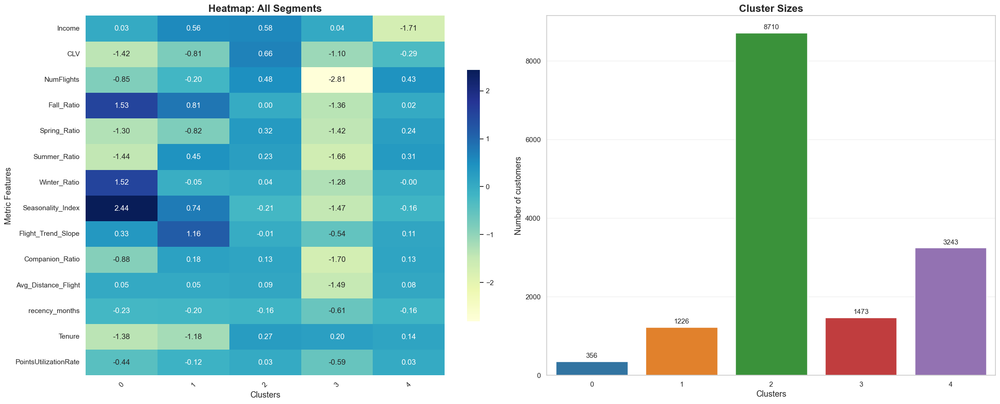

In [202]:
sns.set_style("whitegrid")

all_segments = sorted(customer['merged_labels'].unique())
df_all_centroids = customer.groupby('merged_labels')[fs_metric_features].mean().T

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 9))

# Heatmap
sns.heatmap(
    df_all_centroids,
    ax=ax1,
    cmap="YlGnBu",
    annot=True,
    fmt=".2f",
    cbar_kws={"shrink": 0.7}
)
ax1.set_title('Heatmap: All Segments', fontsize=16, fontweight='bold')
ax1.set_ylabel('Metric Features', fontsize=13)
ax1.set_xlabel('Clusters', fontsize=13)
ax1.tick_params(axis='x', rotation=45)

# Cluster sizes
cluster_sizes = customer['merged_labels'].value_counts().sort_index()
colors = sns.color_palette('tab10', n_colors=len(all_segments))

sns.barplot(
    x=cluster_sizes.index.astype(str),
    y=cluster_sizes.values,
    palette=colors,
    ax=ax2
)
ax2.set_title('Cluster Sizes', fontsize=16, fontweight='bold')
ax2.set_xlabel('Clusters', fontsize=13)
ax2.set_ylabel('Number of customers', fontsize=13)

for i, val in enumerate(cluster_sizes.values):
    ax2.text(i, val + max(cluster_sizes.values)*0.01, str(val), ha='center', fontsize=11)

plt.tight_layout()
plt.show()

In [203]:
rfm_counts = customer.groupby(['merged_labels', 'RFM_score']).size().reset_index(name='count')

# 2. Calculate the total size of each cluster
cluster_totals = customer['merged_labels'].value_counts()

# 3. Add a column for the percentage within the cluster
# We map the cluster total to each row and divide
rfm_counts['total_in_cluster'] = rfm_counts['merged_labels'].map(cluster_totals)
rfm_counts['percentage'] = (rfm_counts['count'] / rfm_counts['total_in_cluster'] * 100).round(2)

# 4. Sort and take the top 3 for each cluster
top3_rfm = rfm_counts.sort_values(['merged_labels', 'count'], ascending=[True, False]) \
                     .groupby('merged_labels') \
                     .head(3)

# 5. Clean up for display
final_top3 = top3_rfm[['merged_labels', 'RFM_score', 'count', 'percentage']]
final_top3.columns = ['Cluster', 'RFM_Score', 'Count', '%_of_Cluster']

print("--- Top 3 RFM Profiles per Cluster ---")
print(final_top3)

# Optional: Check the cumulative strength of the Top 3
cumulative = final_top3.groupby('Cluster')['%_of_Cluster'].sum().reset_index()
print("\n--- Cumulative Coverage of Top 3 (How much of the cluster is explained?) ---")
print(cumulative)

--- Top 3 RFM Profiles per Cluster ---
     Cluster RFM_Score  Count  %_of_Cluster
4          0       211    213         59.83
0          0       111     57         16.01
11         0       321     26          7.30
23         1       211    383         31.24
14         1       111    146         11.91
24         1       212    131         10.69
119        2       455    474          5.44
130        2       555    314          3.61
115        2       444    297          3.41
131        3       511   1030         69.93
132        3       512    356         24.17
133        3       513     84          5.70
165        4       321    198          6.11
179        4       443    183          5.64
169        4       342    174          5.37

--- Cumulative Coverage of Top 3 (How much of the cluster is explained?) ---
   Cluster  %_of_Cluster
0        0         83.14
1        1         53.84
2        2         12.46
3        3         99.80
4        4         17.12


In [204]:
#df_seg_4 = customer[customer["merged_labels"]==4]
#RFM_counts = (
#    df_seg_4.groupby("RFM_score").size().reset_index(name="count").sort_values("count",ascending=False)
#)
#RFM_counts


**Cluster 0: The “Once-a-Year Traditionalists”**


This small but distinctive segment is defined by **extreme seasonality**. Customers in this cluster present a very high **Seasonality Index (+2.44)**, with strong concentration in **Fall and Winter travel (+1.53)**. In contrast, value and loyalty indicators such as **CLV (-1.42)** and **Tenure (-1.38)** remain well below average. Their behavior suggests infrequent, event-driven travel rather than sustained engagement.

> **Business Impact**
> These customers are predictable but not loyal. Continuous engagement strategies are inefficient; instead, **time-specific and seasonal campaigns** (e.g., winter holidays or family travel offers) are more appropriate.

---

**Cluster 1: The “Emerging Momentum” Segment**


This segment is characterized by a **strong positive travel trend** (**Flight_Trend_Slope +1.16**) and moderate seasonality (**Seasonality Index +0.74**). Although **Tenure (-1.18)** and **CLV (-0.81)** are still below average, the increasing engagement over time indicates customers in an early growth phase.

> **Business Impact**
> This is a **high-potential segment**. Early loyalty incentives, personalized offers, and proactive retention strategies could accelerate their progression into long-term, high-value customers.

---

**Cluster 2: The “Core Flyers”**


Representing the largest cluster, this group reflects the airline’s **baseline customer profile**. Most metrics are close to the dataset average, with slightly positive **Income (+0.58)**, **CLV (+0.66)**, and **NumFlights (+0.48)**. Low volatility and near-zero seasonality indicate consistent and predictable usage patterns.

> **Business Impact**
> These customers form the **operational backbone** of the airline. While individually average, their scale makes them strategically important. Incremental upselling and broad loyalty programs can generate significant cumulative value.

---

**Cluster 3: The “Low-Engagement Drifters”**


This cluster exhibits the lowest engagement across almost all dimensions. It shows extremely low **NumFlights (-2.81)**, combined with negative **Income (-1.71)**, **CLV (-1.10)**, and **Avg_Distance_Flight (-1.49)**. The low **Seasonality Index (-1.47)** suggests disengagement rather than cyclical travel behavior.

> **Business Impact**
> These customers generate limited value and display minimal growth signals. High marketing investment is unlikely to be effective; low-cost reactivation strategies or exclusion from premium campaigns is recommended.

---

**Cluster 4: The “Steady Loyalists”**


This segment is defined by **stable and long-term behavior**. Although not excelling in high-value metrics, customers show slightly positive **Tenure (+0.14)** and near-average engagement across all features. Low seasonality indicates consistent usage over time.

> **Business Impact**
> These are reliable, low-risk customers. Retention is important, but the main opportunity lies in **cross-selling and gradual value enhancement** rather than aggressive incentive schemes.

---

#### 8.3 Profiling on Categorical Features

Here in profile we can see the distribution of the non metric features by cluster, but we can conclude that just education and marital status are relevant to the segments.

In [205]:
print(customer_original.columns)

Index(['Income', 'CLV', 'NumFlights', 'Fall_Ratio', 'Spring_Ratio',
       'Summer_Ratio', 'Winter_Ratio', 'Seasonality_Index',
       'Flight_Trend_Slope', 'Companion_Ratio', 'Avg_Distance_Flight',
       'recency_months', 'Tenure', 'PointsUtilizationRate', 'oh_male',
       'oh_College', 'oh_Doctor', 'oh_High School or Below', 'oh_Master',
       'oh_Married', 'oh_Single', 'oh_Standard', 'oh_British Columbia',
       'oh_Manitoba', 'oh_New Brunswick', 'oh_Newfoundland', 'oh_Nova Scotia',
       'oh_Ontario', 'oh_Prince Edward Island', 'oh_Quebec', 'oh_Saskatchewan',
       'oh_Yukon', 'oh_Calgary', 'oh_Charlottetown', 'oh_Dawson Creek',
       'oh_Edmonton', 'oh_Fredericton', 'oh_Halifax', 'oh_Hull', 'oh_Kelowna',
       'oh_Kingston', 'oh_London', 'oh_Moncton', 'oh_Montreal', 'oh_Ottawa',
       'oh_Peace River', 'oh_Quebec City', 'oh_Regina', 'oh_St. John's',
       'oh_Sudbury', 'oh_Thunder Bay', 'oh_Toronto', 'oh_Tremblant',
       'oh_Trenton', 'oh_Vancouver', 'oh_Victoria', 'oh

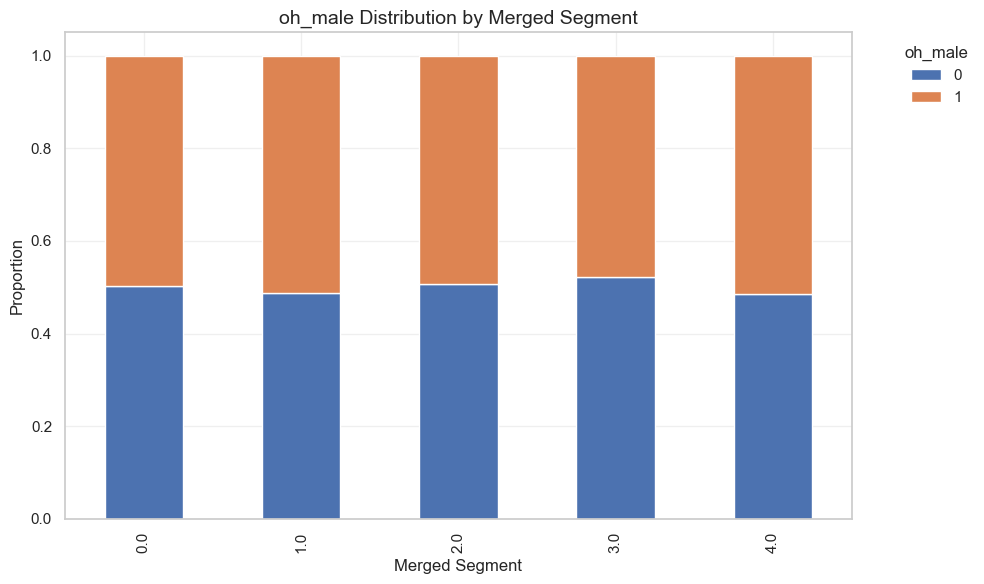

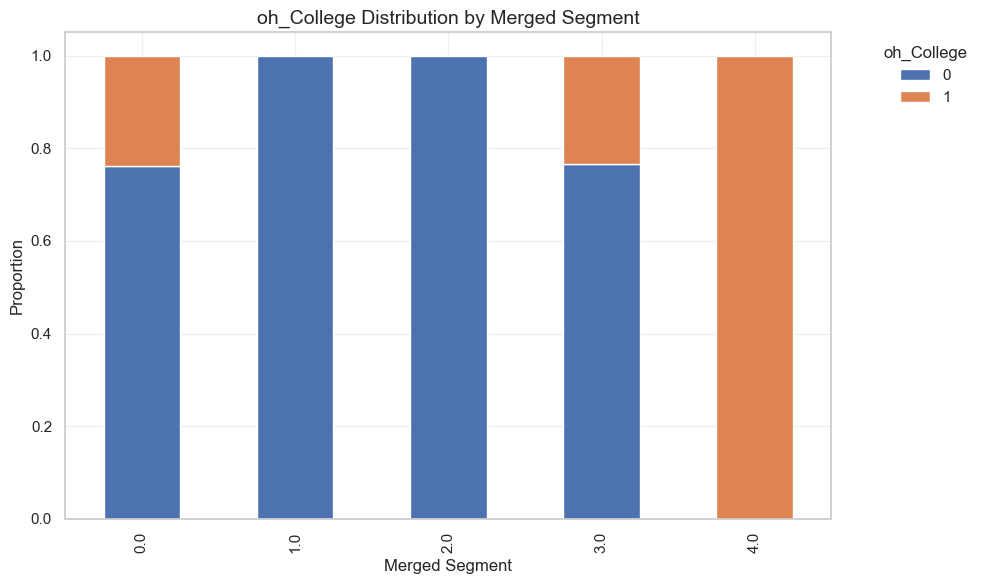

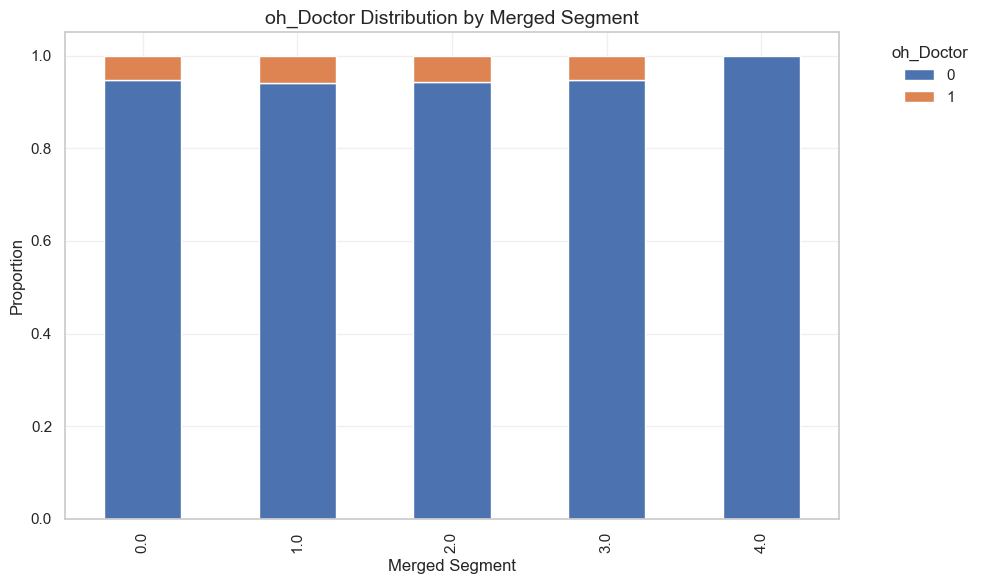

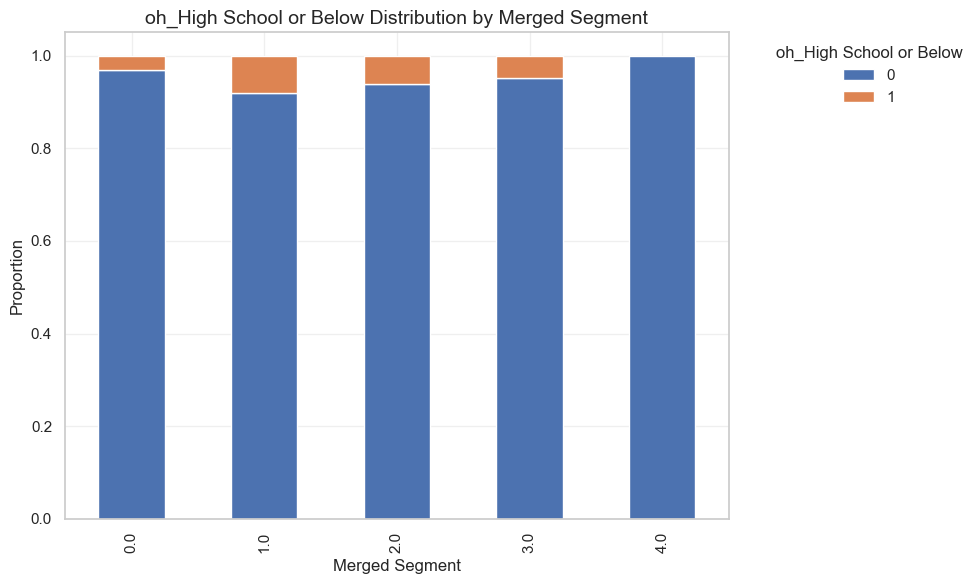

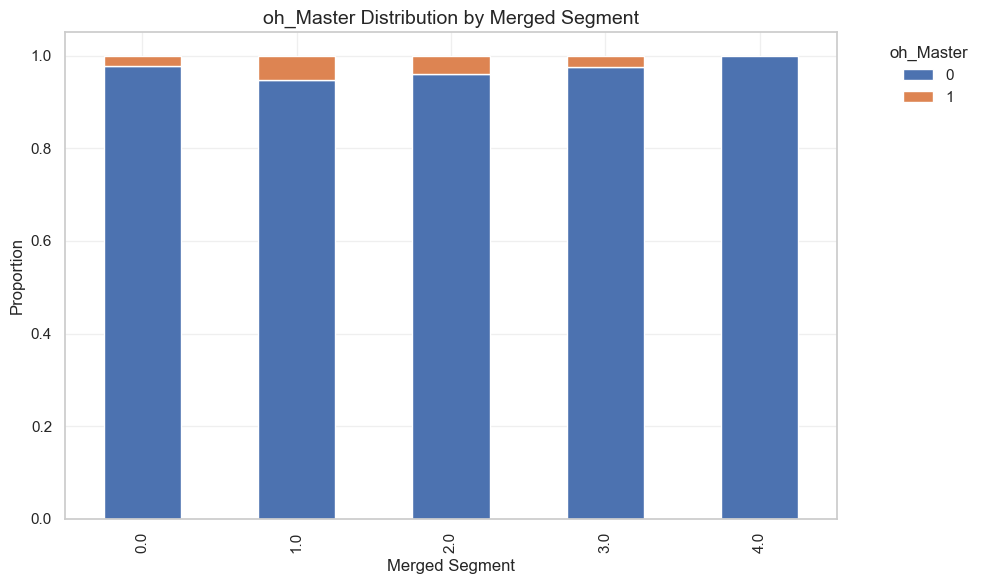

...

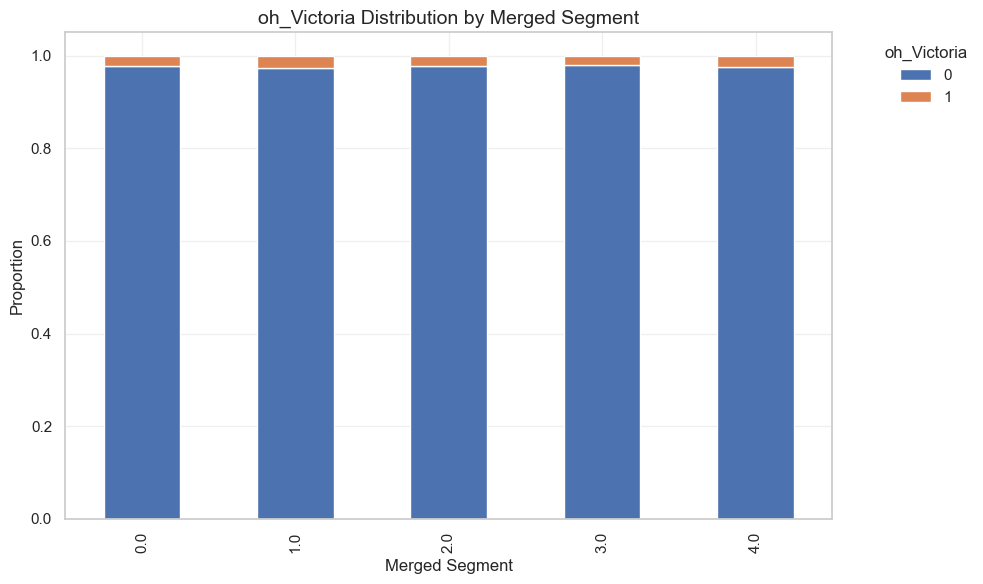

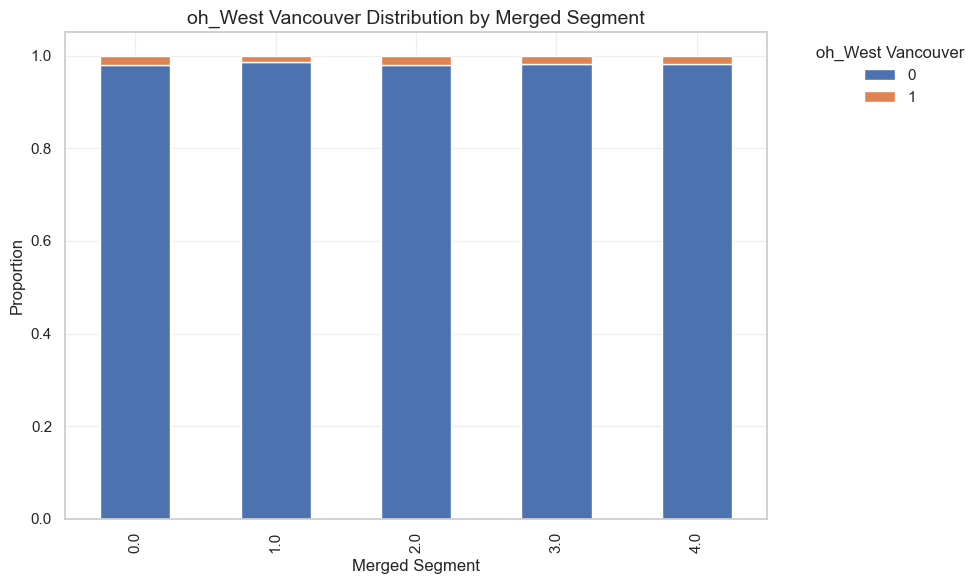

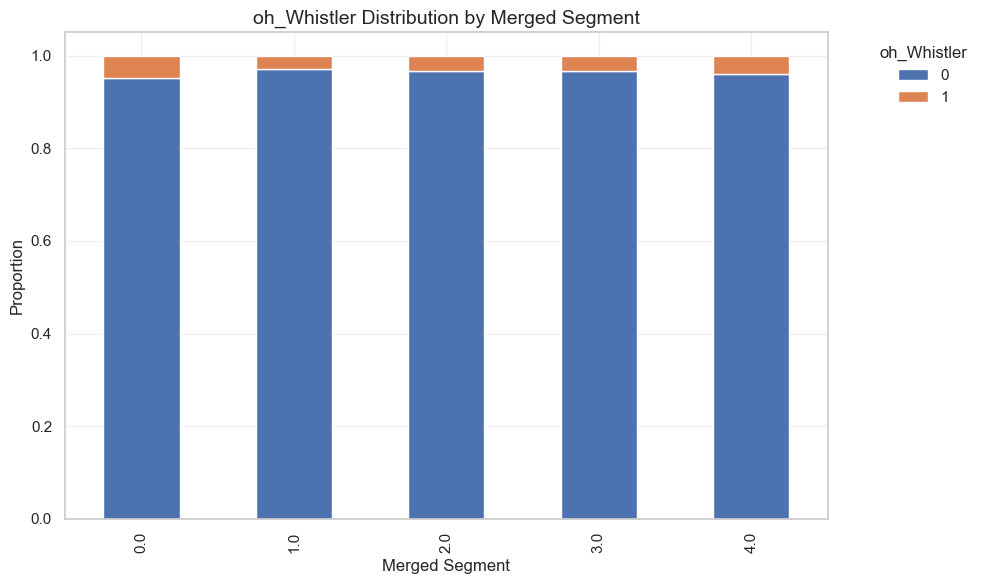

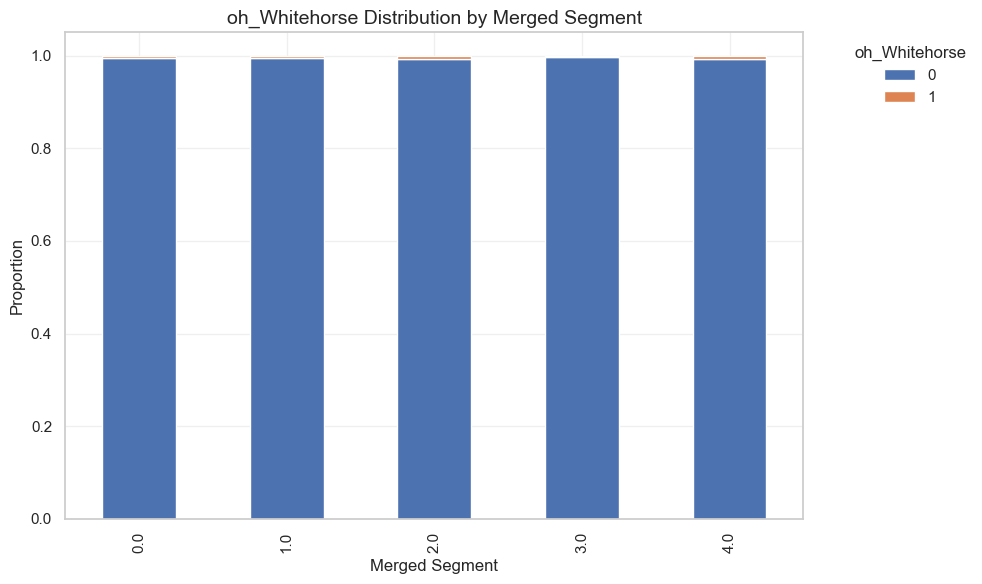

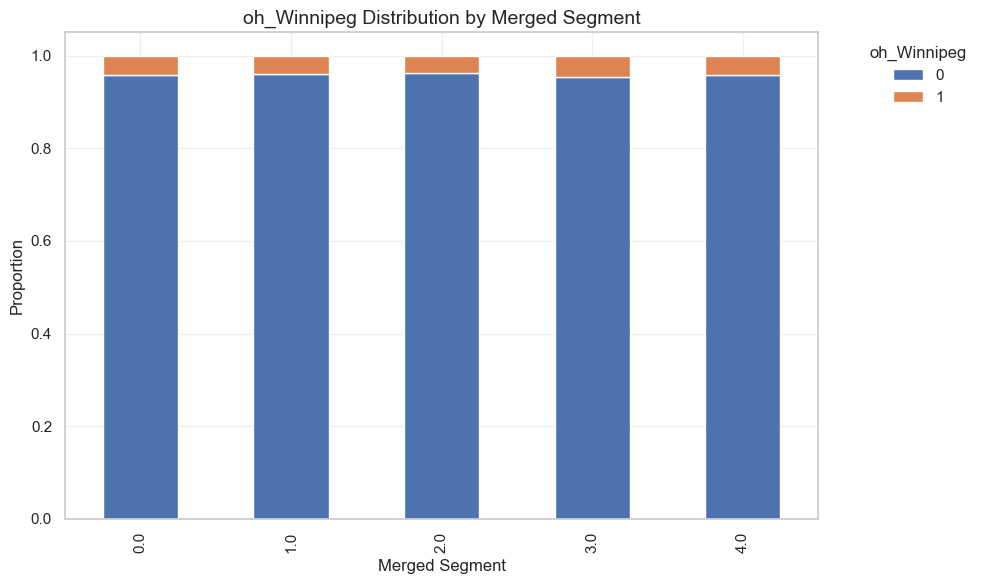

In [206]:
for i in non_metric_features:
    pd.crosstab(customer_original['merged_labels'], customer_original[i], normalize='index').plot.bar(
    stacked=True,
    figsize=(10, 6)
    )
    plt.title(f"{i} Distribution by Merged Segment", fontsize=14)
    plt.xlabel("Merged Segment")
    plt.ylabel("Proportion")
    plt.legend(title=i, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

**1. Education is the Strongest Predictor of Value**

The distinction between VIPs and the mass market is not just about how much they fly, but their professional background.

The Data: The high-value Cluster 4 is almost exclusively composed of holders of a Bachelor's degree. In contrast, the mass-market Cluster 1 has a significant portion of users with "College" education.

Conclusion: Our most profitable customers are white-collar professionals. This validates the "Wolf of Wall Street" persona, these are business travelers whose flights are likely paid for by their companies or supported by higher professional salaries.

**2. The "Cluster 3" Anomaly: The Montreal Glitch**

We previously identified Cluster 3 as the "Free Lunch Hunters" (high points use, low loyalty). The demographic data reveals exactly where this happened.

The Data: While other clusters are distributed across the country (Toronto, Vancouver, etc.), Cluster 3 is overwhelmingly concentrated in Quebec and specifically Montreal.

Conclusion: This suggests the high rate of points churning wasn't a general problem, but likely the result of a specific local campaign, partnership, or loophole in the Quebec market. It’s a regional issue, not a national one.

**3. Stability Drives Loyalty**

There is a clear correlation between life stability and airline loyalty.

The Data: Cluster 4 (VIPs) has the highest proportion of Married customers. Meanwhile, Cluster 3 (The Hunters) has the largest percentage of Single users.

Conclusion: Our VIPs are established individuals with families, valuing consistency and comfort. The "Hunters" are likely younger, single urbanites (specifically in Montreal) who have the flexibility to chase deals and switch brands aggressively.

## 9. Clusters Visualization

In [207]:
customer['merged_labels'].value_counts().sort_index()

merged_labels
0     356
1    1226
2    8710
3    1473
4    3243
Name: count, dtype: int64

In [208]:
len(fs_metric_features)

14

### 9.1. PCA

In [209]:
pca = PCA(n_components=2, random_state=42)
pca_result = pca.fit_transform(customer[fs_metric_features])

pca_result.shape

(15008, 2)

In [210]:
customer['pca_1'] = pca_result[:, 0]
customer['pca_2'] = pca_result[:, 1]

# Variance explained
var_explained = pca.explained_variance_ratio_
print(f"PCA Variance Explained:")
print(f"  PC1:      {var_explained[0]:.1%}")
print(f"  PC2:      {var_explained[1]:.1%}")
print("="*20)
print(f"  Total:    {var_explained.sum():.1%}")

PCA Variance Explained:
  PC1:      30.2%
  PC2:      20.5%
  Total:    50.7%


Here we are going to see the lossin 2D PCA projection

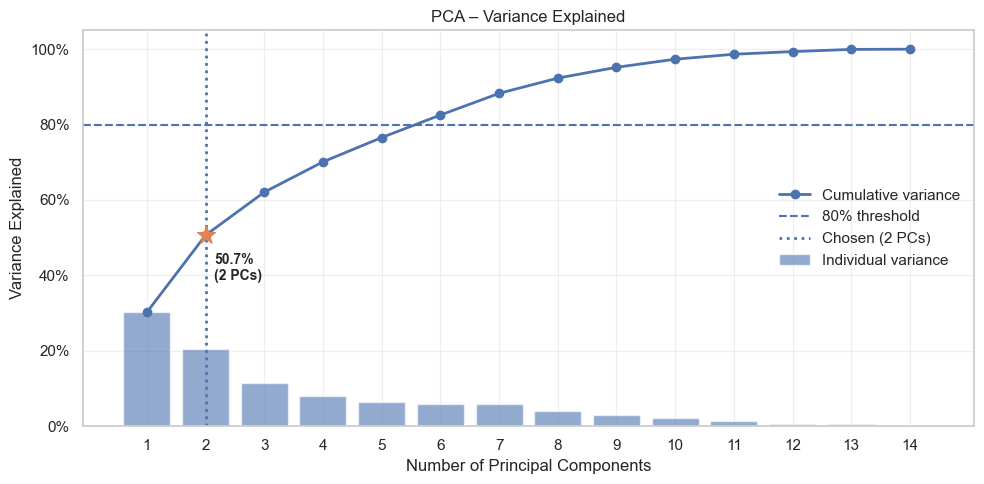


Variance Explained by Each Component
  PC1:  30.2% | Cumulative:  30.2%
  PC2:  20.5% | Cumulative:  50.7%
  PC3:  11.4% | Cumulative:  62.1%
  PC4:   8.0% | Cumulative:  70.1%
  PC5:   6.4% | Cumulative:  76.6%
  PC6:   6.0% | Cumulative:  82.5%
  PC7:   5.8% | Cumulative:  88.3%
  PC8:   4.0% | Cumulative:  92.3%
  PC9:   2.9% | Cumulative:  95.2%
  PC10:   2.1% | Cumulative:  97.3%
  PC11:   1.3% | Cumulative:  98.7%
  PC12:   0.7% | Cumulative:  99.4%
  PC13:   0.6% | Cumulative:  99.9%
  PC14:   0.1% | Cumulative: 100.0%

2 components capture 50.7% of variance
Trade-off: Simplicity vs. Information loss (49.3%)


In [211]:
plot_pca_variance(data=customer,features=fs_metric_features)

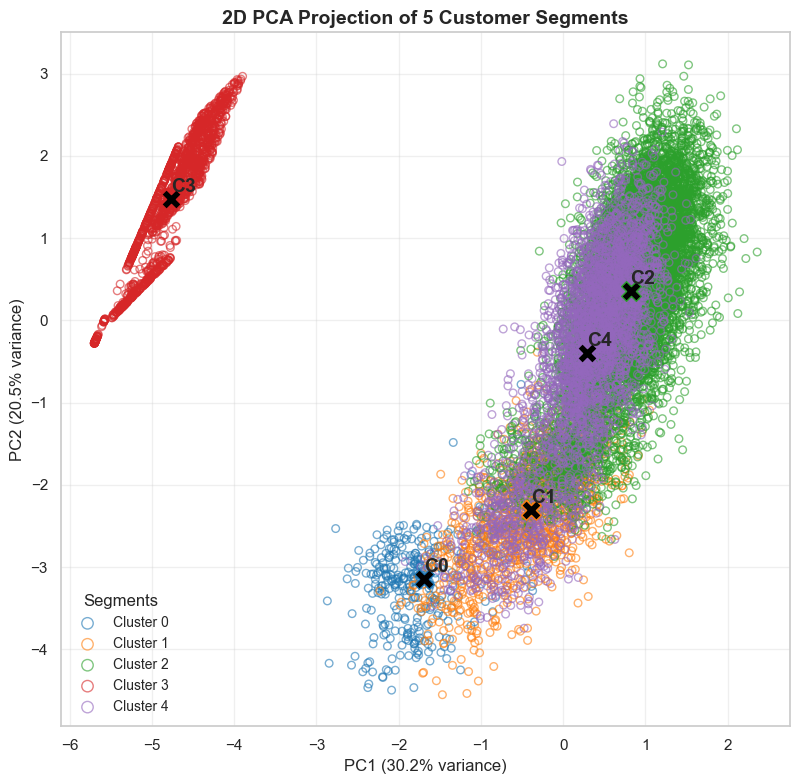

In [212]:
plot_pca_clusters(df=customer,label_col='merged_labels',pc1_col='pca_1',pc2_col='pca_2',var_explained=var_explained,title='2D PCA Projection of 5 Customer Segments')

In [213]:
pc_corr = customer[fs_metric_features+['pca_1', 'pca_2']].corr().round(3)
pc_corr = pc_corr.loc[fs_metric_features, ['pca_1', 'pca_2']]
pc_corr

,pca_1,pca_2
Income,0.092,0.142
CLV,0.698,0.564
NumFlights,0.964,-0.073
Fall_Ratio,0.313,-0.574
Spring_Ratio,0.644,0.245
Summer_Ratio,0.649,-0.111
Winter_Ratio,0.373,-0.245
Seasonality_Index,0.288,-0.682
Flight_Trend_Slope,0.045,-0.687
Companion_Ratio,0.706,-0.234


In [214]:
loadings = pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2'],
    index=fs_metric_features
)

print("PCA Component Loadings (Feature Contributions):\n")
print(loadings.round(3))

PCA Component Loadings (Feature Contributions):

                         PC1    PC2
Income                 0.053  0.099
CLV                    0.382  0.376
NumFlights             0.568 -0.052
Fall_Ratio             0.156 -0.347
Spring_Ratio           0.331  0.153
Summer_Ratio           0.348 -0.072
Winter_Ratio           0.173 -0.138
Seasonality_Index      0.127 -0.365
Flight_Trend_Slope     0.025 -0.467
Companion_Ratio        0.347 -0.140
Avg_Distance_Flight    0.258 -0.125
recency_months         0.073 -0.012
Tenure                 0.139  0.540
PointsUtilizationRate  0.124 -0.016


### 9.2. t-SNE

In [215]:
two_dim = TSNE(n_components=2, random_state=42, perplexity=30, n_iter_without_progress=500).fit_transform(customer[fs_metric_features])

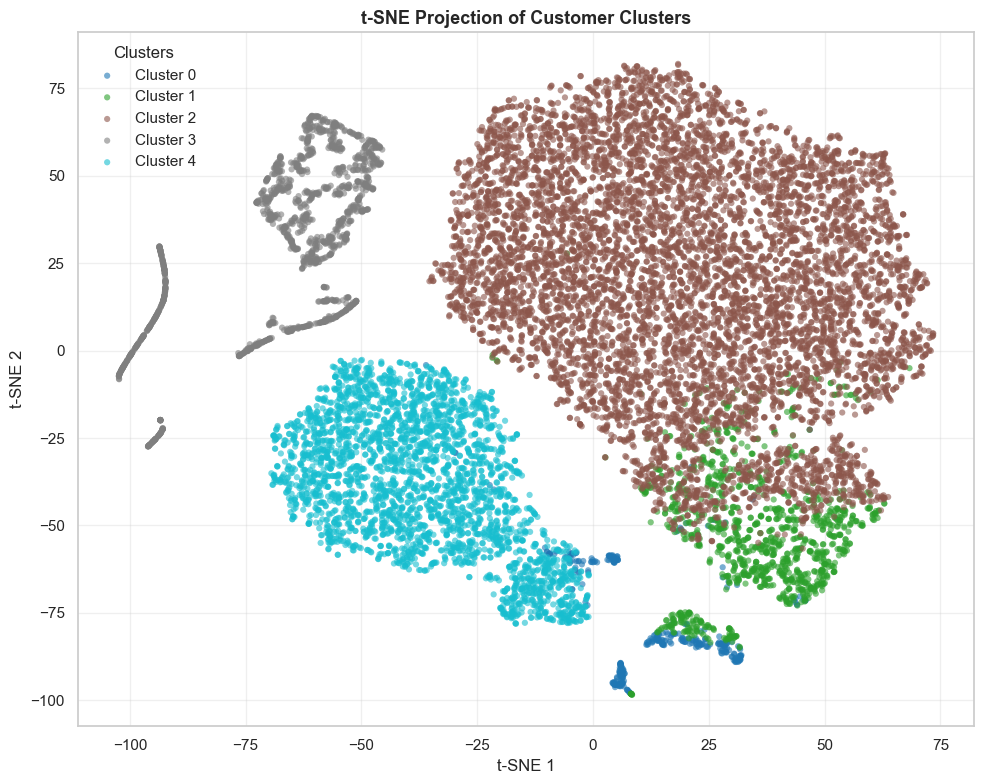

In [216]:
fig, ax = plt.subplots(figsize=(10, 8))

labels = customer['merged_labels'].values
unique_labels = np.unique(labels)

colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))

for idx, label in enumerate(unique_labels):
    mask = labels == label

    ax.scatter(
        two_dim[mask, 0],
        two_dim[mask, 1],
        c=[colors[idx]],
        alpha=0.6,
        s=20,
        edgecolors='none',
        label=f'Cluster {label}'
    )

ax.set_title("t-SNE Projection of Customer Clusters", fontsize=13, weight='bold')
ax.set_xlabel("t-SNE 1")
ax.set_ylabel("t-SNE 2")
ax.grid(True, alpha=0.3)
ax.legend(title="Clusters")

plt.tight_layout()
plt.show()


t-SNE with pca

In [217]:
two_dim = TSNE(random_state=42, perplexity=30).fit_transform(pca_result)

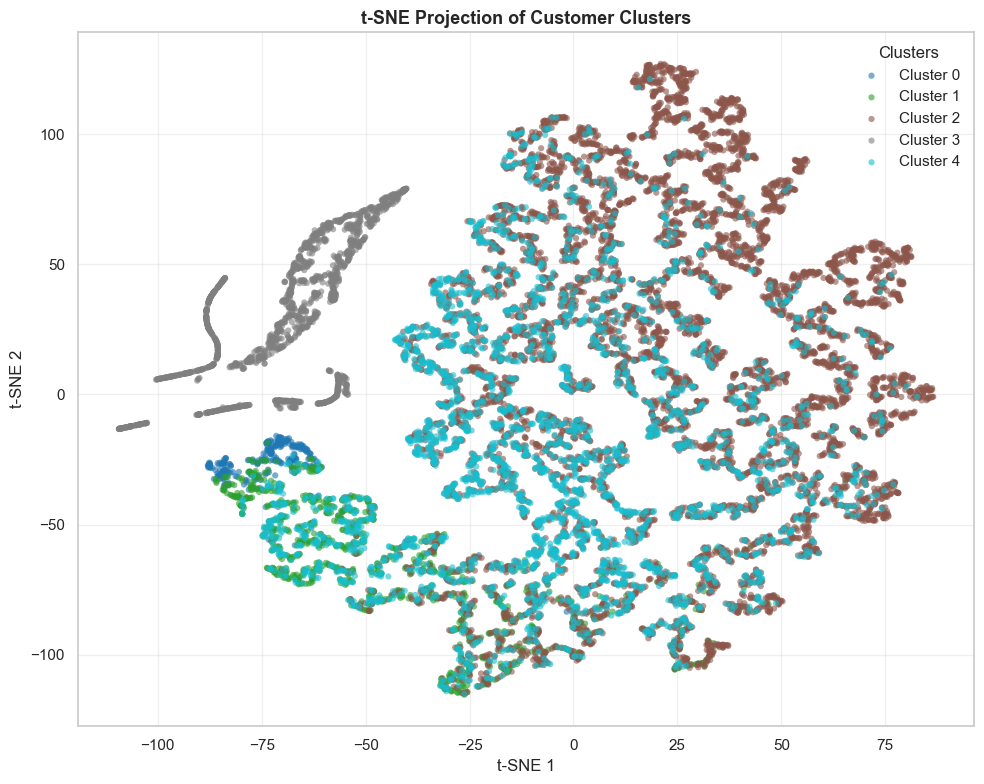

In [218]:
fig, ax = plt.subplots(figsize=(10, 8))

labels = customer['merged_labels'].values
unique_labels = np.unique(labels)

# Cores (ajusta se quiseres)
colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))

for idx, label in enumerate(unique_labels):
    mask = labels == label

    ax.scatter(
        two_dim[mask, 0],  # <- muda para a matriz t-SNE
        two_dim[mask, 1],
        c=[colors[idx]],
        alpha=0.6,
        s=20,
        edgecolors='none',
        label=f'Cluster {label}'
    )

ax.set_title("t-SNE Projection of Customer Clusters", fontsize=13, weight='bold')
ax.set_xlabel("t-SNE 1")
ax.set_ylabel("t-SNE 2")
ax.grid(True, alpha=0.3)
ax.legend(title="Clusters")

plt.tight_layout()
plt.show()


### 9.3. UMAP

In [219]:
reducer = umap.UMAP(
        n_components=2,
        n_neighbors=10,
        min_dist=0.1,
        random_state=42,
        n_jobs=1
    )
X_umap = reducer.fit_transform(customer[fs_metric_features])

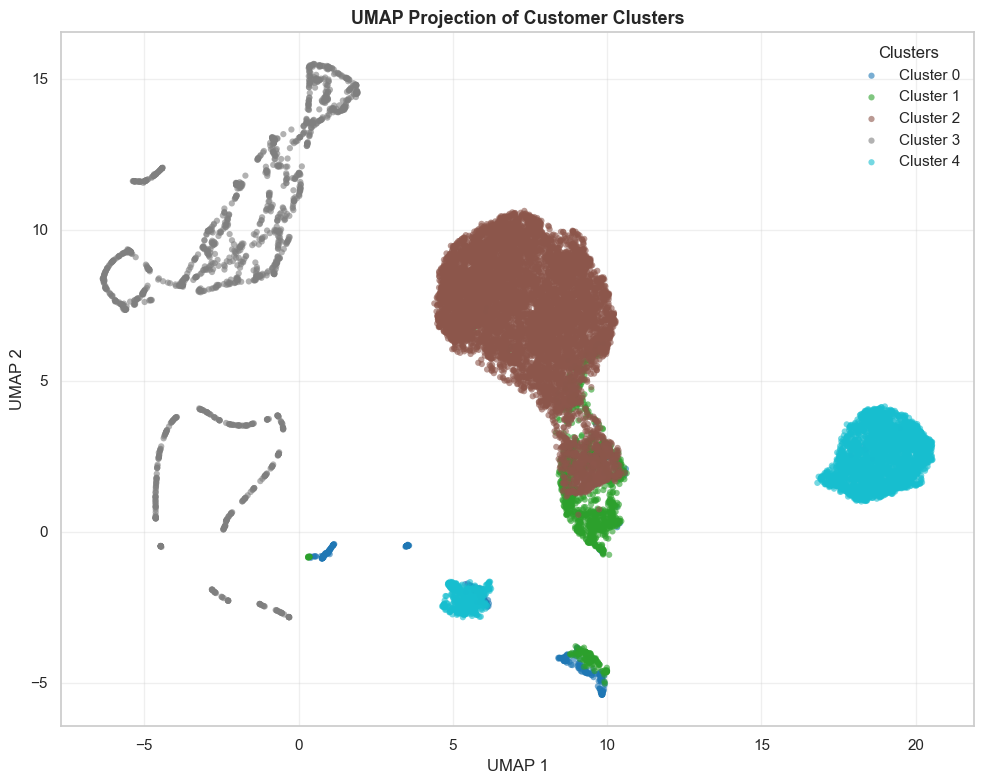

In [220]:
fig, ax = plt.subplots(figsize=(10, 8))

labels = customer['merged_labels'].values
unique_labels = np.unique(labels)

# Cores (ajusta se quiseres)
colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))

for idx, label in enumerate(unique_labels):
    mask = labels == label

    ax.scatter(
        X_umap[mask, 0],
        X_umap[mask, 1],
        c=[colors[idx]],
        alpha=0.6,
        s=20,
        edgecolors='none',
        label=f'Cluster {label}'
    )

ax.set_title("UMAP Projection of Customer Clusters", fontsize=13, weight='bold')
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.grid(True, alpha=0.3)
ax.legend(title="Clusters")

plt.tight_layout()
plt.show()

## 10. Statistical significance testing

In [221]:
for col in clustering_perspectives['Value_Segmentation'] + clustering_perspectives['Behavioral_Segmentation'] + clustering_perspectives['Seasonality_Segmentation']:
    groups = [customer[customer['merged_labels'] == k][col].values for k in sorted(customer['merged_labels'].unique())]

    # perform Kruskal-Wallis H-test
    stat, p_value = stats.kruskal(*groups)
    print(f"Variável: {col}")
    print(f"  H-Statistic: {stat:.2f}")
    print(f"  P-Value:     {p_value:.4e}") 
    
    if p_value < 0.05:
        print("The distributions differ significantly between clusters")
    else:
        print("There is no significant difference")
    print("-" * 60)

Variável: CLV
  H-Statistic: 8163.28
  P-Value:     0.0000e+00
The distributions differ significantly between clusters
------------------------------------------------------------
Variável: Income
  H-Statistic: 7508.72
  P-Value:     0.0000e+00
The distributions differ significantly between clusters
------------------------------------------------------------
Variável: PointsUtilizationRate
  H-Statistic: 3217.28
  P-Value:     0.0000e+00
The distributions differ significantly between clusters
------------------------------------------------------------
Variável: Tenure
  H-Statistic: 3164.02
  P-Value:     0.0000e+00
The distributions differ significantly between clusters
------------------------------------------------------------
Variável: NumFlights
  H-Statistic: 6792.85
  P-Value:     0.0000e+00
The distributions differ significantly between clusters
------------------------------------------------------------
Variável: Avg_Distance_Flight
  H-Statistic: 4013.42
  P-Value:     0